# Title
Home credit Default risk
# Group number: 02
# Team members: (clockwise in the picture)
1. Kiran Kanrandikar(kikarand@iu.edu)
2. Yashwitha Reddy(ypondug@iu.edu)
3. Rahul(rgomathi@iu.edu)
4. Sathish(satsoun@iu.edu)
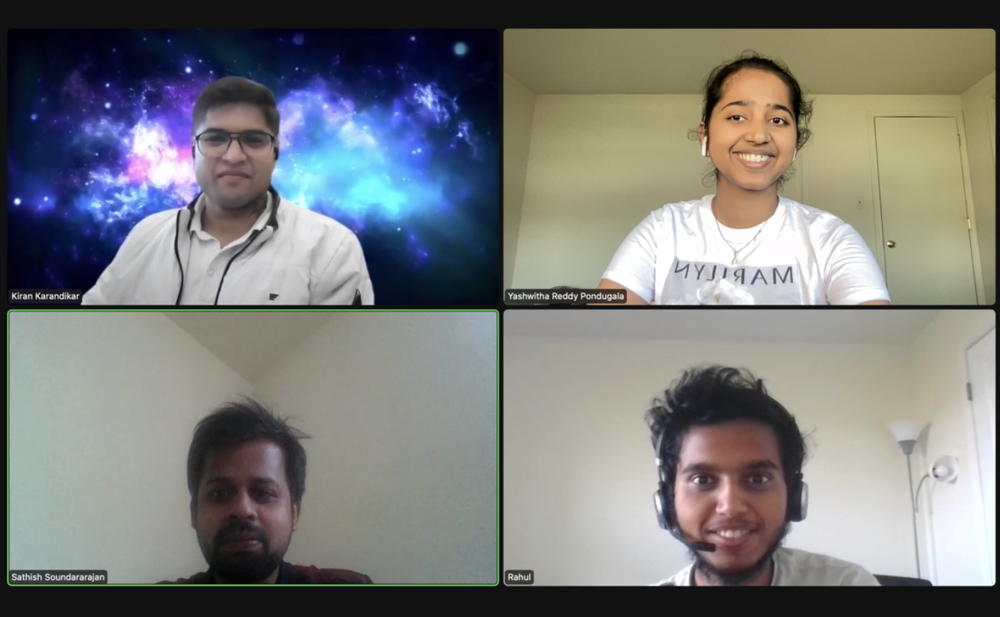

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg uncompressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data


# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [ ]:
!pip install kaggle

In [ ]:
!pwd
# /root/shared/PycharmProjects/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/WIP_phase-1/kaggle.json

In [ ]:
!ls

In [ ]:
!rm -rf ~/.kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle competitions files home-credit-default-risk

# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [ ]:
# Commented by kiran
# DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
# DATA_DIR = os.path.join('./ddddd/')
# !mkdir $DATA_DIR

# data dir for kiran
DATA_DIR = ""   
# Google collab dir: Account: kikarand@iu.edu
# DATA_DIR="gdrive/MyDrive/data/"
!ls -l $DATA_DIR

### Mount Gdrive

In [ ]:
# Added to download files in google collab
from google.colab import drive,files
drive.mount('/content/gdrive')
#this will prompt you to upload the kaggle.json
# files.upload() 
!ls -lha kaggle.json



In [ ]:
!rm -rf ~/.kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
DATA_DIR = "/content/"
!mkdir $DATA_DIR
!ls -l $DATA_DIR

In [ ]:
# IF download file do not exists
! kaggle competitions download -c home-credit-default-risk 

### Imports

In [ ]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
!pip install xgboost
from  xgboost import XGBClassifier
import warnings
warnings.filterwarnings('ignore')


### Extract Zip Files, ignore if unzipped already

In [ ]:
unzippingReq = True
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile('home-credit-default-risk.zip', 'r')
    zip_ref.extractall()
    zip_ref.close()
#     zip_ref = zipfile.ZipFile('application_test.csv.zip', 'r')
#     zip_ref.extractall('datasets')
#     zip_ref.close()
#     zip_ref = zipfile.ZipFile('bureau_balance.csv.zip', 'r')
#     zip_ref.extractall('datasets')
#     zip_ref.close()
#     zip_ref = zipfile.ZipFile('bureau.csv.zip', 'r')
#     zip_ref.extractall('datasets')
#     zip_ref.close()
#     zip_ref = zipfile.ZipFile('credit_card_balance.csv.zip', 'r')
#     zip_ref.extractall('datasets')
#     zip_ref.close()
#     zip_ref = zipfile.ZipFile('installments_payments.csv.zip', 'r')
#     zip_ref.extractall('datasets')
#     zip_ref.close()
#     zip_ref = zipfile.ZipFile('POS_CASH_balance.csv.zip', 'r')
#     zip_ref.extractall('datasets')
#     zip_ref.close()
#     zip_ref = zipfile.ZipFile('previous_application.csv.zip', 'r')
#     zip_ref.extractall('datasets')
#     zip_ref.close()

## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

In [ ]:
data_dict_path = os.path.join(DATA_DIR, "HomeCredit_columns_description.csv")
data_dict = pd.read_csv(data_dict_path, engine="python", encoding="utf-8" ,header=0, encoding_errors='ignore')

In [ ]:
data_dict["Table"].unique()

### ***Load Application train***
---



In [ ]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    display(df.describe())
    display(df.isna().sum())
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [ ]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

The application dataset has the most information about the client: Gender, income, family status, education ...

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [ ]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
      datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)


In [ ]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


# One Click Setup | Imports | Load datasets

> Below cells are redundant and are added to quickly load all datasets in events like kernel failure.

In [7]:
import gc
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import set_config
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_regression, chi2
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.naive_bayes import BernoulliNB
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler, Normalizer, OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

import warnings
warnings.filterwarnings('ignore')
# from google.colab import drive,files
# drive.mount('/content/gdrive')

# # Google collab dir: Account: kikarand@iu.edu
# DATA_DIR = "gdrive/MyDrive/data/"


def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    display(df.describe())
    display(df.isna().sum())
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily

ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
		"previous_application","POS_CASH_balance")

DATA_DIR=''

for ds_name in ds_names:
  datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)
	  

for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')
	
	
pa = datasets["previous_application"]
ip = datasets["installments_payments"]
pcb = datasets["POS_CASH_balance"]
ccb = datasets["credit_card_balance"]
bur = datasets["bureau"]
bb = datasets["bureau_balance"]
appsDF = datasets["previous_application"]

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


SK_ID_CURR                       0
NAME_CONTRACT_TYPE               0
CODE_GENDER                      0
FLAG_OWN_CAR                     0
FLAG_OWN_REALTY                  0
                              ... 
AMT_REQ_CREDIT_BUREAU_DAY     6049
AMT_REQ_CREDIT_BUREAU_WEEK    6049
AMT_REQ_CREDIT_BUREAU_MON     6049
AMT_REQ_CREDIT_BUREAU_QRT     6049
AMT_REQ_CREDIT_BUREAU_YEAR    6049
Length: 121, dtype: int64

bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64

bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,...,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.840312e+06,3.840312e+06
mean,1.904504e+06,2.783242e+05,-3.452192e+01,5.830016e+04,1.538080e+05,5.961325e+03,7.433388e+03,2.881696e+02,2.968805e+03,3.540204e+03,...,5.596588e+04,5.808881e+04,5.809829e+04,3.094490e-01,7.031439e-01,4.812496e-03,5.594791e-01,2.082508e+01,9.283667e+00,3.316220e-01
std,5.364695e+05,1.027045e+05,2.666775e+01,1.063070e+05,1.651457e+05,2.822569e+04,3.384608e+04,8.201989e+03,2.079689e+04,5.600154e+03,...,1.025336e+05,1.059654e+05,1.059718e+05,1.100401e+00,3.190347e+00,8.263861e-02,3.240649e+00,2.005149e+01,9.751570e+01,2.147923e+01
min,1.000018e+06,1.000060e+05,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,...,-4.233058e+05,-4.202502e+05,-4.202502e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434385e+06,1.895170e+05,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,0.000000e+00,0.000000e+00
50%,1.897122e+06,2.783960e+05,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01,0.000000e+00,0.000000e+00
75%,2.369328e+06,3.675800e+05,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,...,8.535924e+04,8.889949e+04,8.891451e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.200000e+01,0.000000e+00,0.000000e+00
max,2.843496e+06,4.562500e+05,-1.000000e+00,1.505902e+06,1.350000e+06,2.115000e+06,2.287098e+06,1.529847e+06,2.239274e+06,2.028820e+05,...,1.472317e+06,1.493338e+06,1.493338e+06,5.100000e+01,1.650000e+02,1.200000e+01,1.650000e+02,1.200000e+02,3.260000e+03,3.260000e+03


SK_ID_PREV                         0
SK_ID_CURR                         0
MONTHS_BALANCE                     0
AMT_BALANCE                        0
AMT_CREDIT_LIMIT_ACTUAL            0
AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_CURRENT               0
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
AMT_PAYMENT_CURRENT           767988
AMT_PAYMENT_TOTAL_CURRENT          0
AMT_RECEIVABLE_PRINCIPAL           0
AMT_RECIVABLE                      0
AMT_TOTAL_RECEIVABLE               0
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_CURRENT               0
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
CNT_INSTALMENT_MATURE_CUM     305236
NAME_CONTRACT_STATUS               0
SK_DPD                             0
SK_DPD_DEF                         0
dtype: int64

installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,5.362029e+05,1.027183e+05,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,1.000001e+06,1.000010e+05,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,1.780000e+02,2.770000e+02,-1.000000e+00,-1.000000e+00,3.771488e+06,3.771488e+06


SK_ID_PREV                   0
SK_ID_CURR                   0
NUM_INSTALMENT_VERSION       0
NUM_INSTALMENT_NUMBER        0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT        2905
AMT_INSTALMENT               0
AMT_PAYMENT               2905
dtype: int64

previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9.975287e+06,9.975271e+06,1.000136e+07,1.000136e+07
mean,1.903217e+06,2.784039e+05,-3.501259e+01,1.708965e+01,1.048384e+01,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,1.199506e+01,1.110906e+01,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,1.000000e+01,3.000000e+00,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,1.200000e+01,7.000000e+00,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,2.400000e+01,1.400000e+01,0.000000e+00,0.000000e+00
max,2.843499e+06,4.562550e+05,-1.000000e+00,9.200000e+01,8.500000e+01,4.231000e+03,3.595000e+03


SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
dtype: int64

dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


# Exploratory Data Analysis

## Summary of Application train

In [ ]:
datasets["application_train"].info()

In [ ]:
datasets["application_train"].describe() #numerical only features

In [ ]:
datasets["application_test"].describe() #numerical only features

In [ ]:
datasets["application_train"].describe(include='all') #look at all categorical and numerical

## Missing data for application train

In [ ]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(40)

In [ ]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

## Distribution of the target column 

In [ ]:
# datasets["application_train"]['TARGET'].astype(int).plot.hist();

fig, ax = plt.subplots(1,1, figsize=(10,10), dpi=400)
ax.set_title("Credit Application vs Taget : Count Plot")
sns.countplot(datasets["application_train"]['TARGET'], ax=ax)

## Correlation with  the target column 

In [ ]:
application_train_corr = datasets["application_train"].corr()
sorted_target = application_train_corr["TARGET"].sort_values()
tail_10 = sorted_target.tail(10)
head_10 = sorted_target.head(10)

print('Most Positive Correlations:\n', tail_10)
print('\nMost Negative Correlations:\n', head_10)


In [ ]:
tail_10_corr = application_train_corr[[_ for _ in tail_10.index]].loc[[_ for _ in tail_10.index]]
head_10_corr_list = [_ for _ in head_10.index]
head_10_corr_list.append("TARGET")
head_10_corr = application_train_corr[head_10_corr_list].loc[head_10_corr_list]


# set up the matplotlib figure
f, ax = plt.subplots(1,2, figsize=(25, 25), dpi=400)

# generate a mask for the lower triangle
mask = np.zeros_like(tail_10_corr, dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 11, as_cmap=True)

# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(tail_10_corr, mask=mask, cmap=cmap, vmax=.3,
            square=True, 
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax[0], annot=True);
ax[0].set_title("Most Positive Correlations")

# generate a mask for the lower triangle
mask = np.zeros_like(head_10_corr, dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 11, as_cmap=True)

# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(head_10_corr, mask=mask, cmap=cmap, vmax=.3,
            square=True, 
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax[1], annot=True);

ax[1].set_title("Most Negative Correlations")



## Applicants Age 

In [ ]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client')
plt.xlabel('Age (years)')
plt.ylabel('Count')

## Applicants years of employments

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,10),dpi=400)
plt.hist(datasets["application_train"]['DAYS_EMPLOYED'] /365, bins = 25)
plt.title('')
plt.xlabel('Years of Employment (years)')
plt.ylabel('Count')

### Interesting observation: `DAYS_EMPLOYED` : some rows have value as 365243( equivalent to 1000 years),i.e some people are employed for 1000 years

## Applicants occupations

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"],ax=ax);

ax.set_title('Applicants Occupation');
plt.xticks(rotation=90);

## Applicants Income Type


In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='NAME_INCOME_TYPE', data=datasets["application_train"],ax=ax);

ax.set_title('Applicants Income Type');
plt.xticks(rotation=90);

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='NAME_HOUSING_TYPE', data=datasets["application_train"],ax=ax);

ax.set_title('Applicants Housing Type');
plt.xticks(rotation=90);

## Target vs Gender

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='TARGET', data=datasets["application_train"],ax=ax, hue="CODE_GENDER");

## Family Status of Loan applicants

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='CODE_GENDER', data=datasets["application_train"],ax=ax, hue="NAME_FAMILY_STATUS")

In [ ]:
features = ["TARGET", "EXT_SOURCE_3", "EXT_SOURCE_2", "EXT_SOURCE_1", "DAYS_EMPLOYED"]
sns.pairplot(datasets["application_train"][features])

### Observation: The relationship between `TARGET` and "EXT_SOURCE_3", "EXT_SOURCE_2", "EXT_SOURCE_1", "DAYS_EMPLOYED" is not linear and monotonic.

# Dataset : `bureau`

In [8]:
bur = datasets["bureau"]

In [ ]:
bur.head(30)

In [ ]:
bur.info()

In [ ]:
bur.columns

In [ ]:
bur.describe()

In [ ]:
bur.isna().sum()

In [ ]:
app_train = datasets['application_train']
app_train_req = app_train[["SK_ID_CURR", "TARGET"]]
merged_df = pd.merge(bur, app_train_req, how="left")

In [ ]:
merged_df.corr()["TARGET"].sort_values()

In [ ]:
# set up the matplotlib figure
f, ax = plt.subplots(1,1, figsize=(25, 25),dpi=400)

# generate a mask for the lower triangle
mask = np.zeros_like(merged_df.corr(), dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 11, as_cmap=True)

# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(merged_df.corr(), mask=mask, cmap=cmap, vmax=.3,
            square=True, 
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax, annot=True);
ax.set_title("Correaltion matrix for Bureau and Target ")

In [ ]:
app_train_req[app_train_req.TARGET==0]

In [ ]:
len(app_train_req.SK_ID_CURR.unique())

In [ ]:
len(bur.SK_ID_CURR.unique())

In [ ]:
len(datasets["application_test"].SK_ID_CURR.unique())

In [ ]:
train_diff = np.setdiff1d(bur.SK_ID_CURR.unique(), app_train_req.SK_ID_CURR.unique())
test_diff = np.setdiff1d(train_diff, datasets["application_test"].SK_ID_CURR.unique())
len(test_diff)

## Observation: `Bureau` contains record for all `SK_ID_CURR`

In [ ]:
observation_ids = [100002, 100031, 100003]
for grp, df in bur.groupby("SK_ID_CURR"):
    if grp in observation_ids:
        display(pd.merge(df, app_train_req, how="left"))
        observation_ids.remove(grp)
        if len(observation_ids) ==0:
            break
if len(observation_ids) !=0:
    print("NO PREVIOUS APPLICATION FOUND FOR :{}".format(observation_ids))

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10),dpi=400)
sns.countplot(x='CREDIT_TYPE', data=bur,ax=ax)
ax.set_title("Applicants Credit Type")
plt.xticks(rotation="90")

### Bureau: Applicants Days Credit

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(15,15), dpi=400)
sns.histplot(bur["DAYS_CREDIT"]/-365,ax=ax, kde=True, bins=24)
ax.set_title("Applicants Days Credit")
ax.set_xlabel("Number of years")


In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(15,15), dpi=400)
sns.countplot(x="CREDIT_CURRENCY", data=bur,ax=ax,  hue="CREDIT_ACTIVE")

### Applicants Credit history status

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(15,15), dpi=400)
sns.countplot(x="CREDIT_ACTIVE", data=bur,ax=ax)

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(15,15), dpi=400)
sns.histplot(bur["CREDIT_DAY_OVERDUE"]/365,ax=ax)
ax.set_title("Applicants: Credit overdue")
ax.set_xlabel("Credit overdue in years")

### Observation: `CREDIT_CURRENCY` has 4 types but the data majorly contain only one type

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.histplot(bur["SK_ID_CURR"].value_counts().sort_values(), cumulative=True, ax=ax)
ax.set_title("Credit Bureau records of applicants ")
ax.set_xlabel("Applicants id")
ax.set_ylabel("Cumulative Records")


In [ ]:
bur_sk_ids = bur["SK_ID_CURR"].value_counts().sort_values()

### Applicants with more than 5, 10, >15 Bureau records

In [ ]:
print(" >5 : --> {}\n >10 : --> {}\n >15 : --> {}\n >20 : --> {}".format(
    len(bur_sk_ids[bur_sk_ids >5]),
    len(bur_sk_ids[bur_sk_ids >10]),
    len(bur_sk_ids[bur_sk_ids >15]),
    len(bur_sk_ids[bur_sk_ids >20]),
))

### Insights on aggregated data

In [ ]:
agg_data = bur.groupby("SK_ID_CURR").agg(['mean','count','sum','min','max'])
agg_data.columns

In [ ]:
print("-------------DAYS_CREDIT--------------------")
display(agg_data.head(5)["DAYS_CREDIT"])
print("-------------CREDIT_DAY_OVERDUE--------------------")
display(agg_data.head(5)["CREDIT_DAY_OVERDUE"])
print("-------------AMT_CREDIT_MAX_OVERDUE--------------------")
display(agg_data.head(5)["AMT_CREDIT_MAX_OVERDUE"])
print("-------------AMT_CREDIT_SUM--------------------")
display(agg_data.head(5)["AMT_CREDIT_SUM"])
print("-------------AMT_CREDIT_SUM_LIMIT--------------------")
display(agg_data.head(5)["AMT_CREDIT_SUM_LIMIT"])
print("-------------AMT_CREDIT_SUM_OVERDUE--------------------")
display(agg_data.head(5)["AMT_CREDIT_SUM_OVERDUE"])
print("-------------AMT_ANNUITY--------------------")
display(agg_data.head(5)["AMT_ANNUITY"])

# Dataset: bureau_balance

In [9]:
bb = datasets["bureau_balance"]

In [ ]:
bb.head(30)

In [ ]:
bb.info()

In [ ]:
bb.describe()

In [ ]:
bb.isna().sum()

In [ ]:
bb.STATUS.unique()

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='STATUS', data=bb,ax=ax)
ax.set_title("Applicants Repayment Staus Count")

In [ ]:
bb.groupby("SK_ID_BUREAU").count().sort_values(by="MONTHS_BALANCE")

## Observation: we can use the status column to better understand the applicants re-payments behaviour per credit

## Questions:  What different `status` code indicates, do they have any siginificane??

# Dataset: previous_application

In [10]:
pa = datasets["previous_application"]

In [ ]:
pa.info()

In [ ]:
pa.describe()

In [ ]:
pa.head(10)

In [ ]:
pa.isna().sum()

In [ ]:
len(pa.SK_ID_CURR.unique())

In [ ]:
app_train = datasets['application_train']
app_train_req = app_train[["SK_ID_CURR", "TARGET"]]
merged_df = pd.merge(pa, app_train_req, how="left")

In [ ]:
merged_df

In [ ]:
merged_df.corr()["TARGET"].sort_values()

In [ ]:
# set up the matplotlib figure
f, ax = plt.subplots(1,1, figsize=(25, 25), dpi=400)

# generate a mask for the lower triangle
mask = np.zeros_like(merged_df.corr(), dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 11, as_cmap=True)

# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(merged_df.corr(), mask=mask, cmap=cmap, vmax=.3,
            square=True, 
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax, annot=True);
ax.set_title("Correaltion matrix for Previous Applications and Target ")

In [ ]:
pa.groupby("SK_ID_CURR").count()

## Features can be used from `previous_application` when grouped by `"SK_ID_CURR"`

In [ ]:
app_train_req[app_train_req.TARGET==1].head(20)

In [ ]:
observation_ids = [100003, 100192, 100286]
for grp, df in pa.groupby("SK_ID_CURR"):
    if grp in observation_ids:
        display(pd.merge(df, app_train_req, how="left"))
        observation_ids.remove(grp)
        if len(observation_ids) ==0:
            break
if len(observation_ids) !=0:
    print("NO PREVIOUS APPLICATION FOUND FOR :{}".format(observation_ids))

## Design Question: How to navigate around situation where no `previous_application` exits for `SK_ID_CURR`

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='NAME_CONTRACT_TYPE', data=pa,ax=ax)
ax.set_title("Previous applications Contract Type")

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='NAME_YIELD_GROUP', data=pa,ax=ax)
ax.set_title("Previous applications name yield groups")

In [ ]:
pa_sk_ids = pa['SK_ID_CURR'].value_counts()


In [ ]:
len(pa_sk_ids[pa_sk_ids==1])

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)

sns.histplot(pa['SK_ID_CURR'].value_counts(), element="step", ax=ax)
ax.set_ylabel("Previous application counts")
ax.set_xlabel("Applicants with similar application counts")

# Dataset: `credit_card_balance`

In [11]:
ccb = datasets["credit_card_balance"]

In [ ]:
ccb.head(10)

In [ ]:
ccb.describe()

In [ ]:
ccb.info()

In [ ]:
ccb.isna().sum()

In [ ]:
ccb["SK_ID_PREV"].value_counts(dropna=False).sort_values()

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)

sns.histplot(ccb['SK_ID_PREV'].value_counts(), element="poly", ax=ax, cumulative=True)
ax.set_ylabel("Credit history for months")
ax.set_xlabel("Applicants with similar credit history counts")

ax.set_title("Distribution of Credit for applicants")

### Selecting random `SK_ID_PREV` to gain insights

In [ ]:
app_train = datasets['application_train']
app_train_req = app_train[["SK_ID_CURR", "TARGET"]]

In [ ]:
app_train_ccb = pd.merge(app_train_req, ccb[["SK_ID_CURR","SK_ID_PREV"]], how="left")
app_train_ccb.fillna(0, inplace=True)
app_train_ccb.SK_ID_PREV=app_train_ccb.SK_ID_PREV.astype(int)

In [ ]:
display(app_train_ccb[app_train_ccb.TARGET==1].sort_values(by="SK_ID_PREV",ascending=False).head(5))
display(app_train_ccb[app_train_ccb.TARGET==0].sort_values(by="SK_ID_PREV",ascending=False).head(5))

In [ ]:
observation_ids = [2843461, 2843493, 2843478]
for grp, df in ccb.groupby("SK_ID_PREV"):
    if grp in observation_ids:        
        display(pd.merge(df, app_train_req, how="left").sort_values(by="MONTHS_BALANCE", ascending=False))
        observation_ids.remove(grp)
        if len(observation_ids) ==0:
            break

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='NAME_CONTRACT_STATUS', data=ccb,ax=ax)
ax.set_xlabel("Contract Type")
ax.set_ylabel("Counts")
ax.set_title("Different Types of Contract and their counts for cash credit balance")

In [ ]:
merged_df = pd.merge(ccb, app_train_req, how="left", on="SK_ID_CURR")

In [ ]:
# set up the matplotlib figure
f, ax = plt.subplots(1,1, figsize=(25, 25), dpi=500)

# generate a mask for the lower triangle
mask = np.zeros_like(merged_df.corr(), dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 11, as_cmap=True)

# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(merged_df.corr(), mask=mask, cmap=cmap, vmax=.3,
            square=True, 
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax, annot=True);
ax.set_title("Correaltion matrix for Cash Credit Balance and Target ")

### Insights on aggregated data

In [ ]:
agg_data = ccb.groupby("SK_ID_PREV").agg(['mean','count','sum','min','max'])
agg_data.columns

In [ ]:
# dir(agg_data.columns)
agg_data.columns.levels

In [ ]:
print("-------------MONTHS_BALANCE--------------------")
display(agg_data.head(5)["MONTHS_BALANCE"])
print("-------------AMT_BALANCE--------------------")
display(agg_data.head(5)["AMT_BALANCE"])
print("-------------AMT_CREDIT_LIMIT_ACTUAL--------------------")
display(agg_data.head(5)["AMT_CREDIT_LIMIT_ACTUAL"])
print("-------------AMT_PAYMENT_CURRENT--------------------")
display(agg_data.head(5)["AMT_PAYMENT_CURRENT"])
print("-------------AMT_RECEIVABLE_PRINCIPAL--------------------")
display(agg_data.head(5)["AMT_RECEIVABLE_PRINCIPAL"])

# Dataset: POS_CASH_BALANCE

In [12]:
pcb = datasets["POS_CASH_balance"]

In [ ]:
pcb.info()

In [ ]:
pcb.head(5)

In [ ]:
pcb.describe()

In [ ]:
app_train_pcb = pd.merge(app_train_req, pcb[["SK_ID_CURR","SK_ID_PREV"]], how="left")
app_train_pcb.fillna(0, inplace=True)
app_train_pcb.SK_ID_PREV=app_train_pcb.SK_ID_PREV.astype(int)

In [ ]:
display(app_train_pcb[app_train_pcb.TARGET==1].sort_values(by="SK_ID_PREV",ascending=False).head(15))
display(app_train_pcb[app_train_pcb.TARGET==0].sort_values(by="SK_ID_PREV",ascending=False).head(5))

In [ ]:
pcb.SK_ID_PREV.value_counts()

### Obserrving Random `SK_ID_PREV` to gain insights

In [ ]:
observation_ids = [2843495, 2843499, 2843481]
for grp, df in pcb.groupby("SK_ID_PREV"):
    if grp in observation_ids:        
        display(pd.merge(df, app_train_req, how="left").sort_values(by="MONTHS_BALANCE", ascending=False))
        observation_ids.remove(grp)
        if len(observation_ids) ==0:
            break

In [ ]:
fig, ax =  plt.subplots(1,1, figsize=(10,10), dpi=400)
sns.countplot(x='NAME_CONTRACT_STATUS', data=pcb,ax=ax)
ax.set_xlabel("Contract Type")
ax.set_ylabel("Counts")
ax.set_title("Different Types of Contract and their counts for dataset: POS_CASH_BALANCE")

In [ ]:
merged_df = pd.merge(pcb, app_train_req, how="left", on="SK_ID_CURR")

In [ ]:
# set up the matplotlib figure
f, ax = plt.subplots(1,1, figsize=(25, 25), dpi=500)

# generate a mask for the lower triangle
mask = np.zeros_like(merged_df.corr(), dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 11, as_cmap=True)

# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(merged_df.corr(), mask=mask, cmap=cmap, vmax=.3,
            square=True, 
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax, annot=True);
ax.set_title("Correaltion matrix for POS_CASH_BALANCE and Target ")

### Insights on aggregated data

In [ ]:
agg_data = pcb.groupby("SK_ID_PREV").agg(['mean','count','sum','min','max'])

In [ ]:
agg_data.columns

In [ ]:
print("-------------MONTHS_BALANCE--------------------")
display(agg_data.head(5)["MONTHS_BALANCE"])
print("-------------CNT_INSTALMENT--------------------")
display(agg_data.head(5)["CNT_INSTALMENT"])
print("-------------CNT_INSTALMENT_FUTURE--------------------")
display(agg_data.head(5)["CNT_INSTALMENT_FUTURE"])
print("-------------SK_DPD--------------------")
display(agg_data.head(5)["SK_DPD"])



# Dataset : installments_payment

In [13]:
ip = datasets['installments_payments']

In [ ]:
ip.head(5)

In [ ]:
ip.info()


In [ ]:
ip.describe()

In [ ]:
ip.isna().sum()

In [ ]:
app_train = datasets['application_train']
app_train_req = app_train[["SK_ID_CURR", "TARGET"]]



In [ ]:
app_train_ip = pd.merge(app_train_req, ip[["SK_ID_CURR","SK_ID_PREV"]], how="left")
app_train_ip.fillna(0, inplace=True)
app_train_ip.SK_ID_PREV=app_train_ip.SK_ID_PREV.astype(int)



In [ ]:
display(app_train_ip[app_train_ip.TARGET==1].sort_values(by="SK_ID_PREV",ascending=False).head(5))
display(app_train_ip[app_train_ip.TARGET==0].sort_values(by="SK_ID_PREV",ascending=False).head(5))

### Obserrving Random `SK_ID_PREV` to gain insights

In [ ]:
observation_ids = [2843499, 2843495, 2843461]
for grp, df in ip.groupby("SK_ID_PREV"):
    if grp in observation_ids:        
        display(pd.merge(df, app_train_req, how="left").sort_values(by="NUM_INSTALMENT_NUMBER"))
        observation_ids.remove(grp)
        if len(observation_ids) ==0:
            break

In [ ]:
merged_df = pd.merge(ip, app_train_req, how="left", on="SK_ID_CURR")

# set up the matplotlib figure
f, ax = plt.subplots(1,1, figsize=(25, 25))

# generate a mask for the lower triangle
mask = np.zeros_like(merged_df.corr(), dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 11, as_cmap=True)

# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(merged_df.corr(), mask=mask, cmap=cmap, vmax=.3,
            square=True, 
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax, annot=True);
ax.set_title("Correaltion matrix for Installment payments and Target ")

In [ ]:
ip.NUM_INSTALMENT_VERSION.unique()

### Aggreating data.

In [ ]:
agg_data = ip.groupby("SK_ID_PREV").agg(['mean','count','sum','min','max'])

In [ ]:
agg_data.columns

In [ ]:
agg_data.head(5)["AMT_INSTALMENT"]

In [ ]:
agg_data.head(5)["AMT_PAYMENT"]

# - [ ] Completed???

# Dataset questions
## Unique record for each SK_ID_CURR

In [ ]:
datasets.keys()

In [ ]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

In [ ]:
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

In [ ]:
datasets["application_test"].shape

In [ ]:
datasets["application_train"].shape

## Previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [ ]:
appsDF = datasets["previous_application"]

In [ ]:
appsDF.shape

In [ ]:
len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"]))

In [ ]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

In [ ]:
# How many entries are there for each month?
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)


In [ ]:
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,10), dpi=400)
prevAppCounts[prevAppCounts >50].plot(kind='barh', ax=ax)
ax.set_title("Applicants with previous application coutn of more than 50")

### Histogram of Number of previous applications for an ID

In [ ]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,10), dpi=400)
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100, histtype="barstacked")
ax.set_ylabel('cumulative number of IDs')
ax.set_xlabel('Number of previous applications per ID')
ax.set_title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [ ]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()<=5
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 5 or less previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))

# Design Decisions | Sample Examples | Sample Feature Engineering

## Joining secondary tables with the primary table

In the case of the HCDR competition (and many other machine learning problems that involve multiple tables in 3NF or not)  we need to join these datasets (denormalize) when using a machine learning pipeline. Joining the secondary tables with the primary table will lead to lots of new features about each loan application; these features will tend to be aggregate type features or meta data about the loan or its application. How can we do this when using Machine Learning Pipelines?

### Joining `previous_application` with `application_x`
We refer to the `application_train` data (and also `application_test` data also) as the **primary table** and the other files as the **secondary tables** (e.g., `previous_application` dataset). All tables can be joined using the primary key `SK_ID_PREV`.

Let's assume we wish to generate a feature based on previous application attempts. In this case, possible features here could be:

* A simple feature could be the number of previous applications.
* Other summary features of original features such as `AMT_APPLICATION`, `AMT_CREDIT` could be based on average, min, max, median, etc.
 
To build such features, we need to join the `application_train` data (and also `application_test` data also) with the 'previous_application' dataset (and the other available datasets).

When joining this data in the context of pipelines, different strategies come to mind with various tradeoffs:

1. Preprocess each of the non-application data sets, thereby generating many new (derived) features, and then joining (aka merge) the results with the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset) prior to processing the data (in a train, valid, test partition) via your machine learning pipeline. [This approach is recommended for this HCDR competition. WHY?]

* Do the joins as part of the transformation steps. [Not recommended here. WHY?]. How can this be done? Will it work?
  * This would be necessary if we had dataset wide features such as IDF (inverse document frequency) which depend on the entire subset of data as opposed to a single loan application (e.g., a feature about the relative amount applied for such as the percentile of the loan amount being applied for).
 
I want you to think about this section and build on this.

## Roadmap for secondary table processing

1. Transform all the secondary tables to features that can be joined into the main table the application table (labeled and unlabeled)
   * 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
   * 'previous_application', 'POS_CASH_balance'
* Merge the transformed secondary tables with the primary tables (i.e., the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset)), thereby leading to X_train, y_train, X_valid, etc.
* Proceed with the learning pipeline using X_train, y_train, X_valid, etc.
* Generate a submission file using the learnt model


## Pandas dataframe aggegration detour

Aggregate using one or more operations over the specified axis.

For more details see [agg](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.agg.html)
```python
DataFrame.agg(func, axis=0, *args, **kwargs**)
```
Aggregate using one or more operations over the specified axis.


In [ ]:
df = pd.DataFrame([[1, 2, 3],
                    [4, 5, 6],
                   [7, 8, 9],
                   [np.nan, np.nan, np.nan]],
                   columns=['A', 'B', 'C'])

In [ ]:
df

In [ ]:
df.agg({'A' : ['sum', 'min'], 'B' : ['min', 'max']})
#        A    B
#max   NaN  8.0
#min   1.0  2.0
#sum  12.0  NaN

In [ ]:
df = pd.DataFrame({'A': [1, 1, 2, 2],
                    'B': [1, 2, 3, 4],
                    'C': np.random.randn(4)})
df

In [ ]:
df.groupby('A').agg({'B': ['min', 'max'], 'C': 'sum'})
#    B             C
#  min max       sum
#A
#1   1   2  0.590716
#2   3   4  0.704907

In [ ]:
funcs = ["a","b","c"]
{f:f"{f}_max" for f in funcs}

### Multiple condition expressions in Pandas
So far, both our boolean selections have involved a single condition. You can, of course, have as many conditions as you would like. To do so, you will need to combine your boolean expressions using the three logical operators and, or and not.

Use &, | , ~
Although Python uses the syntax and, or, and not, these will not work when testing multiple conditions with pandas. The details of why are explained [here](https://medium.com/dunder-data/selecting-subsets-of-data-in-pandas-39e811c81a0c).

You must use the following operators with pandas:

* & for and
* | for or
* ~ for not

In [ ]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]

In [ ]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704) & ~(appsDF["AMT_CREDIT"]==1.0)]

## Sample Feature Engineering | `previous_applications`
### Missing value Analayis

In [ ]:
appsDF.isna().sum()

In [ ]:
appsDF.columns

### Sample Feature Enginnering | `Previous_application` analysis

In [ ]:
appsDF

In [14]:
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
agg_op_features = {}
for f in features: #build agg dictionary
    agg_op_features[f]=[]
    agg_op_features[f].extend((f"{f}_{func}",func) for func in ["min", "max", "mean"])
print(f"{appsDF[features].describe()}")
print("\n\n\n Required Features...")
print(agg_op_features)
result = appsDF.groupby(["SK_ID_CURR"]).agg(agg_op_features)
result.columns = result.columns.droplevel() #drop 1 of the header row but keep the feature name header row
result = result.reset_index(level=["SK_ID_CURR"])
result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
print(f"---------------------\n\n\n result.shape: {result.shape}")
display(result.head(10))

        AMT_ANNUITY  AMT_APPLICATION
count  1.297979e+06     1.670214e+06
mean   1.595512e+04     1.752339e+05
std    1.478214e+04     2.927798e+05
min    0.000000e+00     0.000000e+00
25%    6.321780e+03     1.872000e+04
50%    1.125000e+04     7.104600e+04
75%    2.065842e+04     1.803600e+05
max    4.180581e+05     6.905160e+06



 Required Features...
{'AMT_ANNUITY': [('AMT_ANNUITY_min', 'min'), ('AMT_ANNUITY_max', 'max'), ('AMT_ANNUITY_mean', 'mean')], 'AMT_APPLICATION': [('AMT_APPLICATION_min', 'min'), ('AMT_APPLICATION_max', 'max'), ('AMT_APPLICATION_mean', 'mean')]}
---------------------


 result.shape: (338857, 8)


,SK_ID_CURR,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500000,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500000,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750000,44617.5
5,100006,2482.920,39954.510,23651.175000,0.0,688500.0,272203.260000,688500.0
6,100007,1834.290,22678.785,12278.805000,17176.5,247500.0,150530.250000,230323.5
7,100008,8019.090,25309.575,15839.696250,0.0,450000.0,155701.800000,450000.0
8,100009,7435.845,17341.605,10051.412143,40455.0,110160.0,76741.714286,69705.0
9,100010,27463.410,27463.410,27463.410000,247212.0,247212.0,247212.000000,0.0


In [ ]:
agg_op_features

In [ ]:
result.isna().sum()

### Sample Feature Engineering | Using feature transformer...

In [ ]:
from sklearn.pipeline import make_pipeline 

In [15]:
class prevAppsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None, prevApp=1): # no *args or **kargs
        self.prevApp=prevApp
        self.features = features
        self.agg_op_features = {}
        for f in features:
            self.agg_op_features[f]=[]
            self.agg_op_features[f].extend((f"{f}_{func}",func) for func in ["min", "max", "mean"])

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        ####################-- Python Debugging---################################
#         from IPython.core.debugger 
#         import Pdb as pdb    
#         pdb().set_trace() 
#         breakpoint dont forget to quit         
        ###########################################################
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        if self.prevApp:
            result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
        return result 
        # todo ---
        # return dataframe with the join key "SK_ID_CURR"   



def test_driver_prevAppsFeaturesAggregater(df, features):
    print("Executing the test driver............")
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n")
    display(df[features].head(5))
    print("---- Testing with `make_pipeline`---------")
    test_pipeline = make_pipeline(prevAppsFeaturesAggregater(features))
    return(test_pipeline.fit_transform(df))



# All features of previous applications .....
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
# Features of interest.....
features = ['AMT_ANNUITY', 'AMT_APPLICATION']

res = test_driver_prevAppsFeaturesAggregater(appsDF, features)
print("\n\n----- Results ----------")
print(f"Test driver: \n")
display(res.head(10))
print(f"input[features][0:10]: \n")
display(appsDF.head(10))
# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)


Executing the test driver............
df.shape: (1670214, 37)

df[['AMT_ANNUITY', 'AMT_APPLICATION']][0:5]: 



,AMT_ANNUITY,AMT_APPLICATION
0,1730.430,17145.0
1,25188.615,607500.0
2,15060.735,112500.0
3,47041.335,450000.0
4,31924.395,337500.0


---- Testing with `make_pipeline`---------


NameError: name 'make_pipeline' is not defined

## Join the labeled dataset

In [ ]:
~3==3

In [ ]:
datasets.keys()

In [16]:
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
bureau_features = ['AMT_ANNUITY', 'AMT_CREDIT_SUM']
bb_features = ['MONTHS_BALANCE']
ccb_features = ['MONTHS_BALANCE', 'AMT_BALANCE', 'CNT_INSTALMENT_MATURE_CUM']
ip_features = ['AMT_INSTALMENT', 'AMT_PAYMENT']

prevApps_feature_pipeline = Pipeline([
        # ('prevApps_add_features1', prevApps_add_features1()),  # add some new features 
        # ('prevApps_add_features2', prevApps_add_features2()),  # add some new features
        ('prevApps_aggregater', prevAppsFeaturesAggregater(features)), # Aggregate across old and new features
    ])
bureau_feature_pipeline = Pipeline([
        # ('prevApps_add_features1', prevApps_add_features1()),  # add some new features 
        # ('prevApps_add_features2', prevApps_add_features2()),  # add some new features
        ('feature_aggregater', prevAppsFeaturesAggregater(bureau_features,prevApp=0)), # Aggregate across old and new features
    ])
bb_feature_pipeline = Pipeline([
        # ('prevApps_add_features1', prevApps_add_features1()),  # add some new features 
        # ('prevApps_add_features2', prevApps_add_features2()),  # add some new features
        ('feature_aggregater', prevAppsFeaturesAggregater(bb_features,prevApp=0)), # Aggregate across old and new features
    ])
ccb_feature_pipeline = Pipeline([
        # ('prevApps_add_features1', prevApps_add_features1()),  # add some new features 
        # ('prevApps_add_features2', prevApps_add_features2()),  # add some new features
        ('feature_aggregater', prevAppsFeaturesAggregater(ccb_features,prevApp=0)), # Aggregate across old and new features
    ])
ip_feature_pipeline = Pipeline([
        # ('prevApps_add_features1', prevApps_add_features1()),  # add some new features 
        # ('prevApps_add_features2', prevApps_add_features2()),  # add some new features
        ('feature_aggregater', prevAppsFeaturesAggregater(ip_features,prevApp=0)), # Aggregate across old and new features
    ])
X_train= datasets["application_train"] #primary dataset
appsDF = datasets["previous_application"] #prev app


merge_all_data = True

# transform all the secondary tables
# 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
# 'previous_application', 'POS_CASH_balance'

bureauDF = datasets['bureau']
bbDF = datasets['bureau_balance']
ccbDF = datasets['credit_card_balance']
ipDF = datasets['installments_payments']
posDF = datasets['POS_CASH_balance']

if merge_all_data:
    prevApps_aggregated = prevApps_feature_pipeline.transform(appsDF)
    bureau_aggregated = bureau_feature_pipeline.transform(bureauDF)
    # bb_aggregated = bb_feature_pipeline.transform(bbDF)
    ccb_aggregated = ccb_feature_pipeline.transform(ccbDF)
    ip_aggregated = ip_feature_pipeline.transform(ipDF)
    # pos_aggregated = prevApps_feature_pipeline.transform(posDF)
    
    
    #'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
    # 'previous_application', 'POS_CASH_balance'

# merge primary table and secondary tables using features based on meta data and  aggregage stats 
if merge_all_data:
    # 1. Join/Merge in prevApps Data
    X_train = X_train.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')

    # 2. Join/Merge in ...... Data
    X_train = X_train.merge(bureau_aggregated, how='left', on="SK_ID_CURR")

    # 3. Join/Merge in .....Data
    dX_train = X_train.merge(ccb_aggregated, how='left', on="SK_ID_CURR")

    # 4. Join/Merge in Aggregated ...... Data
    X_train = X_train.merge(ip_aggregated, how='left', on="SK_ID_CURR")
        

print(X_train.shape)
display(X_train)

(307511, 141)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_ANNUITY_mean_y,AMT_CREDIT_SUM_min,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_INSTALMENT_min,AMT_INSTALMENT_max,AMT_INSTALMENT_mean,AMT_PAYMENT_min,AMT_PAYMENT_max,AMT_PAYMENT_mean
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.0,0.0,450000.0,108131.945625,9251.775,53093.745,11559.247105,9251.775,53093.745,11559.247105
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,NaN,22248.0,810000.0,254350.125000,6662.970,560835.360,64754.586000,6662.970,560835.360,64754.586000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,NaN,94500.0,94537.8,94518.900000,5357.250,10573.965,7096.155000,5357.250,10573.965,7096.155000
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,NaN,NaN,NaN,NaN,2482.920,691786.890,62947.088438,2482.920,691786.890,62947.088438
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,NaN,146250.0,146250.0,146250.000000,1821.780,22678.785,12666.444545,0.180,22678.785,12214.060227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,NaN,NaN,NaN,NaN,6605.910,12815.010,7492.924286,6605.910,12815.010,7492.924286
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,NaN,NaN,NaN,NaN,10046.880,10074.465,10069.867500,10046.880,10074.465,10069.867500
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,58369.5,360000.0,2250000.0,990000.000000,2754.450,5575.185,4399.707857,27.270,5575.185,4115.915357
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.0,45000.0,45000.0,45000.000000,2296.440,19065.825,10239.832895,2296.440,19065.825,10239.832895


## Test Data Feature Engineering
### Join the unlabeled dataset (i.e., the submission file)

In [17]:

X_kaggle_test= datasets["application_test"]
if merge_all_data:
    # 1. Join/Merge in prevApps Data
    X_kaggle_test = X_kaggle_test.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')

    # 2. Join/Merge in ...... Data
    X_kaggle_test = X_kaggle_test.merge(bureau_aggregated, how='left', on='SK_ID_CURR')
    
    # 3. Join/Merge in .....Data
    X_kaggle_test = X_kaggle_test.merge(ccb_aggregated, how='left', on='SK_ID_CURR')

    # 4. Join/Merge in Aggregated ...... Data
    X_kaggle_test = X_kaggle_test.merge(ip_aggregated, how='left', on='SK_ID_CURR')

print(X_kaggle_test.shape)
display(X_kaggle_test)

(48744, 149)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,AMT_BALANCE_mean,CNT_INSTALMENT_MATURE_CUM_min,CNT_INSTALMENT_MATURE_CUM_max,CNT_INSTALMENT_MATURE_CUM_mean,AMT_INSTALMENT_min,AMT_INSTALMENT_max,AMT_INSTALMENT_mean,AMT_PAYMENT_min,AMT_PAYMENT_max,AMT_PAYMENT_mean
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,NaN,NaN,NaN,NaN,3951.000,17397.900,5885.132143,3951.000,17397.900,5885.132143
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,NaN,NaN,NaN,NaN,4813.200,17656.245,6240.205000,4813.200,17656.245,6240.205000
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,18159.919219,1.0,22.0,18.719101,67.500,357347.745,10897.898516,6.165,357347.745,9740.235774
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,8085.058163,1.0,35.0,19.547619,1.170,38988.540,4979.282257,1.170,38988.540,4356.731549
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,NaN,NaN,NaN,NaN,11097.450,11100.600,11100.337500,11097.450,11100.600,11100.337500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,NaN,NaN,NaN,NaN,14222.430,244664.505,91036.455000,14222.430,244664.505,91036.455000
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,NaN,NaN,NaN,NaN,3653.955,14571.765,8086.162192,2.700,14571.765,7771.447603
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,NaN,NaN,NaN,NaN,12640.950,81184.005,23158.991250,12640.950,81184.005,23158.991250
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,NaN,NaN,NaN,NaN,5519.925,23451.705,17269.234138,5519.925,23451.705,17269.234138


In [ ]:
X_train

In [ ]:
# approval rate 'NFLAG_INSURED_ON_APPROVAL'

## Convert categorical features to numerical approximations (via pipeline)

In [18]:
# Convert categorical features to numerical approximations (via pipeline)
class ClaimAttributesAdder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None): 
        charlson_idx_dt = {'0': 0, '1-2': 2, '3-4': 4, '5+': 6}
        los_dt = {'1 day': 1, '2 days': 2, '3 days': 3, '4 days': 4, '5 days': 5, '6 days': 6,
          '1- 2 weeks': 11, '2- 4 weeks': 21, '4- 8 weeks': 42, '26+ weeks': 180}
        X['PayDelay'] = X['PayDelay'].apply(lambda x: int(x) if x != '162+' else int(162))
        X['DSFS'] = X['DSFS'].apply(lambda x: None if pd.isnull(x) else int(x[0]) + 1)
        X['CharlsonIndex'] = X['CharlsonIndex'].apply(lambda x: charlson_idx_dt[x])
        X['LengthOfStay'] = X['LengthOfStay'].apply(lambda x: None if pd.isnull(x) else los_dt[x])
        return X
    
    


# Sample Processing pipeline | Known Issues

###  OHE when previously unseen unique values in the test/validation set

Train, validation and Test sets (and the leakage problem we have mentioned previously):

 

Let's look at a small usecase to tell us how to deal with this:

* The OneHotEncoder is fitted to the training set, which means that for each unique value present in the training set, for each feature, a new column is created. Let's say we have 39 columns after the encoding up from 30 (before preprocessing).
* The output is a numpy array (when the option sparse=False is used), which has the disadvantage of losing all the information about the original column names and values.
* When we try to transform the test set, after having fitted the encoder to the training set, we obtain a `ValueError`. This is because the there are new, previously unseen unique values in the test set and the encoder doesn’t know how to handle these values. In order to use both the transformed training and test sets in machine learning algorithms, we need them to have the same number of columns.

This last problem can be solved by using the option handle_unknown='ignore'of the OneHotEncoder, which, as the name suggests, will ignore previously unseen values when transforming the test set.

 

Here is a example that in action:

```python
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

```


### OHE case study: The breast cancer wisconsin dataset (classification)

In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer(return_X_y=False)
X, y = load_breast_cancer(return_X_y=True)
print(y[[10, 50, 85]])
#([0, 1, 0])
list(data.target_names)
#['malignant', 'benign']
X.shape

In [ ]:
data.feature_names

Please [this  blog](https://medium.com/hugo-ferreiras-blog/dealing-with-categorical-features-in-machine-learning-1bb70f07262d) for more details of OHE when the validation/test have previously unseen unique values.

# HCDR preprocessing

**bold text**ABSTRACT

## Feature Engineering | Feature Selections | Preprocessing

In [ ]:
from sklearn.model_selection import train_test_split

### Train, Valid, Test dataset selection


In [19]:
# Split the provided training data into training and validationa and test
# The kaggle evaluation test set has no labels
def load_train_valid_test_data(list_of_features=None):
    global X_train, X_valid, X_test, y_train, y_valid, y_test
    
    if list_of_features is None:
        list_of_features = [
            'SK_ID_CURR', 'AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED',
            'DAYS_BIRTH','EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
            'CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
            'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE',
            'NAME_TYPE_SUITE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
            'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 
            'ORGANIZATION_TYPE'
        ]    
    print("-+-+-"*10)                   
    print("Using Application data with selected features ...vvv")
    print(list_of_features)
    print("-+-+-"*10)

    X_train = datasets["application_train"][list_of_features]
    y_train = datasets["application_train"]['TARGET']

    X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.15, random_state=42)

    X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)

    X_kaggle_test= datasets["application_test"][list_of_features]

    # y_test = datasets["application_test"]['TARGET']   #why no  TARGET?!! (hint: kaggle competition)

    print("-------------------------------------------------")
    print(f"X train           shape: {X_train.shape}")
    print(f"X validation      shape: {X_valid.shape}")
    print(f"X test            shape: {X_test.shape}")
    print(f"X X_kaggle_test   shape: {X_kaggle_test.shape}")
    print(f"Y train           shape: {y_train.shape}")
    print(f"Y validation      shape: {y_valid.shape}")
    print(f"Y test            shape: {y_test.shape}")
    return  X_train, X_valid, X_test, y_train, y_valid, y_test

In [20]:
X_train, X_valid, X_test, y_train, y_valid, y_test = load_train_valid_test_data(list_of_features=None)

-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
Using Application data with selected features ...vvv
['SK_ID_CURR', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'DAYS_EMPLOYED', 'DAYS_BIRTH', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CODE_GENDER', 'FLAG_OWN_REALTY', 'FLAG_OWN_CAR', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'OCCUPATION_TYPE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE']
-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
-------------------------------------------------
X train           shape: (222176, 21)
X validation      shape: (46127, 21)
X test            shape: (39208, 21)
X X_kaggle_test   shape: (48744, 21)
Y train           shape: (222176,)
Y validation      shape: (46127,)
Y test            shape: (39208,)


### Feature Enginnering

#### Testing | Experimental Features
##### Todo's

- [X] Data Aggregation
  - [X] `Pipelines` for all secondary tables
  - [X] For table `bureau`
  - [X] For table `previous_applications`
- [X] Merge the aggregated data in Main table using Pipeline
- [ ] Include Imputation, Scaling, Normalizing
- [ ] Define the Numerical And cateogrical Features
  - [ ] use `Feature Union` to combine multiple Pipelines
- [ ] Combine above pipeline with the Predicator Pipeline
  - [ ] Parameter Hypertuning

In [21]:
class ApplicationFeatureTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None): 
        X['DAYS_EMPLOYED'] = (X['DAYS_EMPLOYED']/-365).astype(float)
        X['DAYS_BIRTH'] = (X['DAYS_BIRTH']/-365).astype(float)
        return X


X_train

from sklearn.pipeline import make_pipeline
test_pipeline = make_pipeline(ApplicationFeatureTransformer())
print(test_pipeline.fit_transform(X_train))
#####################-- Python Debugging---################################
# from IPython.core.debugger import Pdb as pdb    
# pdb().set_trace() 
# breakpoint dont forget to quit         
############################################################ 

        SK_ID_CURR  AMT_INCOME_TOTAL  AMT_CREDIT  DAYS_EMPLOYED  DAYS_BIRTH  \
21614       125178          180000.0   1305000.0       2.402740   34.841096   
209797      343134           81000.0    450000.0       3.556164   33.717808   
17976       120964           90000.0    127350.0   -1000.665753   61.386301   
282543      427277          135000.0    460858.5       0.632877   23.331507   
52206       160455          225000.0    611905.5   -1000.665753   41.805479   
...            ...               ...         ...            ...         ...   
144129      267117          270000.0   1762110.0      19.775342   64.531507   
32963       138205          112500.0    284400.0       1.046575   27.282192   
90412       204966           45000.0    180000.0      12.134247   32.898630   
246459      385249          202500.0   1736937.0       1.569863   27.969863   
212146      345838           58500.0    157500.0       5.682192   23.975342   

        EXT_SOURCE_1  EXT_SOURCE_2  EXT_SOURCE_3 CO

##### Bureau Features

In [ ]:
s_data = bur[bur["SK_ID_CURR"]==100001 ] 
display(s_data)

In [ ]:
# Total number of Past loans ?
s_data[["SK_ID_CURR", "CREDIT_ACTIVE"]].groupby("SK_ID_CURR").count().reset_index().rename(columns = {'CREDIT_ACTIVE':'TOTAL_PAST_LOANS'})
# left join with main table


In [ ]:
# Total types of loan
s_data[["SK_ID_CURR", "CREDIT_TYPE"]].groupby("SK_ID_CURR").nunique().reset_index().rename(columns = {'CREDIT_TYPE':'TOTAL_TYPES_OF_LOAN'})
# left join with main table

In [ ]:
# % of active loans
s_data["is_credit_active"]= s_data[["CREDIT_ACTIVE"]].apply(func= lambda x: False if x.CREDIT_ACTIVE=="Closed" else True, axis=1)
s_data[["SK_ID_CURR", "is_credit_active"]].groupby("SK_ID_CURR").mean().reset_index().rename(columns = {'is_credit_active':'ACTIVE_LOANS_MEAN'})
# left join with main table


In [ ]:
# average of (days to credit end) for active credit.


with_active_credits = s_data[s_data["is_credit_active"]]
# display(with_active_credits)
if len(with_active_credits):
  print(with_active_credits[["SK_ID_CURR", "DAYS_CREDIT_ENDDATE"]].groupby("SK_ID_CURR").mean().reset_index().rename(columns={'DAYS_CREDIT_ENDDATE': 'DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN'}))
  # left join with main table

# ! WARNING: When joining above dataframe with main table, do not forget to fill 
# empty values in column `DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN` with 0 since
# there will be some applicants who will have no active credits thus `DAYS_CREDIT_ENDDATE` will be np.NaN( after joining)
# so you don't want to impute the nan values in this column




In [ ]:
# mean number of prolonged credits

# s_data[~s_data["CNT_CREDIT_PROLONG"].isna()]

# mean overdue loands with % of active loans ??????
t_data = bur[~bur["AMT_CREDIT_MAX_OVERDUE"].isna()][bur.SK_ID_CURR == 215354]

t_data.groupby("SK_ID_CURR")["AMT_CREDIT_MAX_OVERDUE"].mean().reset_index().rename(columns={'AMT_CREDIT_MAX_OVERDUE': 'AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN'})

# left join with main table

# ! WARNING: When joining above dataframe with main table, do not forget to fill 
# empty values in column `DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN` with 0 since
# there will be some applicants who will have no active credits thus `DAYS_CREDIT_ENDDATE` will be np.NaN( after joining)
# so you don't want to impute the nan values in this column



In [ ]:
# % of utilized debt??

def fun(*arg):
  return arg[0].AMT_CREDIT_SUM_DEBT/ (arg[0].AMT_CREDIT_SUM - arg[0].AMT_CREDIT_SUM_OVERDUE)
x_data = bur[bur.CREDIT_ACTIVE=="Active"][~bur["AMT_CREDIT_MAX_OVERDUE"].isna()]

r_cols = ["AMT_CREDIT_SUM", "AMT_CREDIT_SUM_DEBT", "AMT_CREDIT_SUM_OVERDUE"]
t_data = x_data[x_data.SK_ID_CURR==162297].groupby("SK_ID_CURR")[r_cols].sum().reset_index()
t_data["UTILIZED_DEBT"] = t_data.apply(fun, axis=1)
t_data.drop(r_cols, axis=1)

# left join with main table

# ! WARNING: When joining above dataframe with main table, do not forget to fill 
# empty values in column `DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN` with 0 since
# there will be some applicants who will have no active credits thus `DAYS_CREDIT_ENDDATE` will be np.NaN( after joining)
# so you don't want to impute the nan values in this column

##### Bureau Balance

In [ ]:
all_counts = bb.groupby("SK_ID_BUREAU")["STATUS"].count()

In [ ]:
b_data = bb[(bb.STATUS =="C") | (bb.STATUS =="0")].groupby("SK_ID_BUREAU")["STATUS"]

In [ ]:
# count of closed or completed records
b_data.count().reset_index().rename(columns={"STATUS": "STATUS_COMPLETED_COUNT"}).head(3)

In [ ]:
a = bur[["SK_ID_CURR", "SK_ID_BUREAU"]].merge(t_data, how="left", on="SK_ID_BUREAU").drop("SK_ID_BUREAU", axis=1)
a[~a.STATUS_COMPLETED_MEAN.isna()].head(5)

In [ ]:
# mean of closed or completed records
# higher the value better it is
t_data = bb[(bb.STATUS =="C") | (bb.STATUS =="0")].groupby("SK_ID_BUREAU")["STATUS"].count() / all_counts
t_data = t_data.reset_index().rename(columns={"STATUS": "STATUS_COMPLETED_MEAN"}).fillna(0)

### Merge this with bureau and then to the application table

In [ ]:
# count of records with due past dud date
y_data = bb[(bb.STATUS == "3") | (bb.STATUS == "4") | (bb.STATUS == "5")].groupby("SK_ID_BUREAU")["STATUS"].count()
y_data.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_COUNT"}).head(3)

In [ ]:
# % of records with due past dud date

x_data = bb[(bb.STATUS == "3") | (bb.STATUS == "4") | (bb.STATUS == "5")].groupby("SK_ID_BUREAU")["STATUS"].count() / all_counts
x_data.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_MEAN"}).fillna(0).head(10)

In [ ]:
# % of records where status is unknown
x_data = bb[bb.STATUS == "X"].groupby("SK_ID_BUREAU")["STATUS"].count() / all_counts
x_data.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_UNKNOWN_MEAN"}).fillna(0).head(10)

##### application

In [ ]:
### Do this features need to imputed????

numerical_features = ["EXT_SOURCE_3","EXT_SOURCE_2", "EXT_SOURCE_1"]

# combine these with above but require sepearte processing

"DAYS_EMPLOYED", 'DAYS_BIRTH'

cat_application_features = ["NAME_CONTRACT_TYPE",  "NAME_TYPE_SUITE",  "NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE", "OCCUPATION_TYPE", "WEEKDAY_APPR_PROCESS_START", "HOUR_APPR_PROCESS_START", "ORGANIZATION_TYPE", "CODE_GENDER", "FLAG_OWN_CAR", "FLAG_OWN_REALTY"]

##### Credit card balance

In [ ]:
ccb.columns
ccb[ccb.AMT_RECIVABLE!=0].sort_values(by="SK_ID_CURR").tail(10)

In [ ]:
def func(*args):
    print(args[0])
list(filter(lambda x: x!=1, ccb.groupby(["SK_ID_CURR", "SK_ID_PREV"]).SK_ID_PREV.nunique().values))

In [ ]:
c_data = ccb[ccb.SK_ID_CURR==100011].sort_values(by="MONTHS_BALANCE", ascending=False)
c_data

In [ ]:
# Total number of credit card loans per customer, Dataset: CCB
grp = c_data.groupby(by = ['SK_ID_CURR'])['SK_ID_PREV'].nunique().reset_index().rename(columns = {'SK_ID_PREV': 'TOTAL_LOANS'})
# CCB = CCB.merge(grp, on = ['SK_ID_CURR'], how = 'left')
display(grp)
del grp 
gc.collect()

In [ ]:
# Maxium number of installments per loan
max_no_credit_install = c_data.groupby(by =['SK_ID_CURR', 'SK_ID_PREV'])['CNT_INSTALMENT_MATURE_CUM'].max().reset_index().rename(columns = {'CNT_INSTALMENT_MATURE_CUM': 'MAX_NO_CREDIT_INSTALMENTS'})
# Total number of installments per loan
total_credit_installments = max_no_credit_install.groupby(["SK_ID_CURR"]).sum().MAX_NO_CREDIT_INSTALMENTS.reset_index().rename(index = str, columns = {'NO_INSTALMENTS': 'TOTAL_CREDIT_INSTALMENTS'})

del max_no_credit_install, total_credit_installments
gc.collect()

In [ ]:
# total & mean  installments past due date
def past_due_date_count(*arg):
    return len(list(filter(lambda x: x!=0, arg[0].SK_DPD.values)))
total_past_due_date = ccb.groupby(["SK_ID_CURR","SK_ID_PREV"]).apply(past_due_date_count).reset_index().rename({0:"TOTAL_PAST_DUE_DATE"},axis=1)

mean_past_due_date = total_past_due_date.groupby(["SK_ID_CURR","SK_ID_PREV"]).TOTAL_PAST_DUE_DATE.mean().reset_index().rename({0:"MEAN_PAST_DUE_DATE"},axis=1)
del total_past_due_date, mean_past_due_date
gc.collect()

In [ ]:
grouped_data = ccb.groupby(["SK_ID_CURR", "SK_ID_PREV"])
r_cols = ["AMT_DRAWINGS_ATM_CURRENT","AMT_DRAWINGS_CURRENT","AMT_DRAWINGS_OTHER_CURRENT","AMT_DRAWINGS_POS_CURRENT"]
grouped_data[r_cols].mean().fillna(0).reset_index().rename({ _ : _ +"_MEAN" for _ in r_cols}, axis=1)


##### Class based feature Transformer

In [22]:
class BureauFeaturesAgg(BaseEstimator, TransformerMixin):
    def __init__(self, bur_dataset): # no *args or **kargs
        print("Called Feature Aggregator for Datasets : `Bureau`")
        self.bur = bur_dataset        

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        # Total number of Past loans ?, Dataset: Bureau
        past_loans = self.bur[["SK_ID_CURR", "CREDIT_ACTIVE"]].groupby("SK_ID_CURR").count().reset_index().rename(columns = {'CREDIT_ACTIVE':'TOTAL_PAST_LOANS'})        

        # Total types of loan,  Dataset: Bureau
        types_of_loan = self.bur[["SK_ID_CURR", "CREDIT_TYPE"]].groupby("SK_ID_CURR").nunique().reset_index().rename(columns = {'CREDIT_TYPE':'TOTAL_TYPES_OF_LOAN'})

        # % of active loans, Dataset: Bureau
        self.bur["is_credit_active"]= self.bur[["CREDIT_ACTIVE"]].apply(func= lambda x: False if x.CREDIT_ACTIVE=="Closed" else True, axis=1)
        active_loans_mean = self.bur[["SK_ID_CURR", "is_credit_active"]].groupby("SK_ID_CURR").mean().reset_index().rename(columns = {'is_credit_active':'ACTIVE_LOANS_MEAN'})

        # average of (days to credit end) for active credit. , Dataset: Bureau
        with_active_credits = self.bur[self.bur["is_credit_active"]]
        # if len(with_active_credits):
        days_to_credit_end_mean = with_active_credits[["SK_ID_CURR", "DAYS_CREDIT_ENDDATE"]].groupby("SK_ID_CURR").mean().reset_index().rename(columns={'DAYS_CREDIT_ENDDATE': 'DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN'})
        days_to_credit_end_mean["DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN"] = days_to_credit_end_mean["DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN"].apply(lambda x: 0 if x/365 < 0 else x/365)

         # mean amount of prolonged credits
        _max_overdue = self.bur[~self.bur["AMT_CREDIT_MAX_OVERDUE"].isna()]
        max_overdue = _max_overdue.groupby("SK_ID_CURR")["AMT_CREDIT_MAX_OVERDUE"].mean().reset_index().rename(columns={'AMT_CREDIT_MAX_OVERDUE': 'AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN'})

        
        # % of utilized debt??
        def mean_debt(*arg):
          return arg[0].AMT_CREDIT_SUM_DEBT/ (arg[0].AMT_CREDIT_SUM - arg[0].AMT_CREDIT_SUM_OVERDUE)

        _max_overdue_active = with_active_credits[~self.bur["AMT_CREDIT_MAX_OVERDUE"].isna()]

        r_cols = ["AMT_CREDIT_SUM", "AMT_CREDIT_SUM_DEBT", "AMT_CREDIT_SUM_OVERDUE"]
        max_overdue_active = _max_overdue_active.groupby("SK_ID_CURR")[r_cols].sum().reset_index()
        max_overdue_active["UTILIZED_DEBT"] = max_overdue_active.apply(mean_debt, axis=1)
        max_overdue_active = max_overdue_active.drop(r_cols, axis=1)
        
        _result_1 = X.merge(past_loans, on="SK_ID_CURR", how="left")
        _result_2 = _result_1.merge(types_of_loan, on="SK_ID_CURR", how="left")
        _result_3 = _result_2.merge(active_loans_mean, on="SK_ID_CURR", how="left")
        _result_4 = _result_3.merge(days_to_credit_end_mean, on="SK_ID_CURR", how="left")
        _result_5 = _result_4.merge(max_overdue, on="SK_ID_CURR", how="left")
        result = _result_5.merge(max_overdue_active, on="SK_ID_CURR", how="left")
        
        new_cols = ["TOTAL_PAST_LOANS", "TOTAL_TYPES_OF_LOAN", "ACTIVE_LOANS_MEAN", "DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN", "AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN", "UTILIZED_DEBT"]
        result[new_cols].fillna(0, inplace=True)
        return result
       




def test_driver_prevAppsFeaturesAggregater(df, features):
    print("Executing the test driver............")
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n")
    display(df[features].head(5))
    print("---- Testing with `make_pipeline`---------")
    from sklearn.pipeline import make_pipeline
    test_pipeline = make_pipeline(BureauFeaturesAgg(bur))
    return(test_pipeline.fit_transform(df))



# All features of previous applications .....
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
# Features of interest.....
features = ['AMT_ANNUITY', 'AMT_APPLICATION']

res = test_driver_prevAppsFeaturesAggregater(appsDF, features)
print("\n\n----- Results ----------")
print(f"Test driver: \n")
display(res.head(10))
print(f"input[features][0:10]: \n")
display(appsDF.head(10))

test_columns = ["SK_ID_CURR", "TOTAL_PAST_LOANS", "TOTAL_TYPES_OF_LOAN", "ACTIVE_LOANS_MEAN", "DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN", "AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN", "UTILIZED_DEBT"]
display(res[test_columns].head(25))
# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)

Executing the test driver............
df.shape: (1670214, 37)

df[['AMT_ANNUITY', 'AMT_APPLICATION']][0:5]: 



,AMT_ANNUITY,AMT_APPLICATION
0,1730.430,17145.0
1,25188.615,607500.0
2,15060.735,112500.0
3,47041.335,450000.0
4,31924.395,337500.0


---- Testing with `make_pipeline`---------
Called Feature Aggregator for Datasets : `Bureau`


----- Results ----------
Test driver: 



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,TOTAL_PAST_LOANS,TOTAL_TYPES_OF_LOAN,ACTIVE_LOANS_MEAN,DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN,AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN,UTILIZED_DEBT
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,300.0,-42.0,-37.0,0.0,4.0,2.0,0.500000,3.257534,NaN,NaN
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,916.0,365243.0,365243.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,59.0,365243.0,365243.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,-152.0,-182.0,-177.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,NaN,NaN,NaN,NaN,12.0,1.0,0.083333,0.000000,1525.674375,0.000000
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,...,-144.0,-144.0,-137.0,1.0,6.0,2.0,0.000000,NaN,0.000000,NaN
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,NaN,NaN,NaN,NaN,5.0,2.0,0.200000,0.000000,4374.000000,0.000000
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,7,...,NaN,NaN,NaN,NaN,20.0,2.0,0.350000,1.572211,0.000000,0.860017
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,15,...,NaN,NaN,NaN,NaN,3.0,2.0,0.333333,NaN,0.000000,NaN
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,NaN,SATURDAY,15,...,NaN,NaN,NaN,NaN,1.0,1.0,1.000000,0.000000,0.000000,0.000000


input[features][0:10]: 



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,...,XNA,18.0,low_normal,Cash X-Sell: low,365243.0,-654.0,-144.0,-144.0,-137.0,1.0
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,7,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,NaN,SATURDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


,SK_ID_CURR,TOTAL_PAST_LOANS,TOTAL_TYPES_OF_LOAN,ACTIVE_LOANS_MEAN,DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN,AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN,UTILIZED_DEBT
0,271877,4.0,2.0,0.500000,3.257534,NaN,NaN
1,108129,NaN,NaN,NaN,NaN,NaN,NaN
2,122040,NaN,NaN,NaN,NaN,NaN,NaN
3,176158,NaN,NaN,NaN,NaN,NaN,NaN
4,202054,12.0,1.0,0.083333,0.000000,1525.674375,0.000000
5,199383,6.0,2.0,0.000000,NaN,0.000000,NaN
6,175704,5.0,2.0,0.200000,0.000000,4374.000000,0.000000
7,296299,20.0,2.0,0.350000,1.572211,0.000000,0.860017
8,342292,3.0,2.0,0.333333,NaN,0.000000,NaN
9,334349,1.0,1.0,1.000000,0.000000,0.000000,0.000000


In [ ]:
def fetch_bur(x):
  return bur[bur.SK_ID_CURR==x]

fetch_bur(271877)

In [ ]:
# 176158
s = bur[bur.SK_ID_CURR==202054][bur.CREDIT_ACTIVE == "Active"]

t = (s[["SK_ID_CURR", "DAYS_CREDIT_ENDDATE"]].groupby("SK_ID_CURR").mean()/365).reset_index().rename(columns={'DAYS_CREDIT_ENDDATE': 'DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN'})
t["DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN"] = t["DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN"].apply(lambda x: 0 if x < 0 else x)
t

In [ ]:
[_ for _ in bur.columns if _.startswith("AMT")]

In [23]:
class FeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, ds, features, groupby_col, agg_previous_features=False): # no *args or **kargs
        self.dataset = ds
        self.features = features
        self.groupby = groupby_col
        self.agg_op_features = {}
        self.agg_previous_features = agg_previous_features
        for f in features:
            self.agg_op_features[f]=[]
            self.agg_op_features[f].extend((f"{f}_{func}",func) for func in ["min", "max", "mean"])

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        # X is application table
        _agg_dataset = self.dataset.groupby([self.groupby]).agg(self.agg_op_features)
        _agg_dataset.columns = _agg_dataset.columns.droplevel()
        _agg_dataset = _agg_dataset.reset_index(level=[self.groupby])
        _agg_dataset.fillna(0, inplace=True)
        if self.agg_previous_features:
            result = X.merge(_agg_dataset, on="SK_ID_CURR", how="left")
            return result
        result = _agg_dataset
        return result


#         ####################-- Python Debugging---################################
        # from IPython.core.debugger import Pdb as pdb    
        # pdb().set_trace() 
        # breakpoint dont forget to quit         
#         ########################################################### 


        # # X is application table
        # new_features = [y[0] for x in self.agg_op_features.values() for y in x]
        # result = X.merge(_agg_dataset, on="SK_ID_CURR", how="left")
        # result[new_features].fillna(0, inplace=True)
        # return result

def test_driver_prevAppsFeaturesAggregater(df, features):
    print("Executing the test driver............")
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n")
    # display(df[features].head(5))
    print("---- Testing with `make_pipeline`---------")
    from sklearn.pipeline import make_pipeline
    test_pipeline = make_pipeline(FeaturesAggregater(bur, features,"SK_ID_CURR"))
    return(test_pipeline.fit_transform(df))



# All features of previous applications .....
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
# Features of interest.....
bureau_features = ['AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE','AMT_ANNUITY']

res = test_driver_prevAppsFeaturesAggregater(appsDF, bureau_features)
print("\n\n----- Results ----------")
print(f"Test driver: \n")
display(res.head(10))
print(f"input[features][0:10]: \n")
display(appsDF.head(10))

# test_columns = ["SK_ID_CURR", "TOTAL_PAST_LOANS", "TOTAL_TYPES_OF_LOAN", "ACTIVE_LOANS_MEAN", "DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN", "AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN", "UTILIZED_DEBT"]
# display(res[test_columns].head(25))

Executing the test driver............
df.shape: (1670214, 37)

df[['AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'AMT_ANNUITY']][0:5]: 

---- Testing with `make_pipeline`---------


----- Results ----------
Test driver: 



,SK_ID_CURR,AMT_CREDIT_SUM_min,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_DEBT_min,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_LIMIT_min,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_OVERDUE_min,AMT_CREDIT_SUM_OVERDUE_max,AMT_CREDIT_SUM_OVERDUE_mean,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean
0,100001,85500.0,378000.0,207623.571429,0.0,373239.0,85240.928571,0.0,0.000,0.00000,0.0,0.0,0.0,0.0,10822.5,3545.357143
1,100002,0.0,450000.0,108131.945625,0.0,245781.0,49156.200000,0.0,31988.565,7997.14125,0.0,0.0,0.0,0.0,0.0,0.000000
2,100003,22248.0,810000.0,254350.125000,0.0,0.0,0.000000,0.0,810000.000,202500.00000,0.0,0.0,0.0,0.0,0.0,0.000000
3,100004,94500.0,94537.8,94518.900000,0.0,0.0,0.000000,0.0,0.000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000
4,100005,29826.0,568800.0,219042.000000,0.0,543087.0,189469.500000,0.0,0.000,0.00000,0.0,0.0,0.0,0.0,4261.5,1420.500000
5,100007,146250.0,146250.0,146250.000000,0.0,0.0,0.000000,0.0,0.000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000
6,100008,95134.5,267606.0,156148.500000,0.0,240057.0,80019.000000,0.0,0.000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000
7,100009,35770.5,1777500.0,266711.750000,0.0,557959.5,76953.535714,0.0,0.000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000
8,100010,315000.0,675000.0,495000.000000,0.0,348007.5,174003.750000,0.0,0.000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000
9,100011,54000.0,145242.0,108807.075000,0.0,0.0,0.000000,0.0,0.000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000


input[features][0:10]: 



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,...,XNA,18.0,low_normal,Cash X-Sell: low,365243.0,-654.0,-144.0,-144.0,-137.0,1.0
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,7,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,NaN,SATURDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
class BureauBalanceFeaturesAgg(BaseEstimator, TransformerMixin):
    def __init__(self, bb_dataset, bur_dataset):
        print("Called Feature Aggregator for Datasets : `Bureau Balance`")
        self.bb = bb_dataset  
        self.bur = bur_dataset      

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        
        ########################################################################        

        all_counts = self.bb.groupby("SK_ID_BUREAU")["STATUS"].count()
        # Count of completed payments
        _completed_status_count = self.bb[(self.bb.STATUS =="C") | (self.bb.STATUS =="0")].groupby("SK_ID_BUREAU")["STATUS"].count()
        completed_status = _completed_status_count.reset_index().rename(columns={"STATUS": "STATUS_COMPLETED_COUNT"}).fillna(0)

        # mean of closed or completed records
        _mean_completed_status = _completed_status_count / all_counts
        mean_completed_status = _mean_completed_status.reset_index().rename(columns={"STATUS": "STATUS_COMPLETED_MEAN"}).fillna(0)

        # Memory Overflow past this point
        # count of records which are past due date
        # cond = (self.bb.STATUS == "3") | (self.bb.STATUS == "4") | (self.bb.STATUS == "5")
        # _past_due_status_count = self.bb[cond].groupby("SK_ID_BUREAU")["STATUS"].count()
        # past_due_status_count = _past_due_status_count.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_COUNT"})
        
        
        # # % of records with due past dud date

        # _mean_past_status =  past_due_status_count/ all_counts
        # mean_past_status = _mean_past_status.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_MEAN"}).fillna(0)

        # # % of records where status is unknown
        # _status_unknown = self.bb[self.bb.STATUS == "X"].groupby("SK_ID_BUREAU")["STATUS"].count() / all_counts
        # status_unknown = _status_unknown.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_UNKNOWN_MEAN"}).fillna(0)

        _bureau_data = self.bur[["SK_ID_CURR", "SK_ID_BUREAU"]]

        

        _result_1 = _bureau_data.merge(completed_status, how="left", on="SK_ID_BUREAU")
        _result_2 = _result_1.merge(mean_completed_status, how="left", on="SK_ID_BUREAU")
        # _result_3 = _result_2.merge(past_due_status_count, how="left", on="SK_ID_BUREAU")
        # _result_4 = _result_3.merge(mean_past_status, how="left", on="SK_ID_BUREAU")
        # _result_5 = _result_4.merge(status_unknown, how="left", on="SK_ID_BUREAU")
        # _result_6 = _result_5.drop("SK_ID_BUREAU", axis=1)

        _result_6 = _result_2.drop("SK_ID_BUREAU", axis=1)


        # Merge with original table
        result = X.merge(_result_6, on="SK_ID_CURR", how="left")

        # "STATUS_PAST_DUE_COUNT", "STATUS_PAST_DUE_MEAN", "STATUS_PAST_DUE_UNKNOWN_MEAN" not included
        new_cols = ["STATUS_COMPLETED_COUNT", "STATUS_COMPLETED_MEAN"]        
        result[new_cols].fillna(0, inplace=True)
        
        return result




def test_driver_prevAppsFeaturesAggregater(df, features):
    print("Executing the test driver............")
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n")
    display(df[features].head(5))
    print("---- Testing with `make_pipeline`---------")
    from sklearn.pipeline import make_pipeline
    test_pipeline = make_pipeline(BureauBalanceFeaturesAgg(bb, bur))
    return(test_pipeline.fit_transform(df))



# All features of previous applications .....
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
# Features of interest.....

import gc
gc.collect()
res = test_driver_prevAppsFeaturesAggregater(appsDF, features)
print("\n\n----- Results ----------")
print(f"Test driver: \n")
display(res.head(10))
print(f"input[features][0:10]: \n")
display(appsDF.head(10))

Executing the test driver............
df.shape: (1670214, 37)

df[['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION']][0:5]: 



,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,NAME_PAYMENT_TYPE,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION
0,1730.430,17145.0,17145.0,0.0,17145.0,0.0,0.182832,0.867336,-73,Cash through the bank,12.0,365243.0,-42.0,300.0,-42.0,-37.0
1,25188.615,607500.0,679671.0,NaN,607500.0,NaN,NaN,NaN,-164,XNA,36.0,365243.0,-134.0,916.0,365243.0,365243.0
2,15060.735,112500.0,136444.5,NaN,112500.0,NaN,NaN,NaN,-301,Cash through the bank,12.0,365243.0,-271.0,59.0,365243.0,365243.0
3,47041.335,450000.0,470790.0,NaN,450000.0,NaN,NaN,NaN,-512,Cash through the bank,12.0,365243.0,-482.0,-152.0,-182.0,-177.0
4,31924.395,337500.0,404055.0,NaN,337500.0,NaN,NaN,NaN,-781,Cash through the bank,24.0,NaN,NaN,NaN,NaN,NaN


---- Testing with `make_pipeline`---------
Called Feature Aggregator for Datasets : `Bureau Balance`


----- Results ----------
Test driver: 



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,STATUS_COMPLETED_COUNT,STATUS_COMPLETED_MEAN
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0,NaN,0.000000
1,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0,NaN,0.000000
2,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0,3.0,1.000000
3,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0,NaN,0.000000
4,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0,NaN,NaN
5,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0,NaN,NaN
6,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0,NaN,NaN
7,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN,31.0,0.837838
8,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN,31.0,0.837838
9,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN,11.0,0.846154


input[features][0:10]: 



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,...,XNA,18.0,low_normal,Cash X-Sell: low,365243.0,-654.0,-144.0,-144.0,-137.0,1.0
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,7,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,NaN,SATURDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
class prevAppsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None, prevApp=1): # no *args or **kargs
        self.prevApp=prevApp
        self.features = features
        self.agg_op_features = {}
        for f in features:
            self.agg_op_features[f]=[]
            self.agg_op_features[f].extend((f"{f}_{func}",func) for func in ["min", "max", "mean"])

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        ####################-- Python Debugging---################################
#         from IPython.core.debugger 
#         import Pdb as pdb    
#         pdb().set_trace() 
#         breakpoint dont forget to quit         
        ###########################################################
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        if self.prevApp:
            result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
        return result 
        # todo ---
        # return dataframe with the join key "SK_ID_CURR"   



def test_driver_prevAppsFeaturesAggregater(df, features):
    print("Executing the test driver............")
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n")
    display(df[features].head(5))
    print("---- Testing with `make_pipeline`---------")
    test_pipeline = make_pipeline(prevAppsFeaturesAggregater(features))
    return(test_pipeline.fit_transform(df))



# All features of previous applications .....
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
# Features of interest.....
features = ['AMT_ANNUITY', 'AMT_APPLICATION']

res = test_driver_prevAppsFeaturesAggregater(appsDF, features)
print("\n\n----- Results ----------")
print(f"Test driver: \n")
display(res.head(10))
print(f"input[features][0:10]: \n")
display(appsDF.head(10))
# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)

Executing the test driver............
df.shape: (1670214, 37)

df[['AMT_ANNUITY', 'AMT_APPLICATION']][0:5]: 



,AMT_ANNUITY,AMT_APPLICATION
0,1730.430,17145.0
1,25188.615,607500.0
2,15060.735,112500.0
3,47041.335,450000.0
4,31924.395,337500.0


---- Testing with `make_pipeline`---------


----- Results ----------
Test driver: 



,SK_ID_CURR,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500000,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500000,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750000,44617.5
5,100006,2482.920,39954.510,23651.175000,0.0,688500.0,272203.260000,688500.0
6,100007,1834.290,22678.785,12278.805000,17176.5,247500.0,150530.250000,230323.5
7,100008,8019.090,25309.575,15839.696250,0.0,450000.0,155701.800000,450000.0
8,100009,7435.845,17341.605,10051.412143,40455.0,110160.0,76741.714286,69705.0
9,100010,27463.410,27463.410,27463.410000,247212.0,247212.0,247212.000000,0.0


input[features][0:10]: 



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,...,XNA,18.0,low_normal,Cash X-Sell: low,365243.0,-654.0,-144.0,-144.0,-137.0,1.0
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,7,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,NaN,SATURDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
class prevAppsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None, prevApp=1): # no *args or **kargs
        self.prevApp=prevApp
        self.features = features
        self.agg_op_features = {}
        for f in features:
            self.agg_op_features[f]=[]
            self.agg_op_features[f].extend((f"{f}_{func}",func) for func in ["min", "max", "mean"])

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        ####################-- Python Debugging---################################
#         from IPython.core.debugger 
#         import Pdb as pdb    
#         pdb().set_trace() 
#         breakpoint dont forget to quit         
        ###########################################################
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        if self.prevApp:
            result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
        return result 
        # todo ---
        # return dataframe with the join key "SK_ID_CURR"   



def test_driver_prevAppsFeaturesAggregater(df, features):
    print("Executing the test driver............")
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n")
    display(df[features].head(5))
    print("---- Testing with `make_pipeline`---------")
    test_pipeline = make_pipeline(prevAppsFeaturesAggregater(features))
    return(test_pipeline.fit_transform(df))



# All features of previous applications .....
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
# Features of interest.....
features = ['AMT_ANNUITY', 'AMT_APPLICATION']

res = test_driver_prevAppsFeaturesAggregater(appsDF, features)
print("\n\n----- Results ----------")
print(f"Test driver: \n")
display(res.head(10))
print(f"input[features][0:10]: \n")
display(appsDF.head(10))
# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)

Executing the test driver............
df.shape: (1670214, 37)

df[['AMT_ANNUITY', 'AMT_APPLICATION']][0:5]: 



,AMT_ANNUITY,AMT_APPLICATION
0,1730.430,17145.0
1,25188.615,607500.0
2,15060.735,112500.0
3,47041.335,450000.0
4,31924.395,337500.0


---- Testing with `make_pipeline`---------


----- Results ----------
Test driver: 



,SK_ID_CURR,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500000,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500000,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750000,44617.5
5,100006,2482.920,39954.510,23651.175000,0.0,688500.0,272203.260000,688500.0
6,100007,1834.290,22678.785,12278.805000,17176.5,247500.0,150530.250000,230323.5
7,100008,8019.090,25309.575,15839.696250,0.0,450000.0,155701.800000,450000.0
8,100009,7435.845,17341.605,10051.412143,40455.0,110160.0,76741.714286,69705.0
9,100010,27463.410,27463.410,27463.410000,247212.0,247212.0,247212.000000,0.0


input[features][0:10]: 



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,...,XNA,18.0,low_normal,Cash X-Sell: low,365243.0,-654.0,-144.0,-144.0,-137.0,1.0
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,7,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,NaN,SATURDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
from sklearn.base import BaseEstimator, TransformerMixin
import re

# Creates the following date features
# But could do so much more with these features
#    E.g., 
#      extract the domain address of the homepage and OneHotEncode it
# 
# ['release_month','release_day','release_year', 'release_dayofweek','release_quarter']
class prep_OCCUPATION_TYPE(BaseEstimator, TransformerMixin):
    def __init__(self, features="OCCUPATION_TYPE"): # no *args or **kargs
        self.features = features
    def fit(self, X, y=None):
        return self  # nothing else to do
    def transform(self, X):
        df = pd.DataFrame(X, columns=self.features)
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        df['OCCUPATION_TYPE'] = df['OCCUPATION_TYPE'].apply(lambda x: 1. if x in ['Core Staff', 'Accountants', 'Managers', 'Sales Staff', 'Medicine Staff', 'High Skill Tech Staff', 'Realty Agents', 'IT Staff', 'HR Staff'] else 0.)   
        #df.drop(self.features, axis=1, inplace=True)
        return np.array(df.values)  #return a Numpy Array to observe the pipeline protocol
    

from sklearn.pipeline import make_pipeline 
features = ["OCCUPATION_TYPE"]
def test_driver_prep_OCCUPATION_TYPE():
    print(f"X_train.shape: {X_train.shape}\n")
    print(f"X_train['name'][0:5]: \n{X_train[features][0:5]}")
    test_pipeline = make_pipeline(prep_OCCUPATION_TYPE(features))
    return(test_pipeline.fit_transform(X_train))
          
x = test_driver_prep_OCCUPATION_TYPE()
print(f"Test driver: \n{test_driver_prep_OCCUPATION_TYPE()[0:10, :]}")
print(f"X_train['name'][0:10]: \n{X_train[features][0:10]}")


# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)


X_train.shape: (222176, 21)

X_train['name'][0:5]: 
       OCCUPATION_TYPE
21614      Sales staff
209797        Laborers
17976              NaN
282543  Security staff
52206              NaN
X_train.shape: (222176, 21)

X_train['name'][0:5]: 
       OCCUPATION_TYPE
21614      Sales staff
209797        Laborers
17976              NaN
282543  Security staff
52206              NaN
Test driver: 
[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]
 [0.]]
X_train['name'][0:10]: 
       OCCUPATION_TYPE
21614      Sales staff
209797        Laborers
17976              NaN
282543  Security staff
52206              NaN
152195        Managers
70364       Core staff
11643              NaN
45591       Core staff
93535         Laborers


In [28]:
# Convert categorical features to numerical approximations (via pipeline)
class ClaimAttributesAdder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None): 
        charlson_idx_dt = {'0': 0, '1-2': 2, '3-4': 4, '5+': 6}
        los_dt = {'1 day': 1, '2 days': 2, '3 days': 3, '4 days': 4, '5 days': 5, '6 days': 6,
          '1- 2 weeks': 11, '2- 4 weeks': 21, '4- 8 weeks': 42, '26+ weeks': 180}
        X['PayDelay'] = X['PayDelay'].apply(lambda x: int(x) if x != '162+' else int(162))
        X['DSFS'] = X['DSFS'].apply(lambda x: None if pd.isnull(x) else int(x[0]) + 1)
        X['CharlsonIndex'] = X['CharlsonIndex'].apply(lambda x: charlson_idx_dt[x])
        X['LengthOfStay'] = X['LengthOfStay'].apply(lambda x: None if pd.isnull(x) else los_dt[x])
        return X
    

##### POS_CASH_BALANCE

In [ ]:
# Mean number of previous point of sale or cash loans where payment is past due date
agg_data = pcb.groupby(["SK_ID_CURR", "SK_ID_PREV"])["SK_DPD"].sum().reset_index()
agg_data.groupby(["SK_ID_CURR"])["SK_DPD"].mean().reset_index().rename({"SK_DPD": "SK_DPD_NORMALIZED_MEAN"},axis=1)

In [ ]:
agg_data = pcb.groupby(["SK_ID_CURR", "SK_ID_PREV"])["SK_DPD_DEF"].sum().reset_index()
agg_data.groupby(["SK_ID_CURR"])["SK_DPD_DEF"].max().reset_index().rename({"SK_DPD_DEF": "SK_DPD_DEF_NORMALIZED_MAX"},axis=1)


##### Installments payment

In [ ]:
ip_grp = ip.groupby(["SK_ID_PREV","SK_ID_CURR"])

In [ ]:
difference_days = ip.groupby(["SK_ID_PREV","SK_ID_CURR"]).apply(lambda row: row.DAYS_INSTALMENT - row.DAYS_ENTRY_PAYMENT).sum(level=[0,1]).reset_index().rename({0:"PAYMENT_DIFFERENCE_DAYS"})

In [ ]:
difference_days

### Data Pipeline

#### ***Secondary Tables Aggregation***

In [29]:
class FeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, ds, features, groupby_col, agg_previous_features=False):
        self.dataset = ds
        self.features = features
        self.groupby = groupby_col
        self.agg_op_features = {}
        self.agg_previous_features = agg_previous_features
        for f in features:
            self.agg_op_features[f]=[]
            self.agg_op_features[f].extend((f"{f}_{func}",func) for func in ["min", "max", "mean"])
        print("Called Basic Feature Aggregator")

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        # X is application table
        _agg_dataset = self.dataset.groupby([self.groupby]).agg(self.agg_op_features)
        _agg_dataset.columns = _agg_dataset.columns.droplevel()
        _agg_dataset = _agg_dataset.reset_index(level=[self.groupby])
        _agg_dataset.fillna(0, inplace=True)
        if self.agg_previous_features:
            result = X.merge(_agg_dataset, on="SK_ID_CURR", how="left")
            del _agg_dataset
            gc.collect()
            return result
        result = _agg_dataset
        
        # new_features = [y[0] for x in self.agg_op_features.values() for y in x]
        # result = X.merge(_agg_dataset, on="SK_ID_CURR", how="left")
        # result[new_features].fillna(0, inplace=True)
        return result



class BureauFeaturesAgg(BaseEstimator, TransformerMixin):
    def __init__(self): # no *args or **kargs
        print("Called Feature Aggregator for Datasets : `Bureau`")              

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        self.bur = X
        # Total number of Past loans ?, Dataset: Bureau
        past_loans = self.bur[["SK_ID_CURR", "CREDIT_ACTIVE"]].groupby("SK_ID_CURR").count().reset_index().rename(columns = {'CREDIT_ACTIVE':'TOTAL_PAST_LOANS'})        

        # Total types of loan,  Dataset: Bureau
        types_of_loan = self.bur[["SK_ID_CURR", "CREDIT_TYPE"]].groupby("SK_ID_CURR").nunique().reset_index().rename(columns = {'CREDIT_TYPE':'TOTAL_TYPES_OF_LOAN'})

        # % of active loans, Dataset: Bureau
        self.bur["is_credit_active"]= self.bur[["CREDIT_ACTIVE"]].apply(func= lambda x: False if x.CREDIT_ACTIVE=="Closed" else True, axis=1)
        active_loans_mean = self.bur[["SK_ID_CURR", "is_credit_active"]].groupby("SK_ID_CURR").mean().reset_index().rename(columns = {'is_credit_active':'ACTIVE_LOANS_MEAN'})

        # average of (days to credit end) for active credit. , Dataset: Bureau
        with_active_credits = self.bur[self.bur["is_credit_active"]]
        # if len(with_active_credits):
        days_to_credit_end_mean = with_active_credits[["SK_ID_CURR", "DAYS_CREDIT_ENDDATE"]].groupby("SK_ID_CURR").mean().reset_index().rename(columns={'DAYS_CREDIT_ENDDATE': 'DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN'})
        days_to_credit_end_mean["DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN"] = days_to_credit_end_mean["DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN"].apply(lambda x: 0 if x/365 < 0 else x/365)

         # mean amount of prolonged credits
        _max_overdue = self.bur[~self.bur["AMT_CREDIT_MAX_OVERDUE"].isna()]
        max_overdue = _max_overdue.groupby("SK_ID_CURR")["AMT_CREDIT_MAX_OVERDUE"].mean().reset_index().rename(columns={'AMT_CREDIT_MAX_OVERDUE': 'AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN'})

        
        # % of utilized debt??
        def mean_debt(*arg):
          return arg[0].AMT_CREDIT_SUM_DEBT/ (arg[0].AMT_CREDIT_SUM - arg[0].AMT_CREDIT_SUM_OVERDUE)

        _max_overdue_active = with_active_credits[~self.bur["AMT_CREDIT_MAX_OVERDUE"].isna()]

        r_cols = ["AMT_CREDIT_SUM", "AMT_CREDIT_SUM_DEBT", "AMT_CREDIT_SUM_OVERDUE"]
        max_overdue_active = _max_overdue_active.groupby("SK_ID_CURR")[r_cols].sum().reset_index()
        max_overdue_active["UTILIZED_DEBT"] = max_overdue_active.apply(mean_debt, axis=1)
        max_overdue_active = max_overdue_active.drop(r_cols, axis=1)
        
        # _result_1 = X.merge(past_loans, on="SK_ID_CURR", how="left")
        _result_2 = past_loans.merge(types_of_loan, on="SK_ID_CURR", how="left")
        _result_3 = _result_2.merge(active_loans_mean, on="SK_ID_CURR", how="left")
        _result_4 = _result_3.merge(days_to_credit_end_mean, on="SK_ID_CURR", how="left")
        _result_5 = _result_4.merge(max_overdue, on="SK_ID_CURR", how="left")
        result = _result_5.merge(max_overdue_active, on="SK_ID_CURR", how="left")

        result.drop_duplicates(inplace=True)

        del types_of_loan,active_loans_mean, days_to_credit_end_mean, max_overdue, max_overdue_active
        gc.collect()

        
        new_cols = ["TOTAL_PAST_LOANS", "TOTAL_TYPES_OF_LOAN", "ACTIVE_LOANS_MEAN", "DAYS_CREDIT_ENDDATE_NORMALIZED_MEAN", "AMT_CREDIT_MAX_OVERDUE_NORMALIZED_MEAN", "UTILIZED_DEBT"]
        result[new_cols].fillna(0, inplace=True)
        return result


class BureauBalanceFeaturesAgg(BaseEstimator, TransformerMixin):
    def __init__(self, bur_dataset):
        print("Called Feature Aggregator for Datasets : `Bureau Balance`")
        self.bur = bur_dataset

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        
        ########################################################################        
        
        _bureau_data = self.bur[["SK_ID_CURR", "SK_ID_BUREAU"]]

        all_counts = X.groupby("SK_ID_BUREAU")["STATUS"].count()
        # Count of completed payments
        _completed_status_count = X[(X.STATUS =="C") | (X.STATUS =="0")].groupby("SK_ID_BUREAU")["STATUS"].count()
        completed_status = _completed_status_count.reset_index().rename(columns={"STATUS": "STATUS_COMPLETED_COUNT"}).fillna(0)
        _result_1 = _bureau_data.merge(completed_status, how="left", on="SK_ID_BUREAU")

        del completed_status
        gc.collect()

        # mean of closed or completed records
        _mean_completed_status = _completed_status_count / all_counts
        mean_completed_status = _mean_completed_status.reset_index().rename(columns={"STATUS": "STATUS_COMPLETED_MEAN"}).fillna(0)

        _result_2 = _result_1.merge(mean_completed_status, how="left", on="SK_ID_BUREAU")

        del _result_1, mean_completed_status, _mean_completed_status, _completed_status_count
        gc.collect()

        # count of records which are past due date
        cond = (X.STATUS == "3") | (X.STATUS == "4") | (X.STATUS == "5")
        _past_due_status_count = X[cond].groupby("SK_ID_BUREAU")["STATUS"].count()
        past_due_status_count = _past_due_status_count.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_COUNT"})
        
        _result_3 = _result_2.merge(past_due_status_count, how="left", on="SK_ID_BUREAU")

        del _result_2, _past_due_status_count, cond
        gc.collect()

        # Memory Overflow
        # % of records with due past dud date
        # _mean_past_status =  past_due_status_count/ all_counts
        # mean_past_status = _mean_past_status.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_MEAN"}).fillna(0)
        
        # _result_4 = _result_3.merge(mean_past_status, how="left", on="SK_ID_BUREAU")

        # del _result_3, _mean_past_status, past_due_status_count, mean_past_status
        # gc.collect()

        # # % of records where status is unknown
        # _status_unknown = self.bb[self.bb.STATUS == "X"].groupby("SK_ID_BUREAU")["STATUS"].count() / all_counts
        # status_unknown = _status_unknown.reset_index().rename(columns={"STATUS": "STATUS_PAST_DUE_UNKNOWN_MEAN"}).fillna(0)

        # _result_5 = _result_4.merge(status_unknown, how="left", on="SK_ID_BUREAU")

        # del _result_4, _status_unknown, status_unknown
        # gc.collect()
        new_cols = ["STATUS_COMPLETED_COUNT", "STATUS_COMPLETED_MEAN", "STATUS_PAST_DUE_COUNT"]
        result = _result_3.groupby("SK_ID_CURR").sum()[new_cols].reset_index()
        result.drop_duplicates(inplace=True)

        # Merge with original table
        # result = X.merge(_result_6, on="SK_ID_CURR", how="left")
        # Not Included: "STATUS_PAST_DUE_MEAN", "STATUS_PAST_DUE_UNKNOWN_MEAN", "STATUS_PAST_DUE_MEAN"
                
        result[new_cols].fillna(0, inplace=True)
        
        return result



class CreditCardBalanceFeaturesAgg(BaseEstimator, TransformerMixin):
    def __init__(self):
        print("Called Feature Aggregator for Datasets : `Credit Card Balance`")

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):        
        ########################################################################        

        # Total number of Past loans ?, Dataset: CCB
        past_loans = X.groupby(by = ['SK_ID_CURR'])['SK_ID_PREV'].nunique().reset_index().rename(columns = {'SK_ID_PREV': 'TOTAL_CREDIT_LOANS'})    

        # Maxium number of installments per loan
        max_no_credit_install = X.groupby(by =['SK_ID_CURR', 'SK_ID_PREV'])['CNT_INSTALMENT_MATURE_CUM'].max().reset_index().rename(columns = {'CNT_INSTALMENT_MATURE_CUM': 'MAX_NO_CREDIT_INSTALMENTS'})

        _result_1 = max_no_credit_install.merge(past_loans, on="SK_ID_CURR", how="left")

        # Total number of installments per loan
        total_credit_installments = max_no_credit_install.groupby(["SK_ID_CURR"]).sum().MAX_NO_CREDIT_INSTALMENTS.reset_index().rename(columns = {'MAX_NO_CREDIT_INSTALMENTS': 'TOTAL_CREDIT_INSTALLMENTS'})

        _result_2 = _result_1.merge(total_credit_installments, on="SK_ID_CURR", how="left")        
        # Mean of installements 
        _result_2['INSTALLMENTS_PER_LOAN'] = (_result_2['TOTAL_CREDIT_INSTALLMENTS']/_result_2['TOTAL_CREDIT_LOANS']).astype('int')


        del past_loans, max_no_credit_install, total_credit_installments, _result_1
        gc.collect()


        # total & mean  installments past due date
        def past_due_date_count(*arg):
            return len(list(filter(lambda x: x!=0, arg[0].SK_DPD.values)))


        total_past_due_date = X.groupby(["SK_ID_CURR","SK_ID_PREV"]).apply(past_due_date_count).reset_index().rename({0:"TOTAL_PAST_DUE_DATE"},axis=1)
        mean_past_due_date = total_past_due_date.groupby(["SK_ID_CURR","SK_ID_PREV"]).TOTAL_PAST_DUE_DATE.mean().reset_index().rename({0:"MEAN_PAST_DUE_DATE"},axis=1)

        grouped_data = ccb.groupby(["SK_ID_CURR", "SK_ID_PREV"])
        r_cols = ["AMT_DRAWINGS_ATM_CURRENT","AMT_DRAWINGS_CURRENT","AMT_DRAWINGS_OTHER_CURRENT","AMT_DRAWINGS_POS_CURRENT"]
        mean_spending_data = grouped_data[r_cols].mean().fillna(0).reset_index().rename({ _ : _ +"_MEAN" for _ in r_cols}, axis=1)

        _result_3 = total_past_due_date.merge(mean_past_due_date, on=["SK_ID_CURR","SK_ID_PREV"], how="left")
        _result_4 = _result_3.merge(mean_spending_data, on=["SK_ID_CURR","SK_ID_PREV"], how="left")

        _result_5 = _result_2.merge(_result_4, on=["SK_ID_CURR","SK_ID_PREV"], how="left")

        _result_5.fillna(0, inplace=True)        
        _result_5.drop_duplicates(inplace=True)

        result = _result_5.groupby(["SK_ID_CURR"]).sum().drop("SK_ID_PREV", axis=1).reset_index()       
        
        del total_past_due_date, mean_past_due_date, _result_2, _result_3
        gc.collect()

        return result


class POSCashBalanceFeaturesAgg(BaseEstimator, TransformerMixin):
    def __init__(self):
        print("Called Feature Aggregator for Datasets : `POS Cash Balance`")

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None): 

        # Mean number of previous point of sale or cash loans where payment is past due date
        _sk_dpd_mean = X.groupby(["SK_ID_CURR", "SK_ID_PREV"])["SK_DPD"].sum().reset_index()
        sk_dpd_mean = _sk_dpd_mean.groupby(["SK_ID_CURR"])["SK_DPD"].mean().reset_index().rename({"SK_DPD": "SK_DPD_NORMALIZED_MEAN"},axis=1)

        _sk_dpd_def_max = X.groupby(["SK_ID_CURR", "SK_ID_PREV"])["SK_DPD_DEF"].sum().reset_index()
        sk_dpd_def_max = _sk_dpd_def_max.groupby(["SK_ID_CURR"])["SK_DPD_DEF"].max().reset_index().rename({"SK_DPD_DEF": "SK_DPD_DEF_NORMALIZED_MAX"},axis=1)  

        result = sk_dpd_mean.merge(sk_dpd_def_max, on="SK_ID_CURR", how="left")

        result.fillna(0, inplace=True)        
        result.drop_duplicates(inplace=True)

        del _sk_dpd_def_max, sk_dpd_def_max, sk_dpd_mean, _sk_dpd_mean
        gc.collect()         
        return result


class Agg_Secondary_table(object):

    @classmethod
    def transform(cls, all_tables, X=None, merge_all_data=True):

        if X is None:
            X = all_tables.get("application_train", None)
            if X is None:
                raise ValueError("Please provide either train or test dataset") 
            print("-+-+-"*10)
            print("Using Application Train data.....")
            print("-+-+-"*10)

        pa = all_tables["previous_application"]
        ip = all_tables["installments_payments"]
        pcb = all_tables["POS_CASH_balance"]
        ccb = all_tables["credit_card_balance"]
        bur = all_tables["bureau"]
        bb = all_tables["bureau_balance"]

        # Define all necessary features........

        pa_features = ['AMT_ANNUITY', 'AMT_APPLICATION']
        bureau_features = [
            'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 
            'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE',
            'AMT_ANNUITY'
        ]
        ccb_features = ['AMT_BALANCE', 'CNT_INSTALMENT_MATURE_CUM']
        # ip_features = ['AMT_INSTALMENT', 'AMT_PAYMENT']  

        # Pipeline starts.....

        bureau_feature_pipeline = Pipeline([       
                ("bureau_new_features", BureauFeaturesAgg()),
                (
                    'feature_aggregater', 
                    FeaturesAggregater(bur, bureau_features, "SK_ID_CURR", True)
                ),
            ])

        bb_feature_pipeline = Pipeline([        
                ("bureau_balance_new_features", BureauBalanceFeaturesAgg(bur))
            ])

        prevApps_feature_pipeline = Pipeline([
                (
                    'prevApps_aggregater', 
                    FeaturesAggregater(pa, pa_features, "SK_ID_CURR", False)
                ), 
            ])

        ccb_feature_pipeline = Pipeline([
                ('credit_card_balance_new_features', CreditCardBalanceFeaturesAgg()),  
                (
                    'feature_aggregater', 
                    FeaturesAggregater(ccb, ccb_features, "SK_ID_CURR", True)
                ),
            ])
        pcb_feature_pipeline = Pipeline([
                ('POS_cash_balance_new_features', POSCashBalanceFeaturesAgg()),  
            ])

        # ip_feature_pipeline = Pipeline([
        #         # ('prevApps_add_features1', prevApps_add_features1()),  # add some new features 
        #         # ('prevApps_add_features2', prevApps_add_features2()),  # add some new features
        #         ('feature_aggregater', prevAppsFeaturesAggregater(ip_features,prevApp=0)), # Aggregate across old and new features
        #     ])     
        
        

        if merge_all_data:
            prevApps_aggregated = prevApps_feature_pipeline.transform(pa)
            bureau_aggregated = bureau_feature_pipeline.transform(bur)
            bb_aggregated = bb_feature_pipeline.transform(bb)
            ccb_aggregated = ccb_feature_pipeline.transform(ccb)
            pcb_aggregated = pcb_feature_pipeline.transform(pcb)

            # merge primary table and secondary tables using features based on meta data 
            # and aggregage stats 
            print("Original Data Details (Rows, Columns): ", X.shape)
            # 1. Join/Merge in bureau Data
            X = X.merge(bureau_aggregated, how='left', on='SK_ID_CURR')
            print("After Adding New Features Data Details (Rows, Columns): ", X.shape)      

            # 2. Join/Merge in previous_application Data
            X = X.merge(prevApps_aggregated, how='left', on="SK_ID_CURR")
            print("After Adding New Features Data Details (Rows, Columns): ", X.shape)   

            # 3. Join/Merge in Aggregated POS_CASH_balance Data
            X = X.merge(pcb_aggregated, how='left', on="SK_ID_CURR")
            print("After Adding New Features Data Details (Rows, Columns): ", X.shape)   

            # 4. Join/Merge in bureau_balance Data
            X = X.merge(bb_aggregated, how='left', on="SK_ID_CURR")
            print("After Adding New Features Data Details (Rows, Columns): ", X.shape)   

            # 5. Join/Merge in Aggregated credit_card_balance Data
            X = X.merge(ccb_aggregated, how='left', on="SK_ID_CURR")
            print("After Adding New Features Data Details (Rows, Columns): ", X.shape)             
            

            del  bureau_aggregated,bb_aggregated, prevApps_aggregated, ccb_aggregated, pcb_aggregated
            gc.collect()
        print("-+-+-"*10)
        print("Aggregated data .....")
        display(X[-5:].head(5))
        return X   


#### Auxiliary classes

In [30]:
class DataFrameSelector(BaseEstimator, TransformerMixin):
    """
    Create a class to select numerical or categorical columns 
    since Scikit-Learn doesn't handle DataFrames yet.
    """
    def __init__(self, attribute_names): self.attribute_names = attribute_names

    def fit(self, X, y=None): return self

    def transform(self, X): return X[self.attribute_names].values

class Estimatorstub(object):   
    """
    # Class to for proxy estimator.
    """
    
    def fit(self, X, y=None): return self
    
    def transform(self, X, y=None): return self


class FeatureSelectionstub(object):   
    """
    # Class to for proxy Feature Selector.
    """
    
    def fit(self, X, y=None): return self
    
    def transform(self, X, y=None): return self

In [31]:
# Identify the numeric features we wish to consider. 
num_attribs = [
    'AMT_INCOME_TOTAL',  'AMT_CREDIT',
    'DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
    'EXT_SOURCE_2','EXT_SOURCE_3'
]



num_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_attribs)),
        ('numeric_imputer', SimpleImputer(strategy='mean')),
        ("scaling", StandardScaler())
    ])
# Identify the categorical features we wish to consider.
cat_attribs = [
               "NAME_CONTRACT_TYPE",  
               "NAME_TYPE_SUITE",  
               "NAME_INCOME_TYPE", 
               "NAME_EDUCATION_TYPE", 
               "NAME_FAMILY_STATUS", 
               "NAME_HOUSING_TYPE", 
               "OCCUPATION_TYPE", 
               "WEEKDAY_APPR_PROCESS_START", 
               "HOUR_APPR_PROCESS_START", 
               "ORGANIZATION_TYPE",
               "CODE_GENDER", 
               "FLAG_OWN_CAR", 
               "FLAG_OWN_REALTY"
               ]
               

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        #('imputer', SimpleImputer(strategy='most_frequent')),
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

data_prep_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ])
              
set_config(display="diagram")
data_prep_pipeline


FeatureUnion(transformer_list=[('num_pipeline',
                                Pipeline(steps=[('selector',
                                                 DataFrameSelector(attribute_names=['AMT_INCOME_TOTAL',
                                                                                    'AMT_CREDIT',
                                                                                    'DAYS_EMPLOYED',
                                                                                    'DAYS_BIRTH',
                                                                                    'EXT_SOURCE_1',
                                                                                    'EXT_SOURCE_2',
                                                                                    'EXT_SOURCE_3'])),
                                                ('numeric_imputer',
                                                 SimpleImputer()),
                                                ('scaling',
                                                 StandardScaler())])),
                               ('cat_pipeline',
                                Pipeline(steps=[('selector',
                                                 DataFrameSelector(a...
                                                                                    'NAME_INCOME_TYPE',
                                                                                    'NAME_EDUCATION_TYPE',
                                                                                    'NAME_FAMILY_STATUS',
                                                                                    'NAME_HOUSING_TYPE',
                                                                                    'OCCUPATION_TYPE',
                                                                                    'WEEKDAY_APPR_PROCESS_START',
                                                                                    'HOUR_APPR_PROCESS_START',
                                                                                    'ORGANIZATION_TYPE',
                                                                                    'CODE_GENDER',
                                                                                    'FLAG_OWN_CAR',
                                                                                    'FLAG_OWN_REALTY'])),
                                                ('imputer',
                                                 SimpleImputer(fill_value='missing',
                                                               strategy='constant')),
                                                ('ohe',
                                                 OneHotEncoder(handle_unknown='ignore',
                                                               sparse=False))]))])

In [32]:
X_train, X_valid, X_test, y_train, y_valid, y_test = load_train_valid_test_data(list_of_features=None)
X_train_agg = Agg_Secondary_table.transform(datasets, X=X_train)
X_valid_agg = Agg_Secondary_table.transform(datasets, X=X_valid)
X_test_agg = Agg_Secondary_table.transform(datasets, X=X_test)

-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
Using Application data with selected features ...vvv
['SK_ID_CURR', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'DAYS_EMPLOYED', 'DAYS_BIRTH', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CODE_GENDER', 'FLAG_OWN_REALTY', 'FLAG_OWN_CAR', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'OCCUPATION_TYPE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE']
-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
-------------------------------------------------
X train           shape: (222176, 21)
X validation      shape: (46127, 21)
X test            shape: (39208, 21)
X X_kaggle_test   shape: (48744, 21)
Y train           shape: (222176,)
Y validation      shape: (46127,)
Y test            shape: (39208,)
Called Feature Aggregator for Datasets : `Bureau`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Bureau Balance`
C

,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,DAYS_EMPLOYED,DAYS_BIRTH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,FLAG_OWN_REALTY,...,AMT_DRAWINGS_ATM_CURRENT_MEAN,AMT_DRAWINGS_CURRENT_MEAN,AMT_DRAWINGS_OTHER_CURRENT_MEAN,AMT_DRAWINGS_POS_CURRENT_MEAN,AMT_BALANCE_min,AMT_BALANCE_max,AMT_BALANCE_mean,CNT_INSTALMENT_MATURE_CUM_min,CNT_INSTALMENT_MATURE_CUM_max,CNT_INSTALMENT_MATURE_CUM_mean
222171,267117,270000.0,1762110.0,-7218,-23554,0.748672,0.679988,0.553165,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222172,138205,112500.0,284400.0,-382,-9958,0.297779,0.394895,NaN,M,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222173,204966,45000.0,180000.0,-4429,-12008,NaN,0.671937,0.273565,F,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222174,385249,202500.0,1736937.0,-573,-10209,NaN,0.086790,0.520898,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222175,345838,58500.0,157500.0,-2074,-8751,NaN,0.363715,0.368969,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Called Feature Aggregator for Datasets : `Bureau`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Bureau Balance`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Credit Card Balance`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `POS Cash Balance`
Original Data Details (Rows, Columns):  (46127, 21)
After Adding New Features Data Details (Rows, Columns):  (46127, 42)
After Adding New Features Data Details (Rows, Columns):  (46127, 48)
After Adding New Features Data Details (Rows, Columns):  (46127, 50)
After Adding New Features Data Details (Rows, Columns):  (46127, 53)
After Adding New Features Data Details (Rows, Columns):  (46127, 69)
-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
Aggregated data .....


,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,DAYS_EMPLOYED,DAYS_BIRTH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,FLAG_OWN_REALTY,...,AMT_DRAWINGS_ATM_CURRENT_MEAN,AMT_DRAWINGS_CURRENT_MEAN,AMT_DRAWINGS_OTHER_CURRENT_MEAN,AMT_DRAWINGS_POS_CURRENT_MEAN,AMT_BALANCE_min,AMT_BALANCE_max,AMT_BALANCE_mean,CNT_INSTALMENT_MATURE_CUM_min,CNT_INSTALMENT_MATURE_CUM_max,CNT_INSTALMENT_MATURE_CUM_mean
46122,313895,135000.0,266832.0,-126,-9621,NaN,0.654572,0.404878,M,Y,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46123,423071,315000.0,629325.0,-4034,-17995,NaN,0.701676,0.581484,M,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46124,217139,67500.0,127350.0,-422,-16085,NaN,0.677566,0.377404,F,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46125,161369,135000.0,168102.0,-714,-7736,NaN,0.175819,NaN,M,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46126,385178,225000.0,912240.0,-2058,-13100,0.848648,0.753290,0.719491,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Called Feature Aggregator for Datasets : `Bureau`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Bureau Balance`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Credit Card Balance`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `POS Cash Balance`
Original Data Details (Rows, Columns):  (39208, 21)
After Adding New Features Data Details (Rows, Columns):  (39208, 42)
After Adding New Features Data Details (Rows, Columns):  (39208, 48)
After Adding New Features Data Details (Rows, Columns):  (39208, 50)
After Adding New Features Data Details (Rows, Columns):  (39208, 53)
After Adding New Features Data Details (Rows, Columns):  (39208, 69)
-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
Aggregated data .....


,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,DAYS_EMPLOYED,DAYS_BIRTH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,FLAG_OWN_REALTY,...,AMT_DRAWINGS_ATM_CURRENT_MEAN,AMT_DRAWINGS_CURRENT_MEAN,AMT_DRAWINGS_OTHER_CURRENT_MEAN,AMT_DRAWINGS_POS_CURRENT_MEAN,AMT_BALANCE_min,AMT_BALANCE_max,AMT_BALANCE_mean,CNT_INSTALMENT_MATURE_CUM_min,CNT_INSTALMENT_MATURE_CUM_max,CNT_INSTALMENT_MATURE_CUM_mean
39203,295615,67500.0,73944.0,-1800,-16215,0.586475,0.468402,0.506484,F,Y,...,0.0,17637.895,0.0,19842.631875,0.0,137628.045,76754.74,0.0,7.0,3.111111
39204,295863,90000.0,239850.0,365243,-20309,NaN,0.645764,0.362277,F,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39205,123795,252000.0,780363.0,-937,-13572,0.305887,0.509765,NaN,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39206,100669,81000.0,670500.0,365243,-22990,0.527931,0.679812,0.511892,M,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39207,453575,315000.0,900000.0,-1444,-15197,NaN,0.650462,0.215182,M,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
##### Testing
full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("feature_selection", FeatureSelectionstub()),
        ("clf", Estimatorstub()),
    ])
# Todo- can we try different imputation and scaling in param grid??
param_grid = [
    {
        "preparation__num_pipeline__scaling": [
            'passthrough', 
            Normalizer(norm="l2"),
            Normalizer(norm="l1"),
            Normalizer(norm="max"),
            StandardScaler(),
        ],
        "feature_selection": (SelectKBest(),),
        "feature_selection__k": [15, 20, 25, 30],
#         "feature_selection__score_func": [chi2],
        'clf': (LogisticRegression(),),
        "clf__penalty": ["l1", "l2", "elasticnet"],
        "clf__l1_ratio": [0.25, 0.5,0.75]
    }
]
# RandomizedSearchCV
# GridSearchCV
gsv = RandomizedSearchCV(
    full_pipeline_with_predictor, param_grid, 
    cv=3, n_jobs=-1, verbose=2, return_train_score=True, scoring="roc_auc"
)
model = gsv.fit(X_train_agg, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


In [ ]:
print("The best roc_auc_score is: {}".format(model.best_score_))
print("------ The best parameters are: {}".format(model.best_params_))
print("The accuracy score of this model is:{}".format(np.round(accuracy_score(y_train, model.predict(X_train_agg)), 3)))
print("\n\nGrid search Results:-----")

# Modeling

## Baseline Model

To get a baseline, we will use some of the features after being preprocessed through the pipeline.
The baseline model is a logistic regression model

In [ ]:
%%time 
np.random.seed(42)

full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("linear", LogisticRegression())
    ])
model = full_pipeline_with_predictor.fit(X_train, y_train)


## Gridsearch with CV




In [34]:
%%time

expLog_columns = ["exp_name","Train Acc", "Valid Acc","Test  Acc","Train AUC", "Valid AUC","Test AUC"]
X_train, X_valid, X_test, y_train, y_valid, y_test = load_train_valid_test_data(list_of_features=None)
X_train_agg = Agg_Secondary_table.transform(datasets, X=X_train)
X_valid_agg = Agg_Secondary_table.transform(datasets, X=X_valid)
X_test_agg = Agg_Secondary_table.transform(datasets, X=X_test)


print("-------------------------------------------\n\n Grid Search......\n\n")

full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("feature_selection", FeatureSelectionstub()),
        ("clf", Estimatorstub()),
    ])

param_grid = [
    {
        "preparation__num_pipeline__scaling": [
            'passthrough', 
            Normalizer(norm="max"), 
            Normalizer(norm="l2"),
            StandardScaler()
        ],
        "feature_selection": (SelectKBest(),),
        "feature_selection__k": [30, 35, 40],
#         "feature_selection__score_func": [r_regression],
        'clf': (LogisticRegression(),),
        "clf__penalty": ["l1", "l2", "elasticnet"],
        "clf__l1_ratio": [0.25, 0.5, 0.75]
    },
    {
        "feature_selection": (SelectKBest("all"),),
        "clf": (DecisionTreeClassifier(),),
        "clf__criterion":['gini','entropy'],
        "clf__max_depth":range(1, 11,2)
    },
    {
        "feature_selection": (SelectKBest("all"),),
        "clf": (RandomForestClassifier(),),
        'clf__bootstrap': [True,False],
        'clf__max_depth': [10, 20],
        'clf__max_features': [2, 3],
        'clf__n_estimators': [100, 200],
    },
    {
        "feature_selection": (SelectKBest("all"),),
        "clf": (XGBClassifier(),),
        "clf__learning_rate"    : [0.05, 0.10, 0.20],
        "clf__max_depth"        : [1,3,5],
        "clf__min_child_weight" : [ 1, 3, 5],
    }
]
# RandomizedSearchCV
gsv = GridSearchCV(
    full_pipeline_with_predictor, param_grid, 
    cv=3, n_jobs=-1, verbose=2, return_train_score=True, scoring="roc_auc"
)
model = gsv.fit(X_train_agg, y_train)

print("The best roc_auc_score is: {}".format(model.best_score_))
print("------ The best parameters are: {}".format(model.best_params_))
print("The accuracy score of this model is:{}".format(np.round(accuracy_score(y_train, model.predict(X_train_agg)), 3)))
print("\n\nGrid search Results:-----")


display(pd.DataFrame(model.cv_results_).sort_values(by="rank_test_score"))


print("---------------------------------------------------------")
print("Experiment results so far......")

exp_name = f"Gridserach_baseline{len(X_train_agg.columns)}_features"

try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=expLog_columns)

expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model.predict(X_train_agg)), 
                accuracy_score(y_valid, model.predict(X_valid_agg)),
                accuracy_score(y_test, model.predict(X_test_agg)),
                roc_auc_score(y_train, model.predict_proba(X_train_agg)[:, 1]),
                roc_auc_score(y_valid, model.predict_proba(X_valid_agg)[:, 1]),
                roc_auc_score(y_test, model.predict_proba(X_test_agg)[:, 1])],
    4)) 

display(expLog)

print("\n\n-----Historical Experiment Results......")
### Stroing the logs to file storage in case of kernel failure....
historical_logs = os.path.join(DATA_DIR, "expLog.csv")
if os.path.exists(historical_logs):
    old_explog = pd.read_csv(historical_logs)
    df = pd.concat([old_explog, expLog])
    df.drop_duplicates(inplace=True)
    df.to_csv(historical_logs, index=False)
else:
    expLog.to_csv(historical_logs, index=False)
    
display(pd.read_csv(historical_logs).sort_values(by="Test AUC"))  


-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
Using Application data with selected features ...vvv
['SK_ID_CURR', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'DAYS_EMPLOYED', 'DAYS_BIRTH', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CODE_GENDER', 'FLAG_OWN_REALTY', 'FLAG_OWN_CAR', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'OCCUPATION_TYPE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE']
-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
-------------------------------------------------
X train           shape: (222176, 21)
X validation      shape: (46127, 21)
X test            shape: (39208, 21)
X X_kaggle_test   shape: (48744, 21)
Y train           shape: (222176,)
Y validation      shape: (46127,)
Y test            shape: (39208,)
Called Feature Aggregator for Datasets : `Bureau`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Bureau Balance`
C

,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,DAYS_EMPLOYED,DAYS_BIRTH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,FLAG_OWN_REALTY,...,AMT_DRAWINGS_ATM_CURRENT_MEAN,AMT_DRAWINGS_CURRENT_MEAN,AMT_DRAWINGS_OTHER_CURRENT_MEAN,AMT_DRAWINGS_POS_CURRENT_MEAN,AMT_BALANCE_min,AMT_BALANCE_max,AMT_BALANCE_mean,CNT_INSTALMENT_MATURE_CUM_min,CNT_INSTALMENT_MATURE_CUM_max,CNT_INSTALMENT_MATURE_CUM_mean
222171,267117,270000.0,1762110.0,-7218,-23554,0.748672,0.679988,0.553165,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222172,138205,112500.0,284400.0,-382,-9958,0.297779,0.394895,NaN,M,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222173,204966,45000.0,180000.0,-4429,-12008,NaN,0.671937,0.273565,F,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222174,385249,202500.0,1736937.0,-573,-10209,NaN,0.086790,0.520898,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222175,345838,58500.0,157500.0,-2074,-8751,NaN,0.363715,0.368969,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Called Feature Aggregator for Datasets : `Bureau`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Bureau Balance`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Credit Card Balance`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `POS Cash Balance`
Original Data Details (Rows, Columns):  (46127, 21)
After Adding New Features Data Details (Rows, Columns):  (46127, 42)
After Adding New Features Data Details (Rows, Columns):  (46127, 48)
After Adding New Features Data Details (Rows, Columns):  (46127, 50)
After Adding New Features Data Details (Rows, Columns):  (46127, 53)
After Adding New Features Data Details (Rows, Columns):  (46127, 69)
-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
Aggregated data .....


,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,DAYS_EMPLOYED,DAYS_BIRTH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,FLAG_OWN_REALTY,...,AMT_DRAWINGS_ATM_CURRENT_MEAN,AMT_DRAWINGS_CURRENT_MEAN,AMT_DRAWINGS_OTHER_CURRENT_MEAN,AMT_DRAWINGS_POS_CURRENT_MEAN,AMT_BALANCE_min,AMT_BALANCE_max,AMT_BALANCE_mean,CNT_INSTALMENT_MATURE_CUM_min,CNT_INSTALMENT_MATURE_CUM_max,CNT_INSTALMENT_MATURE_CUM_mean
46122,313895,135000.0,266832.0,-126,-9621,NaN,0.654572,0.404878,M,Y,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46123,423071,315000.0,629325.0,-4034,-17995,NaN,0.701676,0.581484,M,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46124,217139,67500.0,127350.0,-422,-16085,NaN,0.677566,0.377404,F,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46125,161369,135000.0,168102.0,-714,-7736,NaN,0.175819,NaN,M,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46126,385178,225000.0,912240.0,-2058,-13100,0.848648,0.753290,0.719491,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Called Feature Aggregator for Datasets : `Bureau`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Bureau Balance`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Credit Card Balance`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `POS Cash Balance`
Original Data Details (Rows, Columns):  (39208, 21)
After Adding New Features Data Details (Rows, Columns):  (39208, 42)
After Adding New Features Data Details (Rows, Columns):  (39208, 48)
After Adding New Features Data Details (Rows, Columns):  (39208, 50)
After Adding New Features Data Details (Rows, Columns):  (39208, 53)
After Adding New Features Data Details (Rows, Columns):  (39208, 69)
-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
Aggregated data .....


,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,DAYS_EMPLOYED,DAYS_BIRTH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,FLAG_OWN_REALTY,...,AMT_DRAWINGS_ATM_CURRENT_MEAN,AMT_DRAWINGS_CURRENT_MEAN,AMT_DRAWINGS_OTHER_CURRENT_MEAN,AMT_DRAWINGS_POS_CURRENT_MEAN,AMT_BALANCE_min,AMT_BALANCE_max,AMT_BALANCE_mean,CNT_INSTALMENT_MATURE_CUM_min,CNT_INSTALMENT_MATURE_CUM_max,CNT_INSTALMENT_MATURE_CUM_mean
39203,295615,67500.0,73944.0,-1800,-16215,0.586475,0.468402,0.506484,F,Y,...,0.0,17637.895,0.0,19842.631875,0.0,137628.045,76754.74,0.0,7.0,3.111111
39204,295863,90000.0,239850.0,365243,-20309,NaN,0.645764,0.362277,F,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39205,123795,252000.0,780363.0,-937,-13572,0.305887,0.509765,NaN,F,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39206,100669,81000.0,670500.0,365243,-22990,0.527931,0.679812,0.511892,M,N,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39207,453575,315000.0,900000.0,-1444,-15197,NaN,0.650462,0.215182,M,Y,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


-------------------------------------------

 Grid Search......


Fitting 3 folds for each of 161 candidates, totalling 483 fits
The best roc_auc_score is: 0.7359915633185953
------ The best parameters are: {'clf': LogisticRegression(l1_ratio=0.25), 'clf__l1_ratio': 0.25, 'clf__penalty': 'l2', 'feature_selection': SelectKBest(k=40), 'feature_selection__k': 40, 'preparation__num_pipeline__scaling': StandardScaler()}
The accuracy score of this model is:0.92


Grid search Results:-----


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf,param_clf__l1_ratio,param_clf__penalty,param_feature_selection,param_feature_selection__k,param_preparation__num_pipeline__scaling,...,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
59,17.120238,0.367465,1.629410,0.099985,LogisticRegression(l1_ratio=0.25),0.5,l2,SelectKBest(k=40),40,StandardScaler(),...,0.734860,0.734778,0.735992,0.001658,1,0.735995,0.737726,0.737573,0.737098,0.000782
95,18.127992,0.284649,1.351346,0.086131,LogisticRegression(l1_ratio=0.25),0.75,l2,SelectKBest(k=40),40,StandardScaler(),...,0.734860,0.734778,0.735992,0.001658,1,0.735995,0.737726,0.737573,0.737098,0.000782
23,17.298811,0.321165,1.494905,0.057677,LogisticRegression(l1_ratio=0.25),0.25,l2,SelectKBest(k=40),40,StandardScaler(),...,0.734860,0.734778,0.735992,0.001658,1,0.735995,0.737726,0.737573,0.737098,0.000782
91,15.245409,0.445904,1.559199,0.260507,LogisticRegression(l1_ratio=0.25),0.75,l2,SelectKBest(k=40),35,StandardScaler(),...,0.734819,0.734711,0.735697,0.001318,4,0.735371,0.737569,0.737319,0.736753,0.000983
55,15.776227,0.378666,1.331164,0.078854,LogisticRegression(l1_ratio=0.25),0.5,l2,SelectKBest(k=40),35,StandardScaler(),...,0.734819,0.734711,0.735697,0.001318,4,0.735371,0.737569,0.737319,0.736753,0.000983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46,5.980839,0.088093,0.000000,0.000000,LogisticRegression(l1_ratio=0.25),0.5,l1,SelectKBest(k=40),40,Normalizer(),...,NaN,NaN,NaN,NaN,157,NaN,NaN,NaN,NaN,NaN
45,6.219680,0.128155,0.000000,0.000000,LogisticRegression(l1_ratio=0.25),0.5,l1,SelectKBest(k=40),40,Normalizer(norm='max'),...,NaN,NaN,NaN,NaN,158,NaN,NaN,NaN,NaN,NaN
44,6.126891,0.162790,0.000000,0.000000,LogisticRegression(l1_ratio=0.25),0.5,l1,SelectKBest(k=40),40,passthrough,...,NaN,NaN,NaN,NaN,159,NaN,NaN,NaN,NaN,NaN
69,5.622322,0.153783,0.000000,0.000000,LogisticRegression(l1_ratio=0.25),0.5,elasticnet,SelectKBest(k=40),40,Normalizer(norm='max'),...,NaN,NaN,NaN,NaN,160,NaN,NaN,NaN,NaN,NaN


---------------------------------------------------------
Experiment results so far......


,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,Gridserach_baseline69_features,0.9197,0.9193,0.9159,0.737,0.7366,0.7371




-----Historical Experiment Results......


,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,Gridserach_baseline69_features,0.9197,0.9193,0.9159,0.737,0.7366,0.7371


Wall time: 7min 20s


In [ ]:
gsv

In [ ]:
gsv.cv_results_

#Screenshots of Experimental Analysis

Random forest

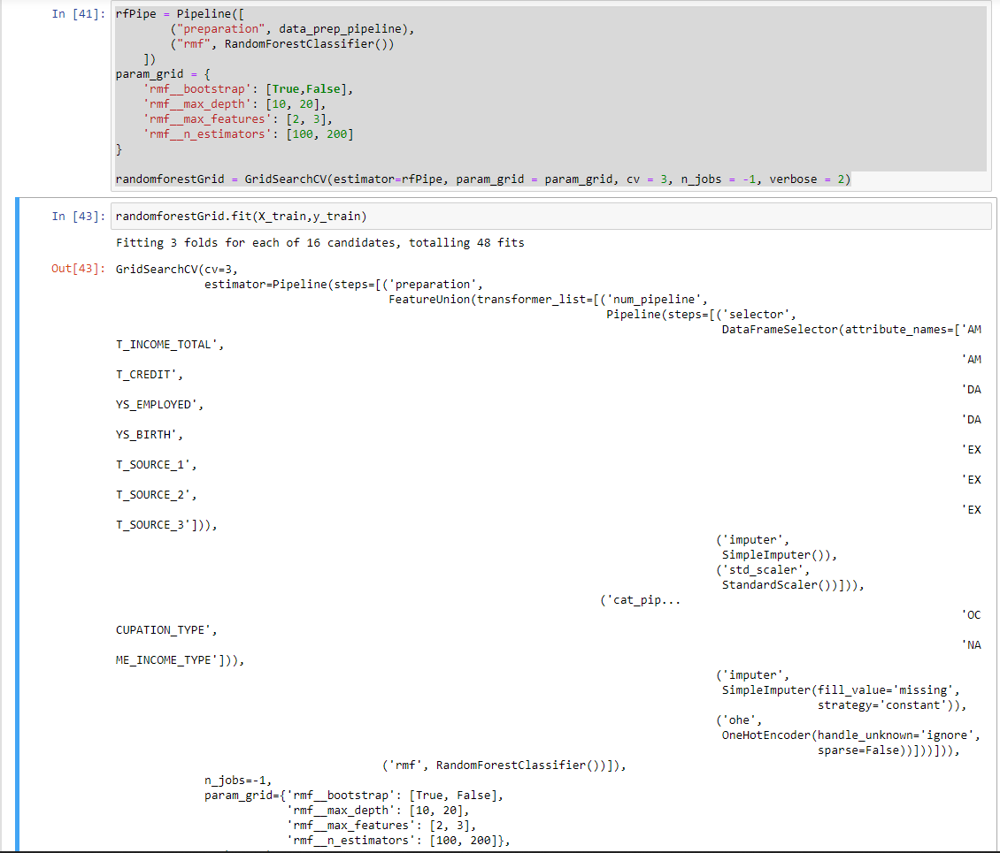

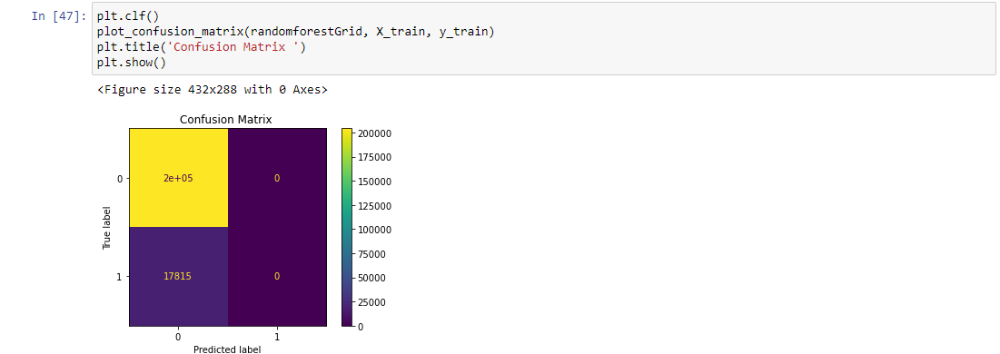

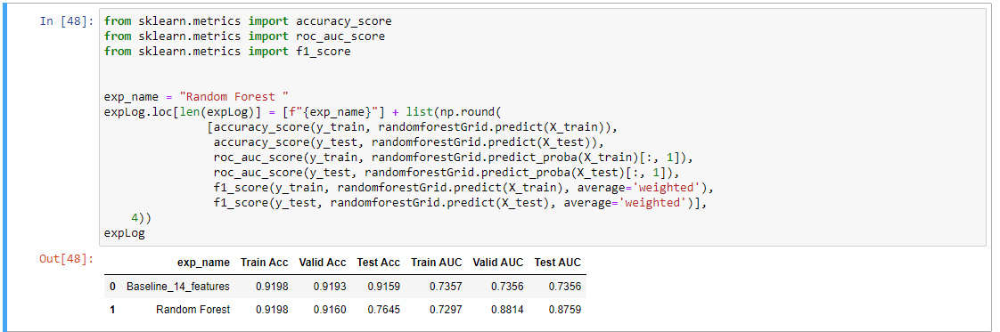

Decision Tree Classifier

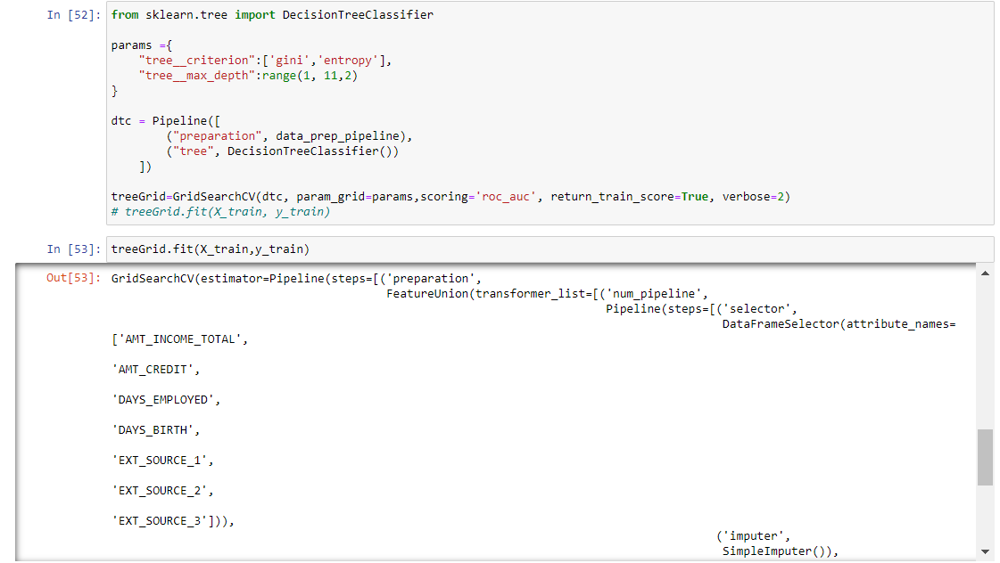

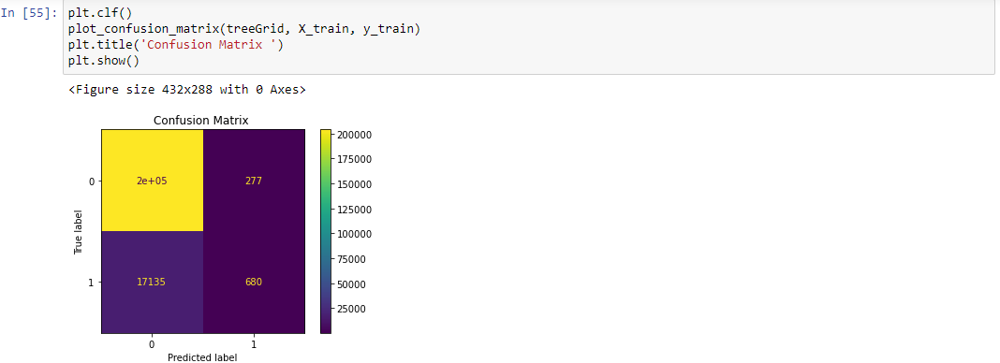

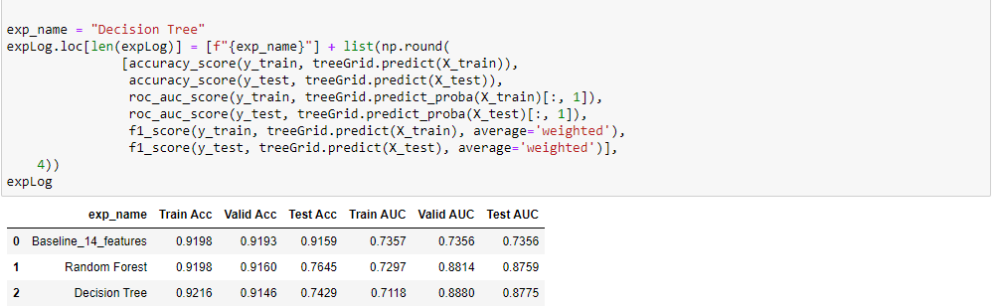

XGBoost

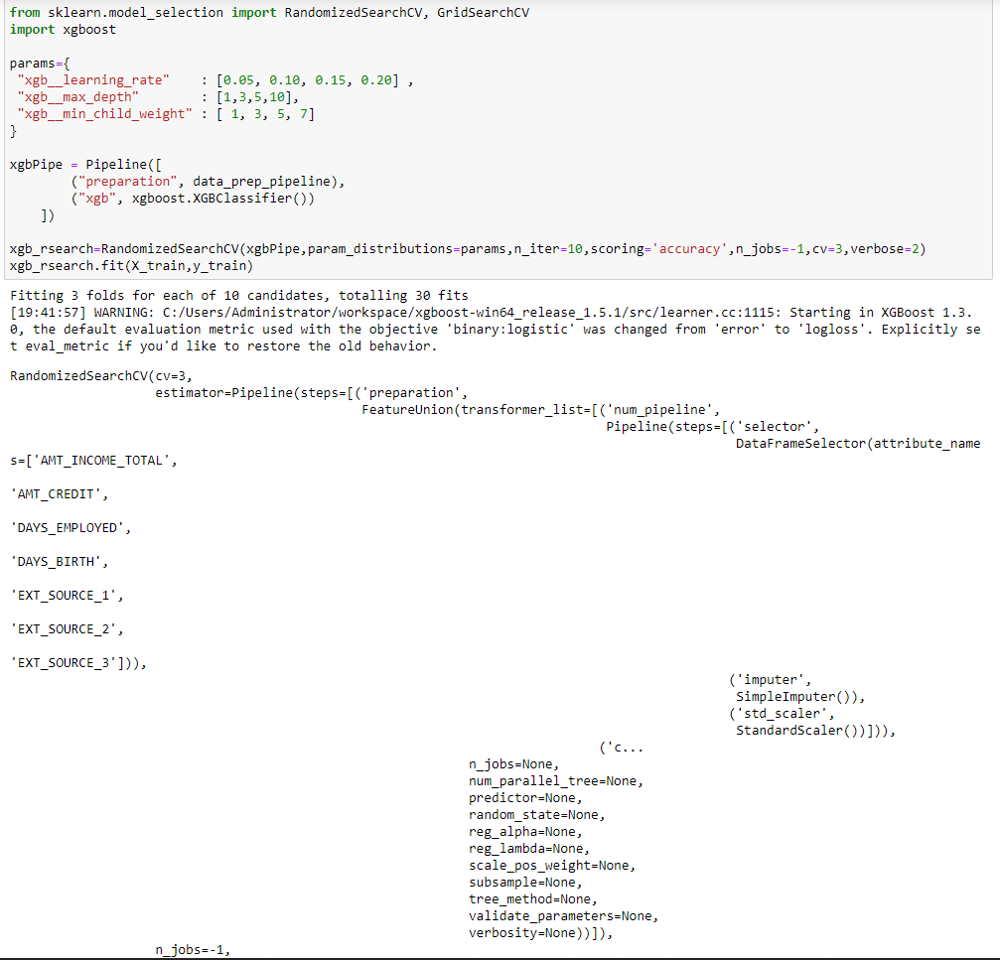

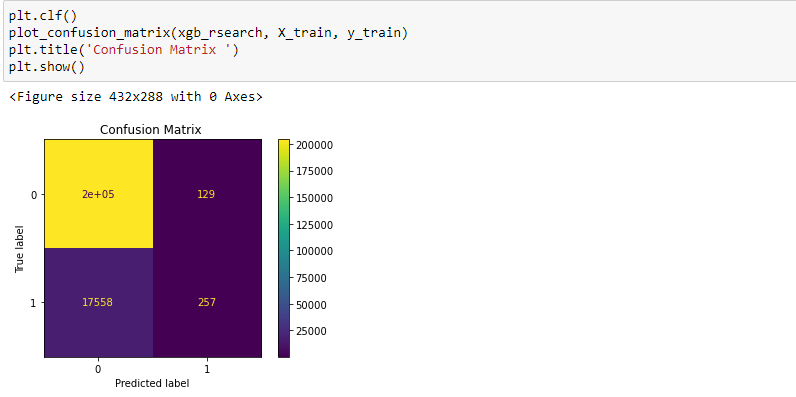

Resampling

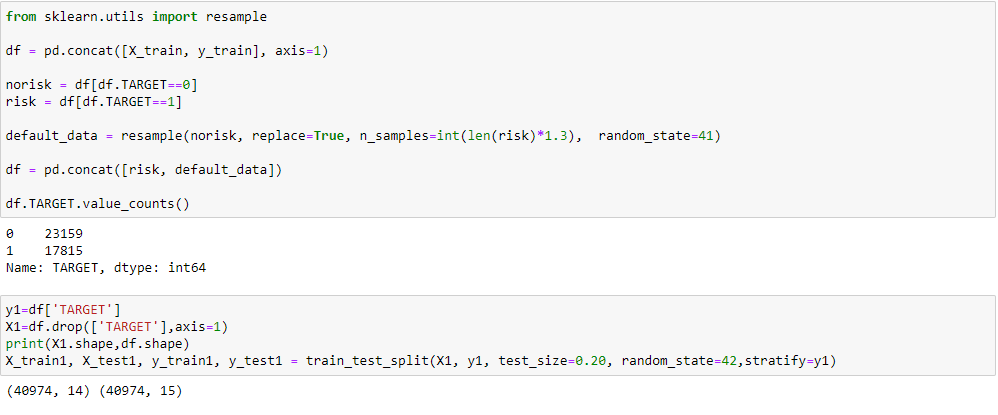

Random Forest after resampling

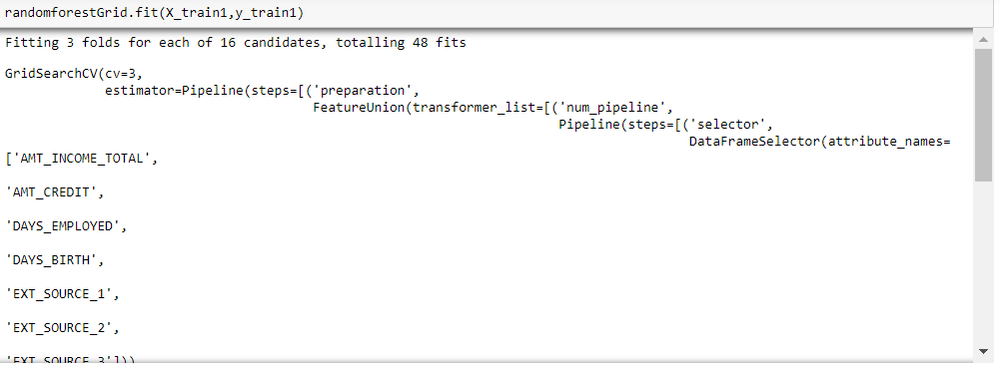

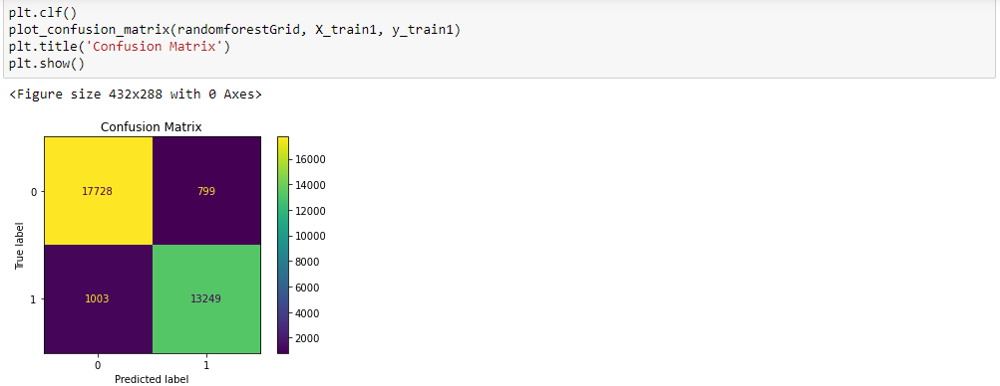

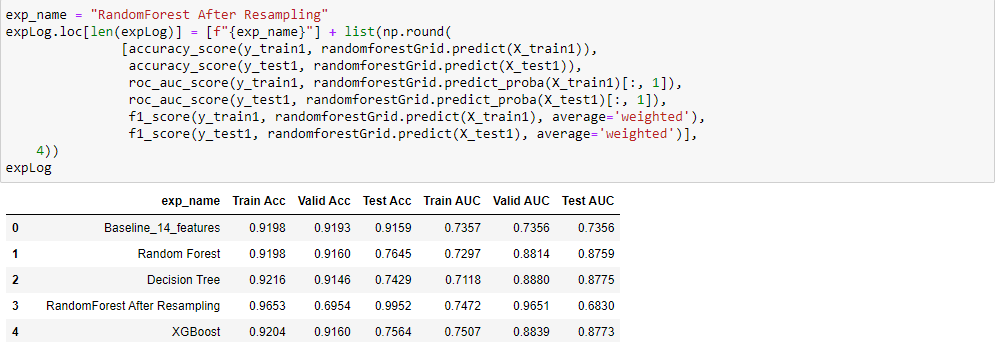

Decision tree after resampling

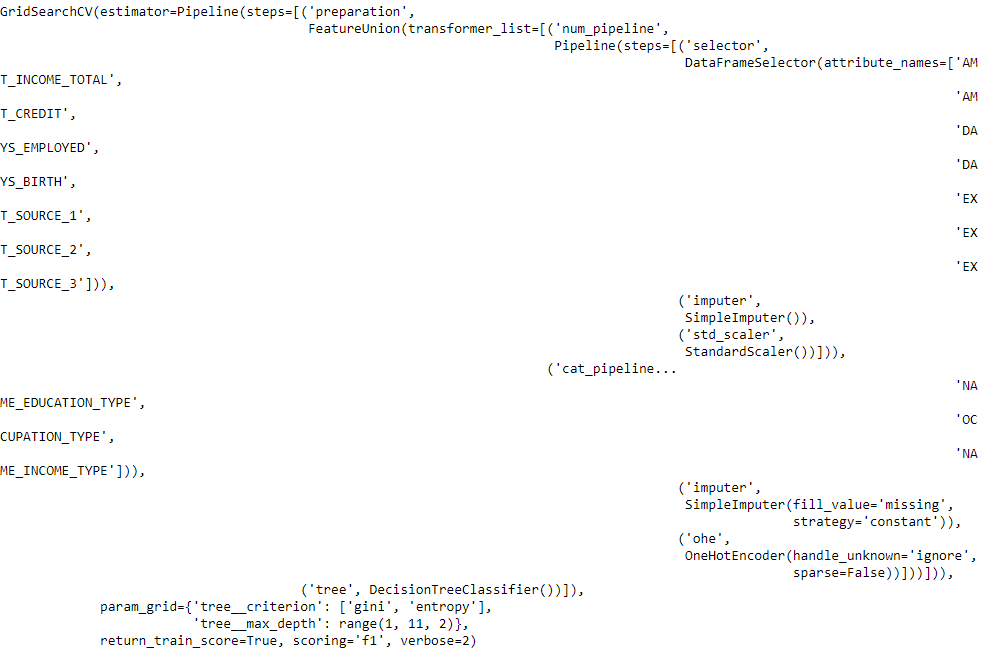

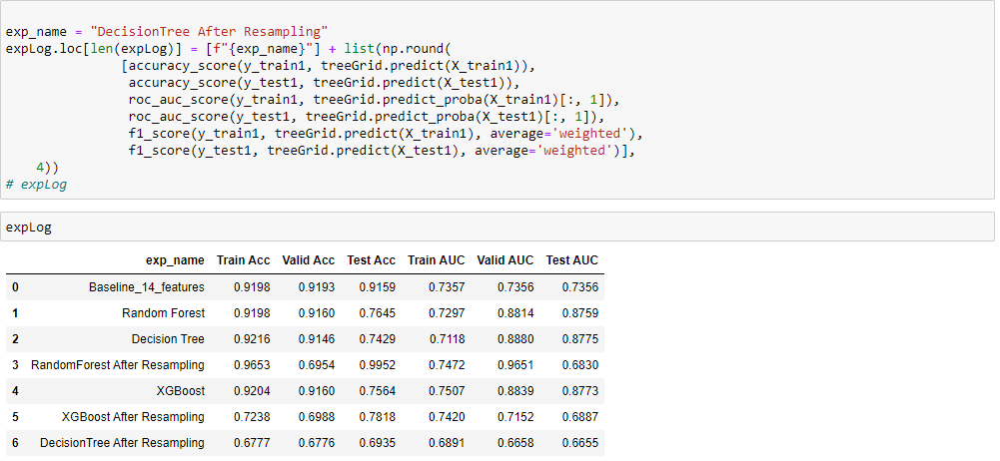

XGBoost after resampling

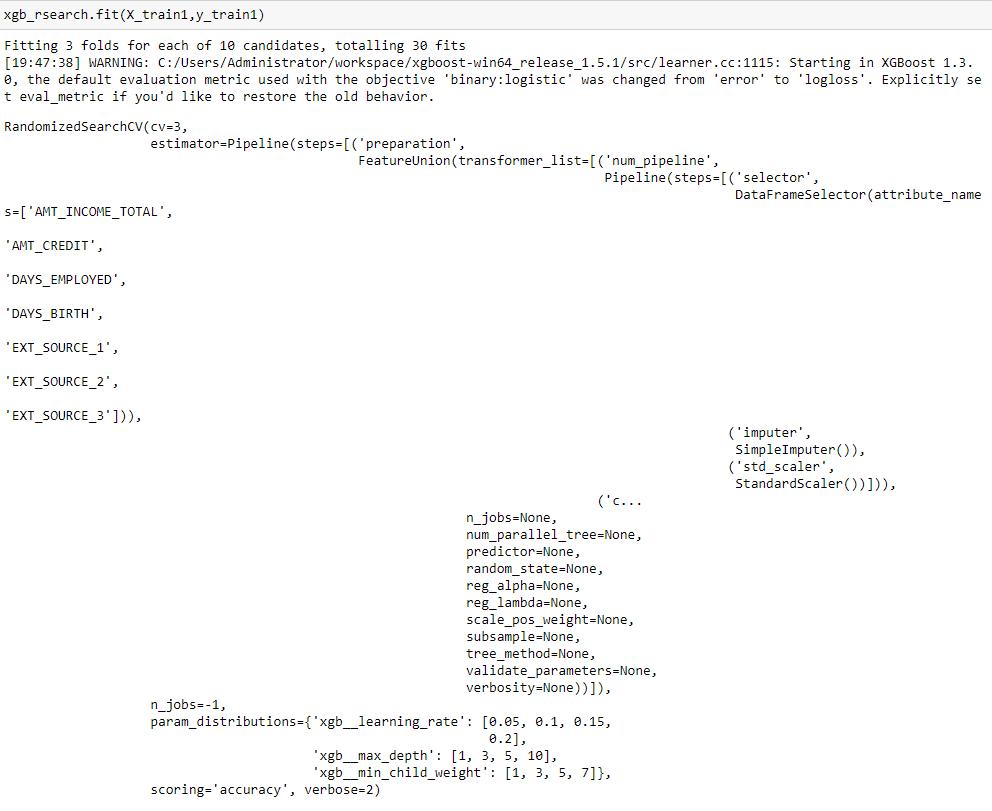

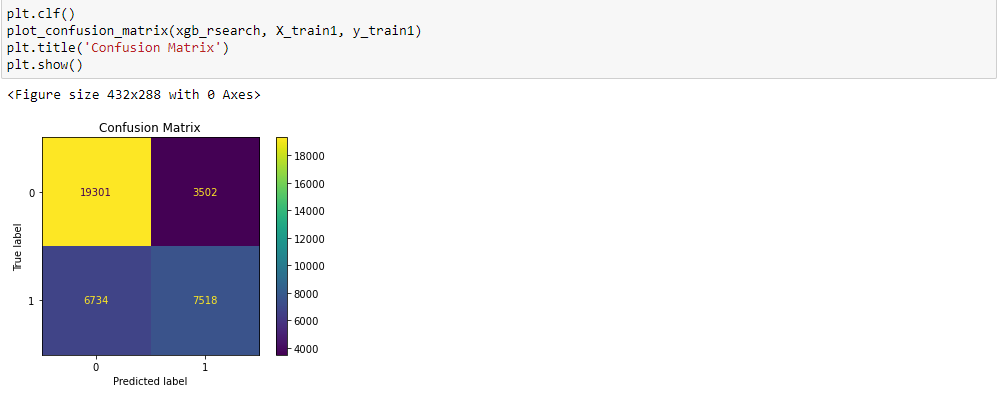

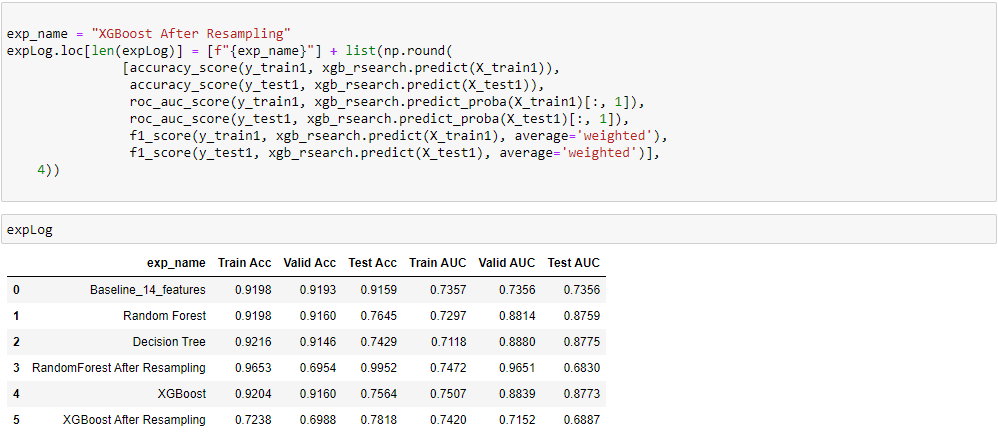

# Phase 3

# Multi Layer Perceptron (Classification) using PyTorch

In [35]:
#install it if necessary using 
!pip install torchsummary 
!pip install torchvision
from torchsummary import summary  
import torch
import torchvision
import torch.utils.data
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
from torch.autograd import Variable
from torch.utils.tensorboard import SummaryWriter

In [90]:
writer = SummaryWriter('C:/Users/rahul/Downloads')
dtype = torch.cuda.FloatTensor
torch.manual_seed(0)

In [37]:
# determine the supported device
def get_device():
    if torch.cuda.is_available():
        device = torch.device('cuda:0')
    else:
        device = torch.device('cpu') # don't have GPU 
    # return device
    return torch.device('cpu')

In [38]:
# convert a df to tensor to be used in pytorch
def df_to_tensor(df):
    device = get_device()
    return torch.from_numpy(df).float().to(device)

In [39]:
sample_x_train_agg = X_train_agg
sample_x_valid_agg = X_valid_agg
sample_x_test_agg = X_test_agg

sample_x_train = data_prep_pipeline.fit_transform(sample_x_train_agg)
sample_x_valid = data_prep_pipeline.transform(sample_x_valid_agg)
sample_x_test = data_prep_pipeline.transform(sample_x_test_agg)

sample_y_train = y_train.to_numpy()
sample_y_valid = y_valid.to_numpy()
sample_y_test = y_test.to_numpy()


# convert numpy arrays to tensors
X_train_tensor = df_to_tensor(sample_x_train)
X_validation_tensor = df_to_tensor(sample_x_valid)
X_test_tensor = df_to_tensor(sample_x_test)
y_train_tensor = df_to_tensor(sample_y_train)
y_validation_tensor = df_to_tensor(sample_y_valid)
y_test_tensor = df_to_tensor(sample_y_test)

In [40]:
# create TensorDataset in PyTorch
hcdr_train = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
hcdr_validation = torch.utils.data.TensorDataset(X_validation_tensor, y_validation_tensor)
hcdr_test = torch.utils.data.TensorDataset(X_test_tensor, y_test_tensor)

In [41]:
# create dataloader
# Todo: Change batch size to int(X_train_agg.shape[0]/5)
batch_size = X_train_agg.shape[0]
trainloader_hcdr = torch.utils.data.DataLoader(hcdr_train, batch_size=batch_size, shuffle=True, num_workers=2)
# todo: Change the batch size  to int(X_test_agg.shape[0])
batch_size = X_valid_agg.shape[0]
validloader_hcdr = torch.utils.data.DataLoader(hcdr_validation, batch_size=sample_x_valid.shape[0], shuffle=False, num_workers=2)
# todo: Change the batch size  to int(X_valid_agg.shape[0])
batch_size = X_test_agg.shape[0]
testloader_hcdr = torch.utils.data.DataLoader(hcdr_test, batch_size=sample_x_test.shape[0], shuffle=False, num_workers=2)

In [42]:
D_in = X_train_tensor.shape[1]
print(D_in)
D_hidden = 64 
D_hidden_layer_2 = 39
D_out = 1

157


In [58]:
class MLP(nn.Module):
    def __init__(self,In,H_1,Out):
        super(MLP, self).__init__()
        self.fc1 = torch.nn.Linear(In, H_1)   # hidden layer
        self.fc2 = torch.nn.Linear(H_1, H_1)
        self.fc3 = torch.nn.Linear(H_1, Out)
#         self.net=torch.nn.Sequential(    
#         torch.nn.Linear(In, H_1),   # X.matmul(W1)
    #     nn.Softmax(),           # Relu( X.matmul(W1))
        self.sig=nn.Sigmoid()
        self.drop=nn.Dropout(p=0.1)
        self.bnorm = nn.BatchNorm1d(H_1)
#         self.rel=nn.ReLU()
    #     nn.LeakyReLU(),    
#         nn.Linear(H_1, H_2),
    #     nn.Softmax(),
#         nn.Sigmoid(),
#         nn.ReLU(),
    #     nn.LeakyReLU(),
#         nn.Linear(H_1, Out),
    #     nn.Sigmoid()
    #     nn.Softmax()
#         nn.ReLU()
#         )
    def forward(self,ip):
        x = self.sig(self.fc1(ip))   # activation function for hidden layer
        x = self.bnorm(x)
        x = self.sig(self.fc2(x))   # activation function for hidden layer
        x = self.bnorm(x)
        x = self.drop(x)
        x = self.fc3(x)
        return x

Sigmoid is the main activation function used, with additional functions provided for batch normalization and dropout to ensure overfitting is not done.

In [59]:
# D_hidden=10
# D_hidden_layer_2=39
testmodel=MLP(D_in, D_hidden,D_out)
optimizer=optim.Adam(testmodel.parameters(), lr=0.001)
criterion = nn.BCEWithLogitsLoss()
device = get_device()
# if torch.cuda.is_available():
#     testing = testing.cuda()
#     criterion = criterion.cuda()    
print(testmodel)

MLP(
  (fc1): Linear(in_features=157, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=1, bias=True)
  (sig): Sigmoid()
  (drop): Dropout(p=0.1, inplace=False)
  (bnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)


The optimizer used is that of optim.Adam since it is more efiicient and produces better results than SGD. The (criterion) loss function used is BCEWithLogitsLoss, since this is a binary classifier. With Logits is preferred here over BCELoss since the inputs can be below 0.

In [60]:
def binary_acc(y_pred, y_test):
    y_pred_tag = torch.round(torch.sigmoid(y_pred))

    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc = correct_results_sum/y_test.shape[0]
    acc = torch.round(acc * 100)
    
    return acc

## Training and Evaluation(Validation)

In [61]:
n_epochs=150
t_loss=[]
v_loss=[]
for i in range(1,n_epochs+1):
    testmodel.train()
    train_loss=0.0
    ac_train=0.0
    count=0
    for data in trainloader_hcdr:
        count+=1
        inputs, targets = data[0].to(device), data[1].to(device)                
        optimizer.zero_grad()
        optrain=testmodel(inputs)
        loss_tr_m=criterion(optrain,targets.unsqueeze(1))
        acc = binary_acc(optrain,targets.unsqueeze(1))
        loss_tr_m.backward()
        optimizer.step()
        train_loss += loss_tr_m.item()
        ac_train+=acc.item()
    t_loss.append(train_loss)
    with torch.no_grad():
        testmodel.eval()
        valid_loss=0.0
        ac_valid=0.0
        c=0
        for data in validloader_hcdr:
            c+=1
            inputs, targets = data[0].to(device), data[1].to(device)
            opvalid=testmodel(inputs)
            loss_val_m=criterion(opvalid,targets.unsqueeze(1))
            acc = binary_acc(opvalid,targets.unsqueeze(1))
            valid_loss+=loss_val_m.item()
            ac_valid+=acc.item()
        v_loss.append(valid_loss)
    if i%25==0 or i==1:
        print(f"Epoch {i}")
        print(f"Train CXE loss: {np.round(train_loss/count, 3)} | Accuracy: {np.round(ac_train/count,3)}")
        print(f"Valid CXE loss: {np.round(valid_loss/c, 3)} | Accuracy: {np.round(ac_valid/c,3)}")
    writer.add_scalar("Loss/train",train_loss/count,i)
    writer.add_scalar("Accuracy/train",ac_train/count,i)
    writer.add_scalar("Loss/validation",valid_loss/c,i)
    writer.add_scalar("Accuracy/validation",ac_valid/c,i)

Epoch 1
Train CXE loss: 0.729 | Accuracy: 50.0
Valid CXE loss: 0.542 | Accuracy: 92.0
Epoch 25
Train CXE loss: 0.636 | Accuracy: 69.0
Valid CXE loss: 0.643 | Accuracy: 81.0
Epoch 50
Train CXE loss: 0.572 | Accuracy: 80.0
Valid CXE loss: 0.574 | Accuracy: 90.0
Epoch 75
Train CXE loss: 0.482 | Accuracy: 88.0
Valid CXE loss: 0.461 | Accuracy: 92.0
Epoch 100
Train CXE loss: 0.388 | Accuracy: 91.0
Valid CXE loss: 0.358 | Accuracy: 92.0
Epoch 125
Train CXE loss: 0.321 | Accuracy: 92.0
Valid CXE loss: 0.305 | Accuracy: 92.0
Epoch 150
Train CXE loss: 0.285 | Accuracy: 92.0
Valid CXE loss: 0.287 | Accuracy: 92.0


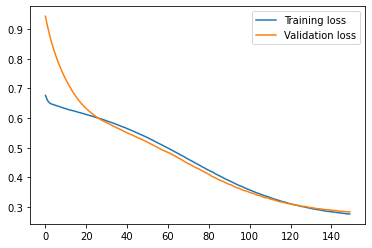

In [47]:
plt.plot(t_loss, label='Training loss')
plt.plot(v_loss, label='Validation loss')
plt.legend()
plt.show()

## Testing

In [91]:
testmodel.eval()
with torch.no_grad():
    test_loss=0.0
    ctest=0
    ac_test=0.0
    for data in testloader_hcdr:
        ctest+=1
        inputs, targets = data[0].to(device), data[1].to(device)
        optest=testmodel(inputs)
        loss_test=criterion(optest,targets.unsqueeze(1))
        acc=binary_acc(optest,targets.unsqueeze(1))
        test_loss+=loss_test.item()
        ac_test+=acc
    print(f"Test CXE loss: {np.round(test_loss/ctest, 3)} | Accuracy: {np.round(ac_test/ctest,3)}")
    writer.add_scalar("Loss/test",test_loss/ctest,1)    
    writer.add_scalar("Accuracy/test",ac_test/ctest,1)
writer.flush()
writer.close()

Test CXE loss: 0.293 | Accuracy: 92.0


# MLP for Regression

In [712]:
%%time

list_of_features = [
            'SK_ID_CURR', 'AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED',
            'DAYS_BIRTH','EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
            'CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
            'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE',
            'NAME_TYPE_SUITE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
            'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 
            'ORGANIZATION_TYPE'
        ]    
print("-+-+-"*10)                   
print("Using Application data with selected features ...vvv")
print(list_of_features)
print("-+-+-"*10)

X_train_reg = datasets["application_train"][list_of_features]
y_train_reg = datasets['application_train']["AMT_REQ_CREDIT_BUREAU_YEAR"].fillna(0)

X_train_reg, X_valid_reg, y_train_reg, y_valid_reg = train_test_split(X_train_reg, y_train_reg, test_size=0.15, random_state=42)

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_train_reg, y_train_reg, test_size=0.15, random_state=42)
print("-------------------------------------------------")
print(f"X train           shape: {X_train_reg.shape}")
print(f"X validation      shape: {X_valid_reg.shape}")
print(f"X test            shape: {X_test_reg.shape}")
print(f"Y train           shape: {y_train_reg.shape}")
print(f"Y validation      shape: {y_valid_reg.shape}")
print(f"Y test            shape: {y_test_reg.shape}")

X_train_agg_reg = Agg_Secondary_table.transform(datasets, X=X_train_reg)
X_valid_agg_reg = Agg_Secondary_table.transform(datasets, X=X_valid_reg)
X_test_agg_reg = Agg_Secondary_table.transform(datasets, X=X_test_reg)


# X_kaggle_agg_reg = Agg_Secondary_table.transform(datasets, X=X_kaggle_test)
    
sample_x_train_agg_reg = X_train_agg_reg
sample_x_valid_agg_reg = X_valid_agg_reg
sample_x_test_agg_reg = X_test_agg_reg
sample_y_train_reg = y_train_reg.to_numpy()
sample_y_valid_reg = y_valid_reg.to_numpy()
sample_y_test_reg = y_test_reg.to_numpy()

sample_x_train_reg = data_prep_pipeline.fit_transform(sample_x_train_agg_reg)
sample_x_valid_reg = data_prep_pipeline.transform(sample_x_valid_agg_reg)
sample_x_test_reg = data_prep_pipeline.transform(sample_x_test_agg_reg)


    # convert numpy arrays to tensors
X_train_tensor_reg = df_to_tensor(sample_x_train_reg)
X_validation_tensor_reg = df_to_tensor(sample_x_valid_reg)
X_test_tensor_reg = df_to_tensor(sample_x_test_reg)
y_train_tensor_reg = df_to_tensor(sample_y_train_reg)
y_validation_tensor_reg = df_to_tensor(sample_y_valid_reg)
y_test_tensor_reg = df_to_tensor(sample_y_test_reg)

# create TensorDataset in PyTorch
hcdr_train_reg = torch.utils.data.TensorDataset(X_train_tensor_reg, y_train_tensor_reg)
hcdr_validation_reg = torch.utils.data.TensorDataset(X_validation_tensor_reg, y_validation_tensor_reg)
hcdr_test_reg = torch.utils.data.TensorDataset(X_test_tensor_reg, y_test_tensor_reg)

# create dataloader
trainloader_hcdr_reg = torch.utils.data.DataLoader(hcdr_train_reg, batch_size=sample_x_train_reg.shape[0], shuffle=True, num_workers=0)
validloader_hcdr_reg = torch.utils.data.DataLoader(hcdr_validation_reg, batch_size=sample_x_valid_reg.shape[0], shuffle=False, num_workers=0)
testloader_hcdr_reg = torch.utils.data.DataLoader(hcdr_test_reg, batch_size=sample_x_test_reg.shape[0], shuffle=False, num_workers=0)


-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
Using Application data with selected features ...vvv
['SK_ID_CURR', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'DAYS_EMPLOYED', 'DAYS_BIRTH', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CODE_GENDER', 'FLAG_OWN_REALTY', 'FLAG_OWN_CAR', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'OCCUPATION_TYPE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE']
-+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+--+-+-
-------------------------------------------------
X train           shape: (222176, 21)
X validation      shape: (46127, 21)
X test            shape: (39208, 21)
Y train           shape: (222176,)
Y validation      shape: (46127,)
Y test            shape: (39208,)
Called Feature Aggregator for Datasets : `Bureau`
Called Basic Feature Aggregator
Called Feature Aggregator for Datasets : `Bureau Balance`
Called Basic Feature Aggregator
Called

KeyboardInterrupt: 

In [722]:
class MLPRegression(nn.Module):
    def __init__(self,In,H_1,Out):
        super(MLPRegression, self).__init__()
        self.fc1 = torch.nn.Linear(In, H_1)   # hidden layer
        self.fc2 = torch.nn.Linear(H_1, H_1)
#         self.fc3 = torch.nn.Linear(H_2, H_3)
        self.fc3 = torch.nn.Linear(H_1, Out)
#         self.net=torch.nn.Sequential(    
#         torch.nn.Linear(In, H_1),   # X.matmul(W1)
    #     nn.Softmax(),           # Relu( X.matmul(W1))
#         self.sig=nn.Sigmoid()
#         self.drop=nn.Dropout(p=0.1)
#         self.bnorm = nn.BatchNorm1d(H_1)
        self.rel=nn.ReLU()
    #     nn.LeakyReLU(),    
#         nn.Linear(H_1, H_2),
    #     nn.Softmax(),
#         nn.Sigmoid(),
#         nn.ReLU(),
    #     nn.LeakyReLU(),
#         nn.Linear(H_1, Out),
    #     nn.Sigmoid()
    #     nn.Softmax()
#         nn.ReLU()
#         )
    def forward(self,ip):
        x = self.rel(self.fc1(ip))   # activation function for hidden layer
#         x = self.bnorm(x)
        x = self.rel(self.fc2(x))   # activation function for hidden layer
#         x = self.bnorm(x)
#         x = self.drop(x)
        x = self.fc3(x)
#         x = self.fc4(x)
        return x
    def predict(self,test_ip):
        x = self.rel(self.fc1(test_ip))   # activation function for hidden layer
#         x = self.bnorm(x)
        x = self.rel(self.fc2(x))   # activation function for hidden layer
#         x = self.bnorm(x)
#         x = self.drop(x)
        x = self.fc3(x)
#         x = self.fc4(x)
        return x

In [723]:
D_in = X_train_tensor_reg.shape[1]
D_hidden=64
D_hidden_2=32
D_hidden_3=16
testreg=MLPRegression(D_in,D_hidden,D_out)
testreg.to(device)
print(testreg)
optimizer_reg=optim.Adam(testreg.parameters(), lr=0.001)
criterion_reg = nn.MSELoss()

MLPRegression(
  (fc1): Linear(in_features=157, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=1, bias=True)
  (rel): ReLU()
)


In [724]:
n_epochs_reg=250
t_loss_reg=[]
v_loss_reg=[]
for i in range(1,n_epochs_reg+1):
    testreg.train()
    train_loss=0.0
#     ac_train=0.0
    count=0
    for data in trainloader_hcdr_reg:
        count+=1
        inputs, targets = data[0].to(device), data[1].to(device)
#         print(targets)
        optimizer_reg.zero_grad()
        optrain=testreg(inputs)
#         print(optrain)
        loss_tr_m=criterion_reg(optrain,targets.unsqueeze(1))
#         acc = binary_acc(optrain,targets.unsqueeze(1))
        loss_tr_m.backward()
        optimizer_reg.step()
        train_loss += loss_tr_m.item()
#         ac_train+=acc.item()
    t_loss_reg.append(train_loss)
    
    testreg.eval()
    with torch.no_grad():
        valid_loss=0.0
        c=0
        for data in validloader_hcdr_reg:
            c+=1
            inputs, targets = data[0].to(device), data[1].to(device)
            opvalid=testreg(inputs)
            loss_val_m=criterion_reg(opvalid,targets.unsqueeze(1))
            valid_loss+=loss_val_m.item()
        v_loss_reg.append(valid_loss)
    if i%25==0 or i==1:
        print(f"Epoch {i}")
        print(f"Train MSE loss: {np.round(train_loss/count, 3)} | Valid MSE loss: {np.round(valid_loss/c, 3)}")

Epoch 1
Train MSE loss: 6.366 | Valid MSE loss: 6.226
Epoch 25
Train MSE loss: 3.54 | Valid MSE loss: 3.902
Epoch 50
Train MSE loss: 3.425 | Valid MSE loss: 4.068
Epoch 75
Train MSE loss: 3.369 | Valid MSE loss: 3.974
Epoch 100
Train MSE loss: 3.351 | Valid MSE loss: 3.783
Epoch 125
Train MSE loss: 3.334 | Valid MSE loss: 3.61
Epoch 150
Train MSE loss: 3.319 | Valid MSE loss: 3.454
Epoch 175
Train MSE loss: 3.306 | Valid MSE loss: 3.347
Epoch 200
Train MSE loss: 3.293 | Valid MSE loss: 3.289
Epoch 225
Train MSE loss: 3.278 | Valid MSE loss: 3.262
Epoch 250
Train MSE loss: 3.264 | Valid MSE loss: 3.25


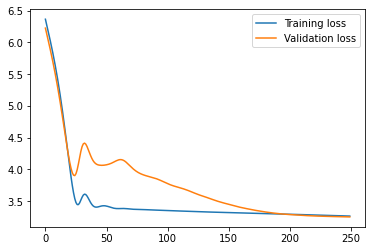

In [725]:
plt.plot(t_loss_reg, label='Training loss')
plt.plot(v_loss_reg, label='Validation loss')
plt.legend()
plt.show()

In [726]:
testreg.eval()
with torch.no_grad():
    test_loss=0.0
    ctest=0
    for data in testloader_hcdr_reg:
        ctest+=1
        inputs, targets = data[0].to(device), data[1].to(device)
        optest=testreg(inputs)
        loss_test=criterion_reg(optest,targets.unsqueeze(1))
        test_loss+=loss_test.item()
    print(f"Test MSE loss: {np.round(test_loss/ctest, 3)}")

Test MSE loss: 3.241


# Multi-headed load system

In [727]:
class Multihead(nn.Module):
    def __init__(self,In,H_1,Out):
        super(Multihead, self).__init__()
        self.fc1 = torch.nn.Linear(In, H_1)   # hidden layer
        self.fc2 = torch.nn.Linear(H_1, H_1)
        self.fc3 = torch.nn.Linear(H_1, Out)
#         self.net=torch.nn.Sequential(    
#         torch.nn.Linear(In, H_1),   # X.matmul(W1)
    #     nn.Softmax(),           # Relu( X.matmul(W1))
        self.sig=nn.Sigmoid()
        self.drop=nn.Dropout(p=0.1)
        self.bnorm = nn.BatchNorm1d(H_1)
        self.rel=nn.ReLU()
    #     nn.LeakyReLU(),    
#         nn.Linear(H_1, H_2),
    #     nn.Softmax(),
#         nn.Sigmoid(),
#         nn.ReLU(),
    #     nn.LeakyReLU(),
#         nn.Linear(H_1, Out),
    #     nn.Sigmoid()
    #     nn.Softmax()
#         nn.ReLU()
#         )
    def forward(self,ip):
        x = self.sig(self.fc1(ip))   # activation function for hidden layer
        x1 = self.bnorm(x)
        x1 = self.sig(self.fc2(x1))   # activation function for hidden layer
        x2 = self.sig(self.fc2(x))   # activation function for hidden layer
        x1 = self.bnorm(x1)
        x1 = self.drop(x1)
        x1 = self.fc3(x1)
        x2 = self.fc3(x2)
        return x1,x2

In [728]:
D_in = X_train_tensor.shape[1]
D_hidden=64
# D_hidden_2=32
# D_hidden_3=16
testmulti=Multihead(D_in,D_hidden,D_out)
testmulti.to(device)
print(testmulti)
optimizer_multi=optim.Adam(testmulti.parameters(), lr=0.001)
criterion_clas = nn.BCEWithLogitsLoss()
criterion_reg = nn.MSELoss()

Multihead(
  (fc1): Linear(in_features=157, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=1, bias=True)
  (sig): Sigmoid()
  (drop): Dropout(p=0.1, inplace=False)
  (bnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (rel): ReLU()
)


In [729]:
n_epochs_multi=200
t_loss_multi=[]
v_loss_multi=[]
for i in range(1,n_epochs_multi+1):
    testmulti.train()
    train_loss=0.0
#     ac_train=0.0
    count=0
    for clas,reg in zip(trainloader_hcdr,trainloader_hcdr_reg):
        count+=1
        inputs_clas, targets_clas = clas[0].to(device), clas[1].to(device)
        inputs_reg, targets_reg = reg[0].to(device), reg[1].to(device)
#         print(targets)
        optimizer_multi.zero_grad()
        optrain_clas,junk=testmulti(inputs_clas)
        junk1,optrain_reg=testmulti(inputs_reg)
#         print(optrain_clas)
        loss_tr_clas=criterion_clas(optrain_clas,targets_clas.unsqueeze(1))
        loss_tr_reg=criterion_reg(optrain_reg,targets_reg.unsqueeze(1))
        acc = binary_acc(optrain_clas,targets_clas.unsqueeze(1))
        loss_tr_m=loss_tr_clas+loss_tr_reg
        loss_tr_m.backward()
        optimizer_multi.step()
        train_loss += loss_tr_m.item()
#         ac_train+=acc.item()
    t_loss_multi.append(train_loss)
    
    testmulti.eval()
    with torch.no_grad():
        valid_loss=0.0
        c=0
#         ac_valid=0.0
        for clas,reg in zip(validloader_hcdr,validloader_hcdr_reg):
            c+=1
            inputs_clas, targets_clas = clas[0].to(device), clas[1].to(device)
            inputs_reg, targets_reg = reg[0].to(device), reg[1].to(device)
            opvalid_clas,junk=testmulti(inputs_clas)
            junk1,opvalid_reg=testmulti(inputs_reg)
            loss_val_clas=criterion_clas(opvalid_clas,targets_clas.unsqueeze(1))
            loss_val_reg=criterion_reg(opvalid_reg,targets_reg.unsqueeze(1))
#             acc = binary_acc(opvalid_clas,targets_clas.unsqueeze(1))
            loss_val_m=loss_val_clas+loss_val_reg
            valid_loss+=loss_val_m.item()
#             ac_valid+=acc.item()    
        v_loss_multi.append(valid_loss)
    if i%25==0 or i==1:
        print(f"Epoch {i}")
        print(f"Train CXE+MSE loss: {np.round(train_loss/count, 3)} | Valid CXE+MSE loss: {np.round(valid_loss/c, 3)}")

Epoch 1
Train CXE+MSE loss: 8.157 | Valid CXE+MSE loss: 7.754
Epoch 25
Train CXE+MSE loss: 4.38 | Valid CXE+MSE loss: 6.786
Epoch 50
Train CXE+MSE loss: 4.046 | Valid CXE+MSE loss: 9.27
Epoch 75
Train CXE+MSE loss: 3.992 | Valid CXE+MSE loss: 7.791
Epoch 100
Train CXE+MSE loss: 3.958 | Valid CXE+MSE loss: 7.623
Epoch 125
Train CXE+MSE loss: 3.926 | Valid CXE+MSE loss: 7.459
Epoch 150
Train CXE+MSE loss: 3.897 | Valid CXE+MSE loss: 7.173
Epoch 175
Train CXE+MSE loss: 3.869 | Valid CXE+MSE loss: 6.889
Epoch 200
Train CXE+MSE loss: 3.842 | Valid CXE+MSE loss: 6.573


In [730]:
testmulti.eval()
with torch.no_grad():
    test_loss=0.0
    ctest=0
    for clas,reg in zip(testloader_hcdr,testloader_hcdr_reg):
        ctest+=1
        inputs_clas, targets_clas = clas[0].to(device), clas[1].to(device)
        inputs_reg, targets_reg = reg[0].to(device), reg[1].to(device)
        optest_clas,junk=testmulti(inputs_clas)
        junk1,optest_reg=testmulti(inputs_reg)
        loss_test_clas=criterion_clas(optest_clas,targets_clas.unsqueeze(1))
        loss_test_reg=criterion_reg(optest_reg,targets_reg.unsqueeze(1))
        loss_test=loss_test_clas+loss_test_reg
        test_loss+=loss_test.item()
    print(f"Test CSE+MSE loss: {np.round(test_loss/ctest, 3)}")

Test CSE+MSE loss: 6.541


# Tensorboard

In [2]:
!pip install tensorboard

In [92]:
logdir= 'C:/Users/rahul/Downloads'

In [98]:
# %load_ext tensorboard
# Uncomment below line
# !tensorboard dev upload --logdir runs --name "HCDR-Group-2 Initial experiment" --description "Simple comparison of several hyperparameters" --one_shot
# or
%tensorboard --logdir runs

# or 
# !tensorboard --logdir runs4

# Pipeline of MLP

In [ ]:
!pip install skorch

In [ ]:
from skorch import NeuralNetClassifier
from skorch import NeuralNetRegressor
from skorch import NeuralNet

In [732]:
lr=0.001
net_class = NeuralNetClassifier(
    module=testmodel,
    criterion = criterion,
    optimizer=optim.Adam,
    lr=lr,
    verbose=3
)

In [733]:
pipe_class = Pipeline([
    ('scale', StandardScaler()),
    ('net', net_class),
])
pipe_class.fit(X_train_tensor.cpu().numpy(), y_train_tensor.unsqueeze(1).cpu().numpy())

  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.2637       0.9193        0.2548  5.0896
      2        0.2553       0.9197        0.2545  5.0497
      3        0.2533       0.9198        0.2549  5.0657
      4        0.2523       0.9198        0.2556  4.8889
      5        0.2515       0.9198        0.2560  4.8640
      6        0.2509       0.9196        0.2579  5.0358
      7        0.2504       0.9197        0.2593  5.0173
      8        0.2497       0.9196        0.2601  4.8654
      9        0.2492       0.9196        0.2614  4.8734
     10        0.2485       0.9196        0.2606  4.9366


Pipeline(steps=[('scale', StandardScaler()),
                ('net',
                 <class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=MLP(
    (fc1): Linear(in_features=157, out_features=64, bias=True)
    (fc2): Linear(in_features=64, out_features=64, bias=True)
    (fc3): Linear(in_features=64, out_features=1, bias=True)
    (sig): Sigmoid()
    (drop): Dropout(p=0.1, inplace=False)
    (bnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  ),
))])

In [734]:
net_reg = NeuralNetRegressor(
    module=testreg,
    criterion = criterion_reg,
    optimizer=optim.Adam,
    lr=lr,
    verbose=3
)

In [735]:
pipe_reg = Pipeline([
    ('scale', StandardScaler()),
    ('net', net_reg),
])
pipe_reg.fit(X_train_tensor_reg.cpu().numpy(), y_train_tensor_reg.unsqueeze(1).cpu().numpy())

  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        3.7350        3.2887  4.2092
      2        3.2860        3.2643  4.1878
      3        3.2330        3.1971  4.2496
      4        3.1788        3.1586  4.2563
      5        3.1770        3.1442  4.1295
      6        3.1292        3.1351  4.2645
      7        3.1109        3.1348  4.3053
      8        3.0816        3.1350  4.2884
      9        3.0763        3.1431  4.1533
     10        3.0656        3.1436  4.0735


Pipeline(steps=[('scale', StandardScaler()),
                ('net',
                 <class 'skorch.regressor.NeuralNetRegressor'>[initialized](
  module_=MLPRegression(
    (fc1): Linear(in_features=157, out_features=64, bias=True)
    (fc2): Linear(in_features=64, out_features=64, bias=True)
    (fc3): Linear(in_features=64, out_features=1, bias=True)
    (rel): ReLU()
  ),
))])

## Evaluation metrics
Submissions are evaluated on [area under the ROC curve](http://en.wikipedia.org/wiki/Receiver_operating_characteristic) between the predicted probability and the observed target.

The SkLearn `roc_auc_score` function computes the area under the receiver operating characteristic (ROC) curve, which is also denoted by AUC or AUROC. By computing the area under the roc curve, the curve information is summarized in one number. 

```python
from sklearn.metrics import roc_auc_score
>>> y_true = np.array([0, 0, 1, 1])
>>> y_scores = np.array([0.1, 0.4, 0.35, 0.8])
>>> roc_auc_score(y_true, y_scores)
0.75
```

### AUC score

In [67]:
from sklearn.metrics import roc_auc_score, roc_curve
roc_auc_score(y_train_tensor.cpu().detach().numpy(), testmodel(X_train_tensor).cpu().detach().numpy())

0.733096485360679

# Submission File Prep

For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

```python 
SK_ID_CURR,TARGET
100001,0.1
100005,0.9
100013,0.2
etc.
```

In [ ]:
sk_id=X_kaggle_test['SK_ID_CURR']

In [ ]:
X_train_ag=Agg_Secondary_table.transform(datasets, X=X_kaggle_test)

In [ ]:
sample_x_train_ag = X_train_ag

In [ ]:
sample_x_tra = data_prep_pipeline.transform(sample_x_train_ag)

In [ ]:
X_tra_tensor = df_to_tensor(sample_x_tra)

In [ ]:
sample_x_tra.shape

In [ ]:
hcdr_kaggle = torch.utils.data.TensorDataset(X_tra_tensor)

In [ ]:
batch_size = X_train_ag.shape[0]
kaggletestloader_hcdr = torch.utils.data.DataLoader(hcdr_kaggle, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
testmodel.eval()
op_kaggle_list=[]
with torch.no_grad():
    for data in kaggletestloader_hcdr:
#         print(data[0])
        inputs=data[0].to(device)
        opkaggle=testmodel(inputs)
        opkaggle=torch.sigmoid(opkaggle)
#         op=torch.round(opkaggle)
        op_kaggle_list.append(opkaggle.cpu().detach().numpy())
#     print(len(op_kaggle_list))

In [ ]:
sk_id_op=sk_id.to_frame()
sk_id_op["TARGET"]=pd.DataFrame(op_kaggle_list[0])
sk_id_op.to_csv("MLP.csv",index=False)

# Kaggle submission via the command line API

In [ ]:
! kaggle competitions submit -c home-credit-default-risk -f MLP.csv -m "MLP submission"

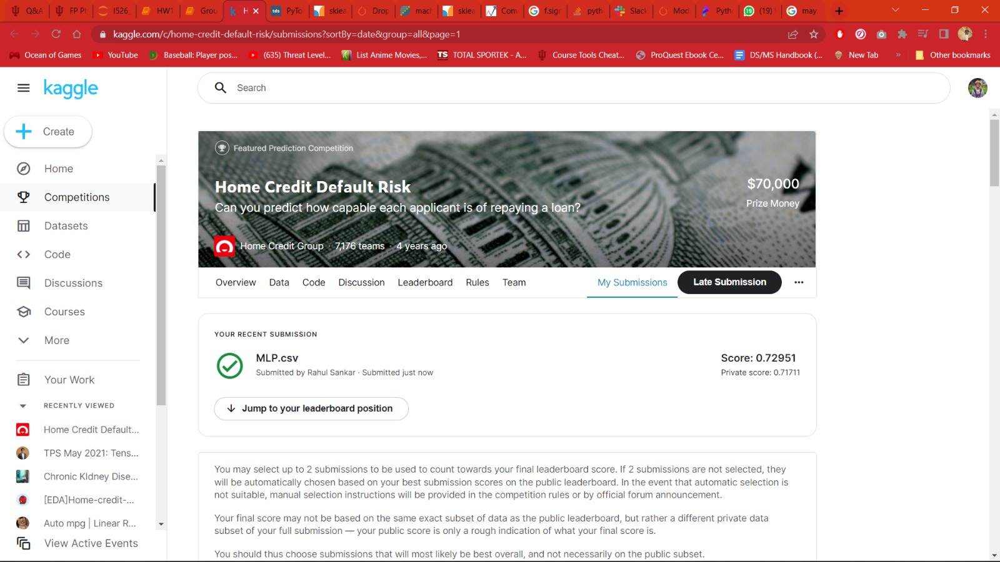

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

Model Evaluation

In [ ]:
from sklearn.tree import DecisionTreeClassifier

params ={
    "tree__criterion":['gini','entropy'],
    "tree__max_depth":range(1, 11,2)
}

dtc = Pipeline([
        ("preparation", data_prep_pipeline),
        ("tree", DecisionTreeClassifier())
    ])

treeGrid=GridSearchCV(dtc, param_grid=params,scoring='f1', return_train_score=True)

In [ ]:
treeGrid.fit(X_train,y_train)

## Abstract
Home Credit Default Risk is a project where we determine the credit worthiness of people that have applied for the loans. In previous phases, we had completed basic EDA, Feature Engineering and ran the baseline model for logistic regression and the hyperparameter tuning for XGBoost model. In Phase 2, we have significantly improved our project. We have updated the EDA, implemented robust Feature engineering for all dataset files, and did experimental analysis for hyper-parameter tuning for Logistic Regression, XGBoost and Random Forest Models. We conducted experiments using both original imbalanced data as well as resampled data. After comparison we found out that the XGBoost model was the best model. For the deep learning Pytorch model, we built two MLP models. One for classification and one for regression. The mail goal in this phase has been building a multi-layer perception (MLP) model in PyTorch for loan default classification and using Tensorboard to visualize the  results of training in real time. Each model has 3 layers. Sigmoid activation function is used for classification and ReLU for regression along with Cross entropy loss. We have acheived a Test accuracy of 92 and Test CXE loss of 0.29.

## Project Description and Data
### Data Description
Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders. Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities. Various statistical and machine learning methods can be used to make these predictions.
### Data Files Overview:
There are 7 different sources of data:

1. application_train/application_test: the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating 0: the loan was repaid or 1: the loan was not repaid. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
2. bureau: data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
3. bureau_balance: monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
4. previous_application: previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
5. POS_CASH_BALANCE: monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
6. credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
7. installments_payment: payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

### Tasks Performed in each phase
#### Phase 1
EDA and Building a baseline pipeline model
#### Phase 2
Feature Engineering and Hyperparameter tuning, Feature Selection ensemble methods
#### Phase 3
Build a multi-layer perception (MLP) model in PyTorch for loan default classification
Using Tensorboard to visualise the  results of training in real time
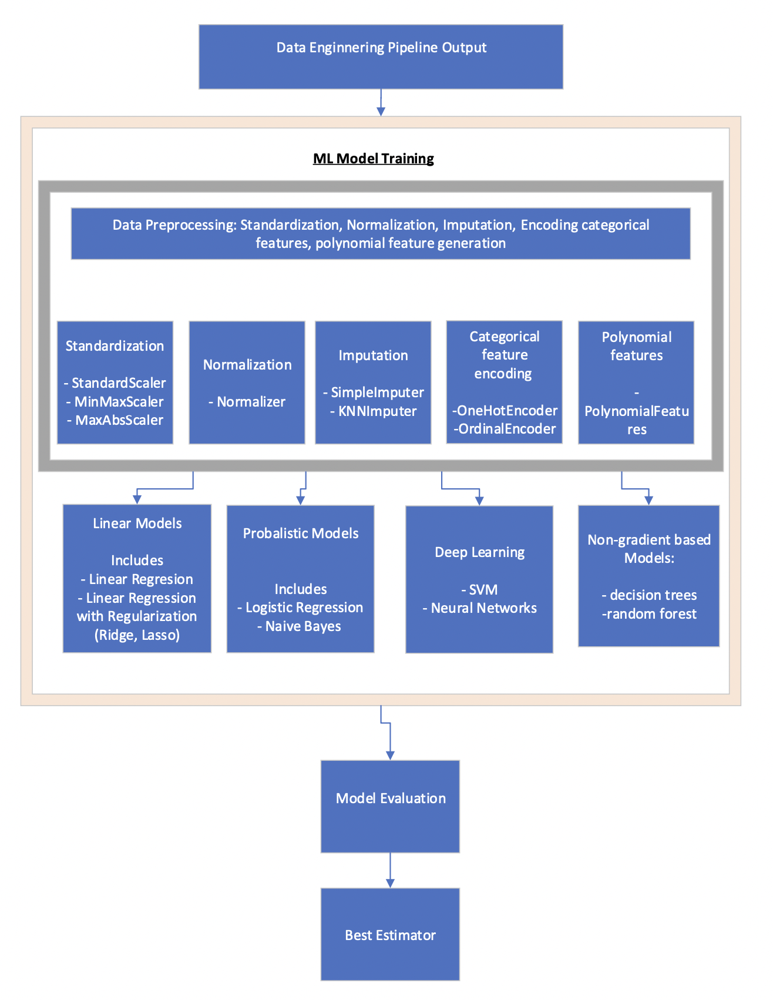

## Neural Network
Classification:
Has 3 layers( 157 input, 64 hidden and 1 ouput)
Uses sigmoid activation function
Regression:
Has 3 layers( 157 input, 64 hidden and 1 ouput)
Uses ReLU activation function
## Hyperparameters
- Loss function: Cross Entropy Loss (BCEwithLogitsLoss())
- Learning Rate: 0.001
- Optimizer: Adam
- Classification : Test CXE Loss: 0.29 |Accuracy - 92.0
- Test CSE+MSE = 8.66 

Classification:
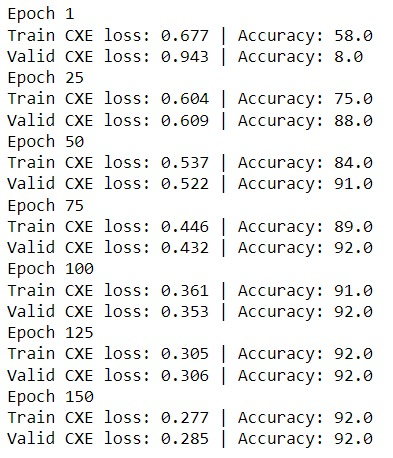

Regression
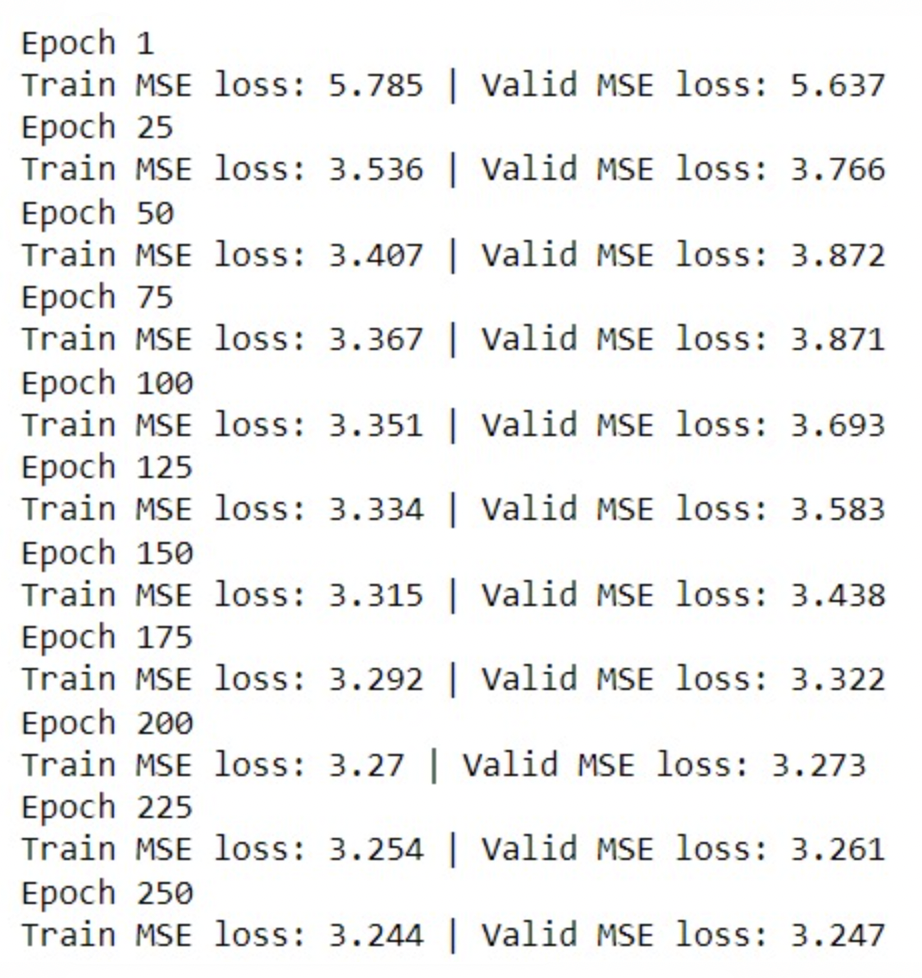

## Data Leakage Control
On secondary datasets, we performed feature engineering and combined it with application train and application test. We chose the top 50 numeric features from the application train based on their connection with the target variable. The final dataset included all of the numeric features as well as the engineering features. We employed pipelines to prevent data leaking during numeric and categorical feature preparation. For Cross Validation, all of the models were designed as a single pipeline with a data pipeline and an estimator.

## Modelling Pipelines
### Pipeline for MLP classification
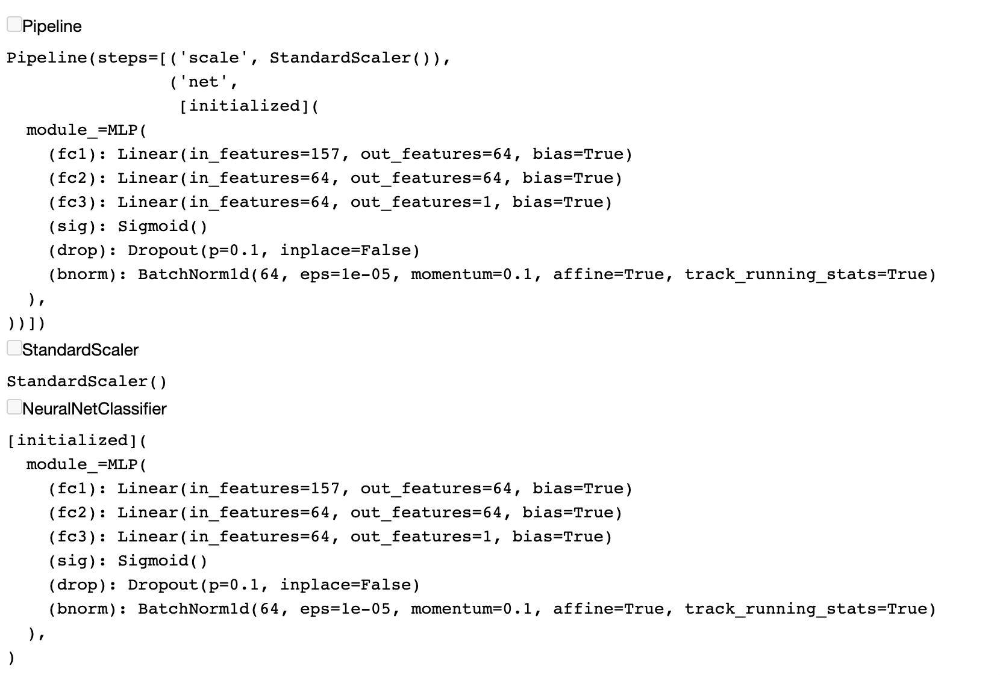

### Pipeline for MLP regression
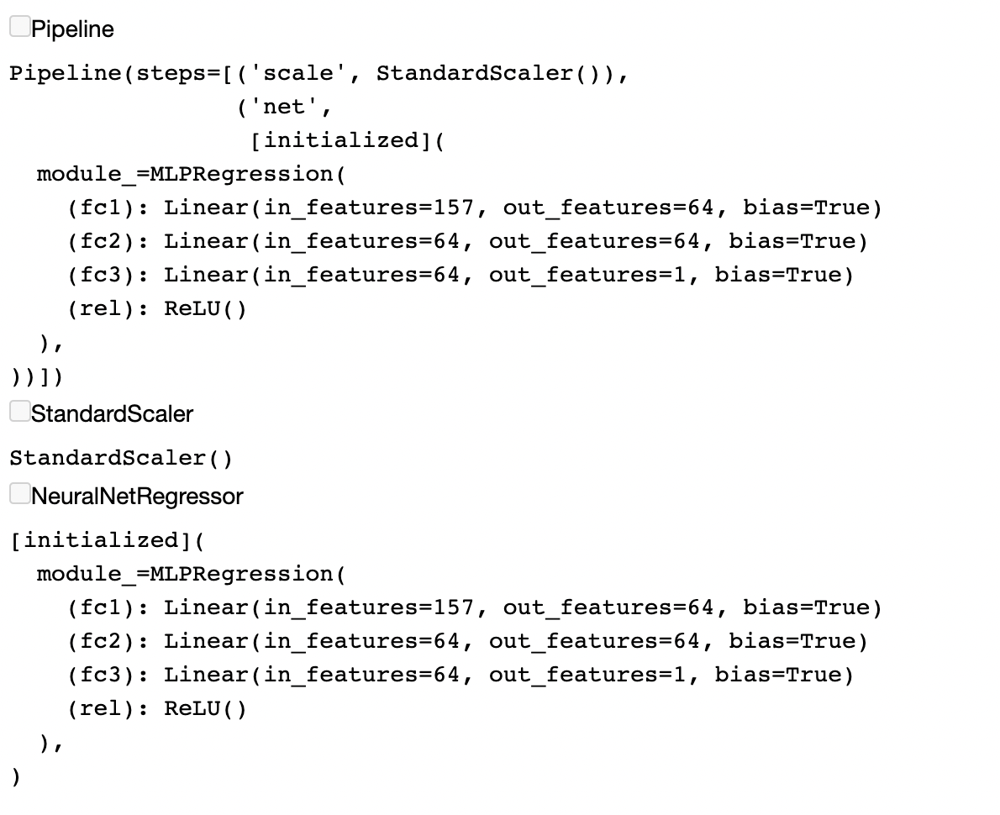

## Experiments and Results
#### For classification MLP
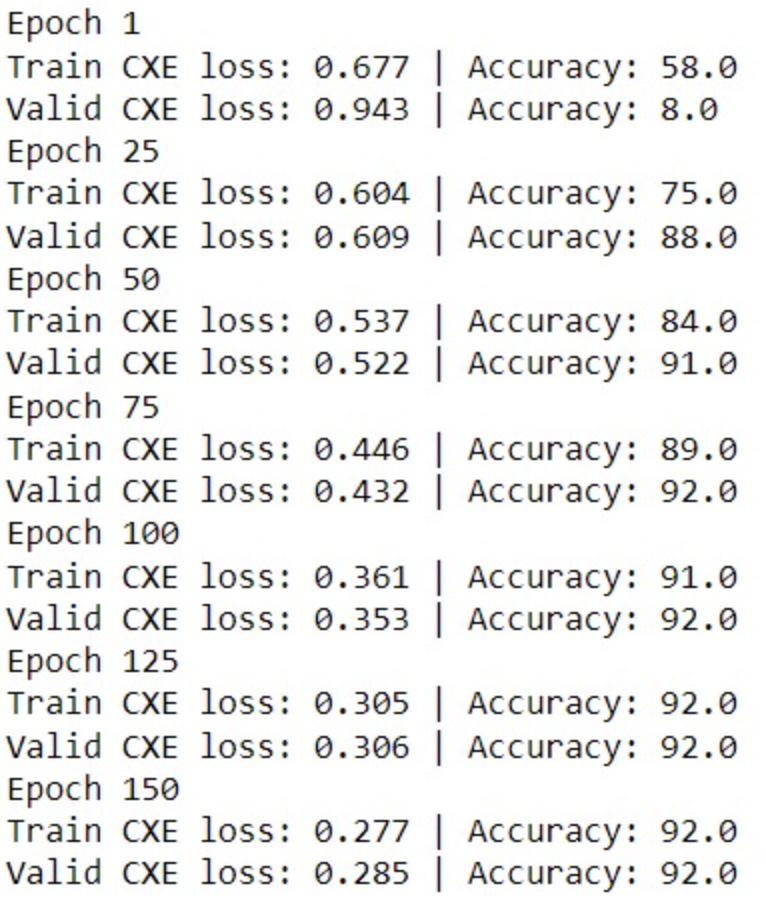


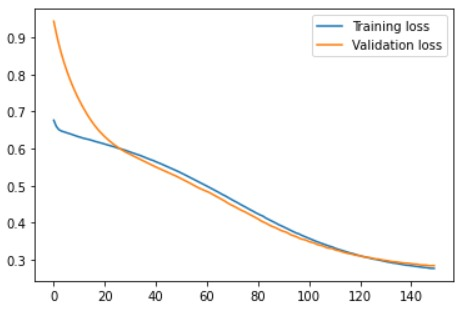

- Tensor Board results
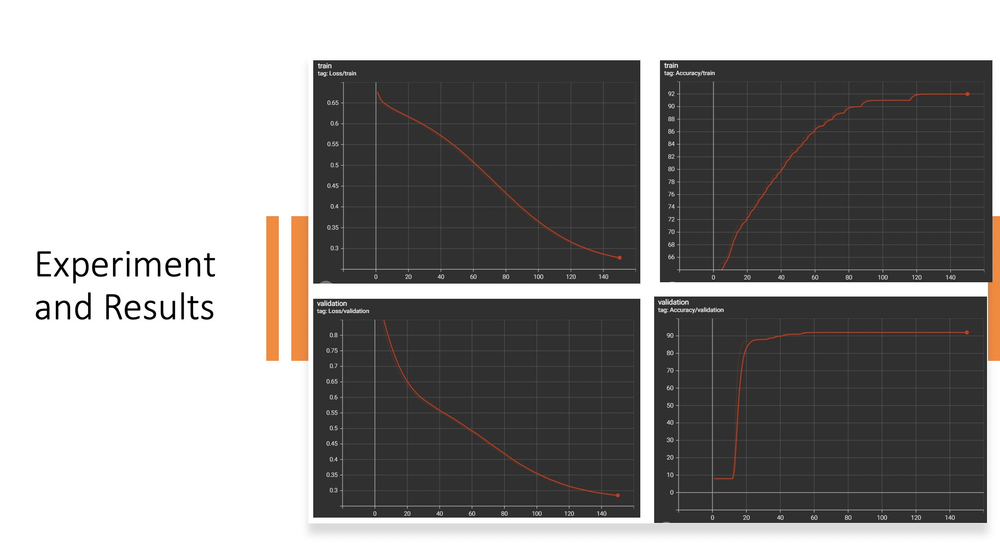

#### For Regression MLP
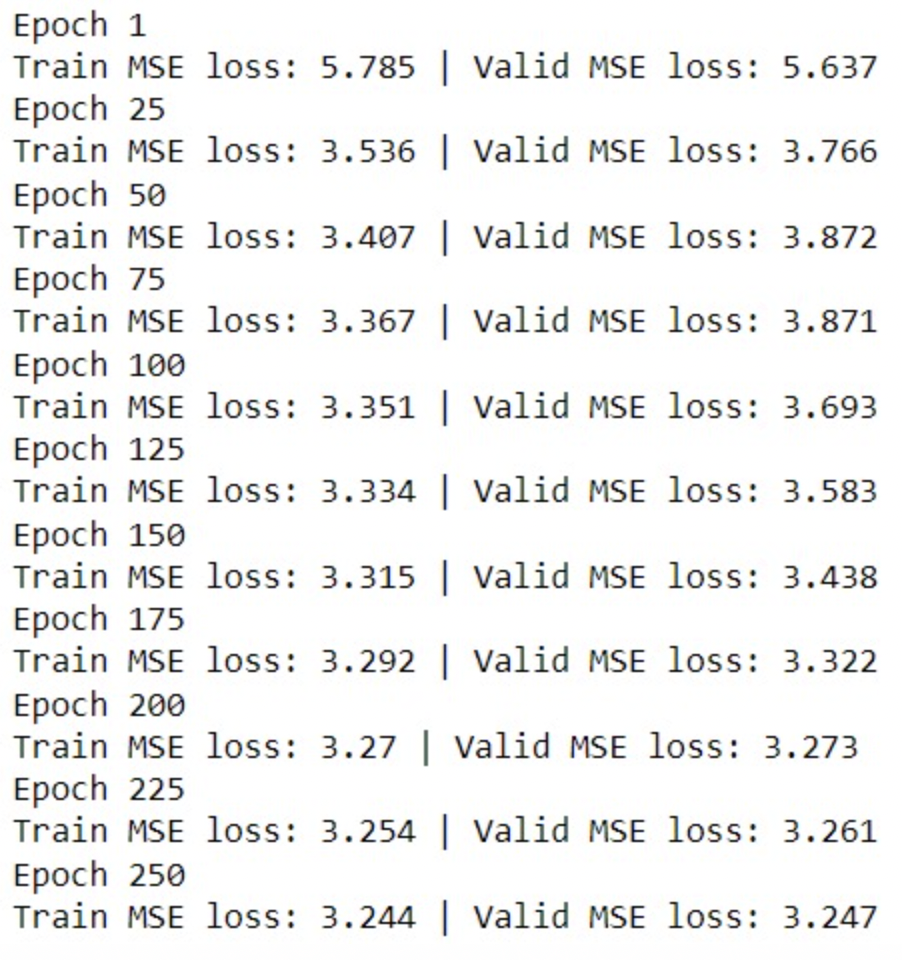


#### For multi headed load default system 

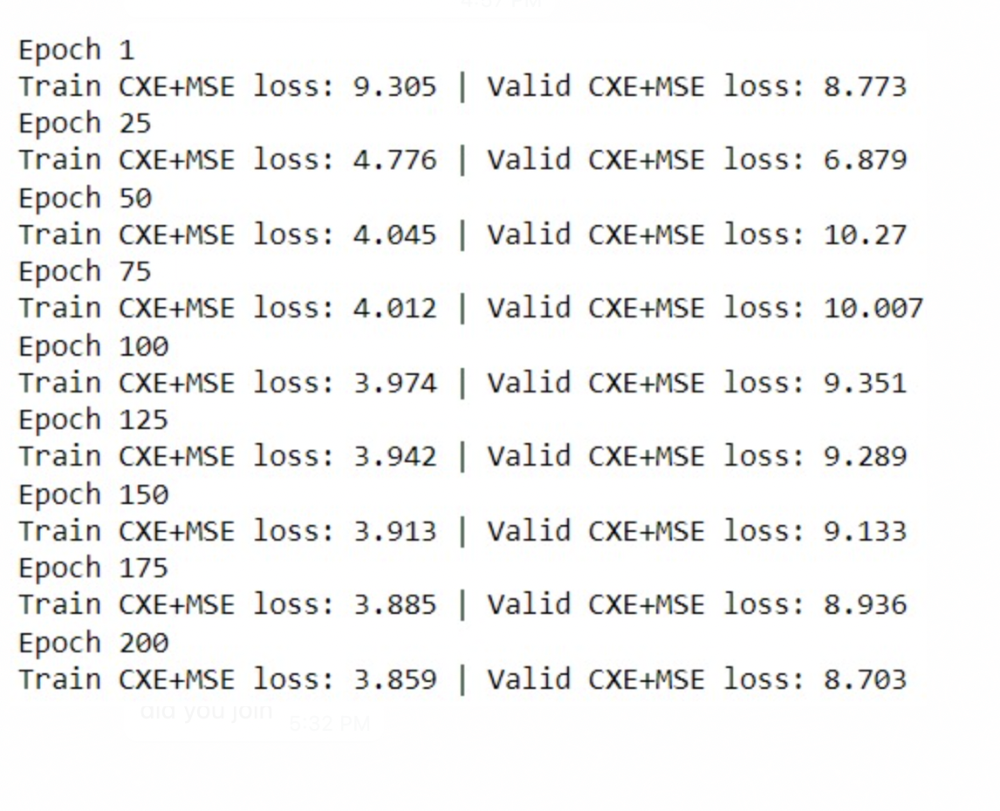

Test CSE + MSE loss = 8.66 for multi headed load default system 

## Conclusion
The project's goal is to identify those who will be able to pay back their debts. Based on the applicant's prior applications, credit bureau history, payment installments, and other important criteria such as sources of income, number of family members, dependents, and so on, our Machine Learning model can forecast whether or not the individual should be granted a loan. For target value 1, all of the machine learning models that had been trained using skewed data performed poorly. As evidenced by the confusion matrices, the model was retrained using resampled data, and predictions for Target value 1 improved dramatically. Because we used a smaller selection of data to train the Deep Learning Model, it did not perform as well as typical machine learning models.
In this phase 3 we have built an MLP using PyTorch to determine if the candidate is eligible for loan.We achieved a test accuracy of 92% with the test loss of 0.29.Additionally, we have also implemented a MLP model for regression and built a multi headed load default system that combines the loss functions of both the prior models.Subsequently, we have created a pipeline that incorporates all the three models.


# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)


#  TODO: Predicting Loan Repayment with Automated Feature Engineering in Featuretools

Read the following:
* feature engineering via Featuretools library: 
  * https://github.com/Featuretools/predict-loan-repayment/blob/master/Automated%20Loan%20Repayment.ipynb
* https://www.analyticsvidhya.com/blog/2018/08/guide-automated-feature-engineering-featuretools-python/
* feature engineering paper: https://dai.lids.mit.edu/wp-content/uploads/2017/10/DSAA_DSM_2015.pdf
* https://www.analyticsvidhya.com/blog/2017/08/catboost-automated-categorical-data/